proposed models: mobilenet, mobilenetv2, mobilenetv3, nasnetmobile, efficientnetv2b0, efficientnetlite

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import seaborn as sns
import random
from collections import Counter
import gc

import albumentations as A

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn import metrics

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import EditedNearestNeighbours, NearMiss
from imblearn.combine import SMOTEENN

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.applications import MobileNetV2, NASNetMobile, MobileNet
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers.schedules import ExponentialDecay

from efficientnet_lite import EfficientNetLiteB0, EfficientNetLiteB1

from keras.regularizers import l2
import keras_tuner as kt

from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import GridSearchCV

seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)

num_classes=4

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='./logs')
pd.set_option('display.max_colwidth', None)

categories = ["adenocarcinoma", "large_cell_carcinoma", "normal", "squamous_cell_carcinoma"]

C:\Users\ivans\anaconda3\Lib\site-packages\albumentations\__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.3'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [3]:
# TRAIN data

directory_train = r"lung_classification_dataset\train"

adenocarcinoma_dir = directory_train + "/" + categories[0]
large_cell_carcinoma_dir = directory_train + "/" + categories[1]
normal_dir = directory_train + "/" + categories[2]
squamos_cell_carcinoma_dir = directory_train + "/" + categories[3]

path_list_train = []
category_list_train = []
for category in categories:
    folder_path = os.path.join(directory_train, category)
    folder_image_contents = os.listdir(folder_path)
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        path_list_train.append(image_file_path)
        category_list_train.append(category)

path_series_train = pd.Series(path_list_train, name="filepath")
category_series_train = pd.Series(category_list_train, name="category")

image_paths_train_df = pd.DataFrame(path_series_train).join(category_series_train)

#print(image_paths_train_df.head())   

# VAL data
directory_val = r"lung_classification_dataset\valid"

adenocarcinoma_dir = directory_val + "/" + categories[0]
large_cell_carcinoma_dir = directory_val + "/" + categories[1]
normal_dir = directory_val + "/" + categories[2]
squamos_cell_carcinoma_dir = directory_val + "/" + categories[3]

path_list_val = []
category_list_val = []
for category in categories:
    folder_path = os.path.join(directory_val, category)
    folder_image_contents = os.listdir(folder_path)
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        path_list_val.append(image_file_path)
        category_list_val.append(category)

path_series_val = pd.Series(path_list_val, name="filepath")
category_series_val = pd.Series(category_list_val, name="category")

image_paths_val_df = pd.DataFrame(path_series_val).join(category_series_val)

#print(image_paths_val_df.head())

# TEST data
directory_test = r"lung_classification_dataset\test"

adenocarcinoma_dir = directory_test + "/" + categories[0]
large_cell_carcinoma_dir = directory_test + "/" + categories[1]
normal_dir = directory_test + "/" + categories[2]
squamos_cell_carcinoma_dir = directory_test + "/" + categories[3]

path_list_test = []
category_list_test = []
for category in categories:
    folder_path = os.path.join(directory_test, category)
    folder_image_contents = os.listdir(folder_path)
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        path_list_test.append(image_file_path)
        category_list_test.append(category)

path_series_test = pd.Series(path_list_test, name="filepath")
category_series_test = pd.Series(category_list_test, name="category")

image_paths_test_df = pd.DataFrame(path_series_test).join(category_series_test)

# print(image_paths_test_df.head())

# Image resizing

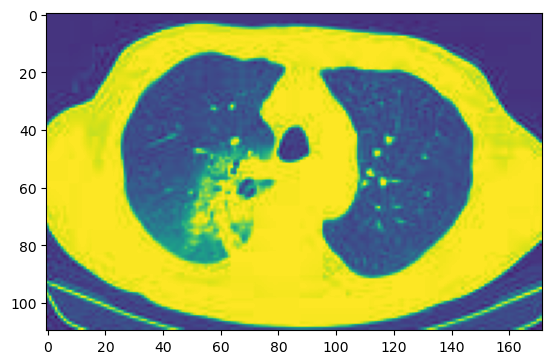

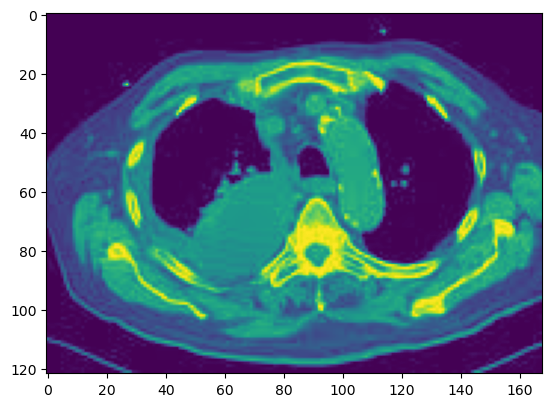

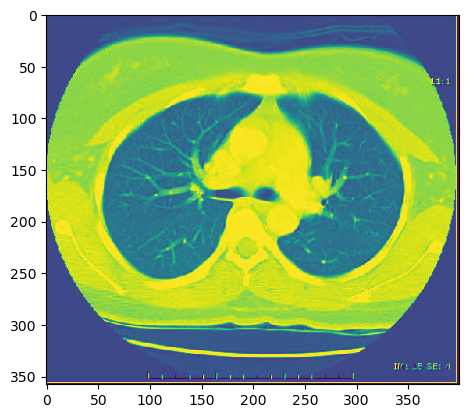

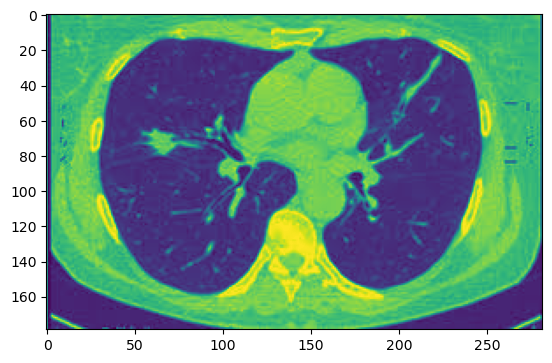

In [5]:
# TRAIN data
size_data_train = {}
is_grayscale = 0 # enter 0 for color, 1 for grayscale
for category in categories:
    folder_path = os.path.join(directory_train, category)
    folder_image_contents = os.listdir(folder_path)
    image_sizes_in_one_category = {}
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_file_path)
        height, width, channel = img.shape
        if(str(height) + " x " + str(width) in image_sizes_in_one_category):
            image_sizes_in_one_category[str(height) + " x " + str(width)] += 1
        else:
            image_sizes_in_one_category[str(height) + " x " + str(width)] = 1
    plt.imshow(cv2.imread(image_file_path, is_grayscale))
    plt.show()
    size_data_train[category] = image_sizes_in_one_category
size_data_train_df = pd.DataFrame(size_data_train)
#print(size_data_train)
#print(size_data_train_df.head(10))

# VAL data
size_data_val = {}
is_grayscale = 0 # enter 0 for color, 1 for grayscale
for category in categories:
    folder_path = os.path.join(directory_val, category)
    folder_image_contents = os.listdir(folder_path)
    image_sizes_in_one_category = {}
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_file_path)
        height, width, channel = img.shape
        if(str(height) + " x " + str(width) in image_sizes_in_one_category):
            image_sizes_in_one_category[str(height) + " x " + str(width)] += 1
        else:
            image_sizes_in_one_category[str(height) + " x " + str(width)] = 1
    #plt.imshow(cv2.imread(image_file_path, is_grayscale))
    #plt.show()
    size_data_val[category] = image_sizes_in_one_category
size_data_val_df = pd.DataFrame(size_data_val)
#print(size_data_val)
#print(size_data_val_df.head(10))

# TEST data
size_data_test = {}
is_grayscale = 0 # enter 0 for color, 1 for grayscale
for category in categories:
    folder_path = os.path.join(directory_test, category)
    folder_image_contents = os.listdir(folder_path)
    image_sizes_in_one_category = {}
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_file_path)
        height, width, channel = img.shape
        if(str(height) + " x " + str(width) in image_sizes_in_one_category):
            image_sizes_in_one_category[str(height) + " x " + str(width)] += 1
        else:
            image_sizes_in_one_category[str(height) + " x " + str(width)] = 1
    #plt.imshow(cv2.imread(image_file_path, is_grayscale))
    #plt.show()
    size_data_test[category] = image_sizes_in_one_category
size_data_test_df = pd.DataFrame(size_data_test)
#print(size_data_test)
#print(size_data_test_df.head(10))

In [6]:
# TRAIN data

dataset_train = []
desired_size = 256
for index, row in image_paths_train_df.iterrows():
    filepath = row["filepath"]
    img = cv2.imread(filepath, is_grayscale)
    img = cv2.resize(img, (desired_size, desired_size))
    label = row["category"]
    dataset_train.append([img, label])
    
random.shuffle(dataset_train)

#print(dataset_train[0][0].shape)
#print(dataset_train[0][1])
#plt.imshow(dataset_train[0][0])
#plt.show()

# VAL data

dataset_val = []
desired_size = 256
for index, row in image_paths_val_df.iterrows():
    filepath = row["filepath"]
    img = cv2.imread(filepath, is_grayscale)
    img = cv2.resize(img, (desired_size, desired_size))
    label = row["category"]
    dataset_val.append([img, label])
    
random.shuffle(dataset_val)

#print(dataset_val[0][0].shape)
#print(dataset_val[0][1])
#plt.imshow(dataset_val[0][0])
#plt.show()

# TEST data

dataset_test = []
desired_size = 256
for index, row in image_paths_test_df.iterrows():
    filepath = row["filepath"]
    img = cv2.imread(filepath, is_grayscale)
    img = cv2.resize(img, (desired_size, desired_size))
    label = row["category"]
    dataset_test.append([img, label])
    
random.shuffle(dataset_test)

#print(dataset_test[0][0].shape)
#print(dataset_test[0][1])
#plt.imshow(dataset_test[0][0])
#plt.show()

# Image smoothing

# Histogram Equilization

In [9]:
# TRAIN data
CLIP_LIMIT = 2.0
TILE_GRID = (8, 8)

for data in dataset_train:
    clahe = cv2.createCLAHE(clipLimit=CLIP_LIMIT, tileGridSize=TILE_GRID)
    data[0] = data[0].astype(np.uint8)
    data[0] = clahe.apply(data[0])
    #blurred = cv2.GaussianBlur(data[0], (5,5), 0)  # Apply Gaussian blur
    #data[0] = cv2.addWeighted(data[0], 2.0, blurred, -1.0, 0)  # Strengthen details
    #data[0] = np.clip(data[0], 0, 255).astype(np.uint8)

# VAL data
for data in dataset_val:
    clahe = cv2.createCLAHE(clipLimit=CLIP_LIMIT, tileGridSize=TILE_GRID)
    data[0] = data[0].astype(np.uint8)
    data[0] = clahe.apply(data[0])
    #blurred = cv2.GaussianBlur(data[0], (5,5), 0)  # Apply Gaussian blur
    #data[0] = cv2.addWeighted(data[0], 2.0, blurred, -1.0, 0)  # Strengthen details
    #data[0] = np.clip(data[0], 0, 255).astype(np.uint8)

# TEST data
for data in dataset_test:
    clahe = cv2.createCLAHE(clipLimit=CLIP_LIMIT, tileGridSize=TILE_GRID)
    data[0] = data[0].astype(np.uint8)
    data[0] = clahe.apply(data[0])
    #blurred = cv2.GaussianBlur(data[0], (5,5), 0)  # Apply Gaussian blur
    #data[0] = cv2.addWeighted(data[0], 2.0, blurred, -1.0, 0)  # Strengthen details
    #data[0] = np.clip(data[0], 0, 255).astype(np.uint8)


# Morphological operations

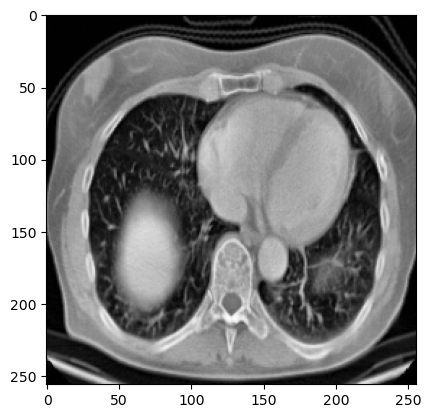

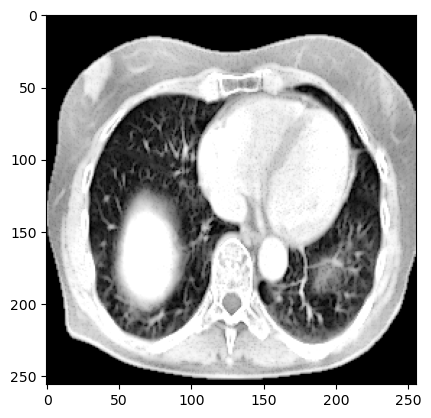

In [11]:
# TRAIN data
kernel = np.ones((5, 5), np.uint8)

plt.imshow(dataset_train[0][0], cmap='grey')
plt.show()

for data in dataset_train:
    img = data[0].astype(np.uint8)
    binr = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    # morph = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel)
    contours = cv2.findContours(binr, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
    largest_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros_like(binr)
    cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    binr = cv2.bitwise_and(img, img, mask=mask)
    
    laplacian = cv2.Laplacian(binr, cv2.CV_64F)
    laplacian = np.uint8(np.abs(laplacian))  # Convert to uint8
    sharpened = cv2.addWeighted(binr, 1.5, laplacian, -0.5, 0)

    # invert = cv2.bitwise_not(img)
    # closed = cv2.morphologyEx(invert, cv2.MORPH_CLOSE, kernel)
    # opened = cv2.morphologyEx(binr, cv2.MORPH_OPEN, kernel)
    #gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
    data[0] = sharpened

plt.imshow(dataset_train[0][0], cmap='grey')
plt.show()

# VAL data
for data in dataset_val:
    img = data[0].astype(np.uint8)
    binr = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    # morph = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel)
    contours = cv2.findContours(binr, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
    largest_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros_like(binr)
    cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    binr = cv2.bitwise_and(img, img, mask=mask)
    
    laplacian = cv2.Laplacian(binr, cv2.CV_64F)
    laplacian = np.uint8(np.abs(laplacian))  # Convert to uint8
    sharpened = cv2.addWeighted(binr, 1.5, laplacian, -0.5, 0)
    
    # invert = cv2.bitwise_not(img)
    # closed = cv2.morphologyEx(invert, cv2.MORPH_CLOSE, kernel)
    # opened = cv2.morphologyEx(binr, cv2.MORPH_OPEN, kernel)
    # gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
    data[0] = sharpened

# TEST data
for data in dataset_test:
    img = data[0].astype(np.uint8)
    binr = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    # morph = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel)
    contours = cv2.findContours(binr, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
    largest_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros_like(binr)
    cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    binr = cv2.bitwise_and(img, img, mask=mask)
    
    laplacian = cv2.Laplacian(binr, cv2.CV_64F)
    laplacian = np.uint8(np.abs(laplacian))  # Convert to uint8
    sharpened = cv2.addWeighted(binr, 1.5, laplacian, -0.5, 0)
    # invert = cv2.bitwise_not(img)
    # closed = cv2.morphologyEx(invert, cv2.MORPH_CLOSE, kernel)
    # opened = cv2.morphologyEx(binr, cv2.MORPH_OPEN, kernel)
    # gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
    data[0] = sharpened

# Data normalization

In [13]:
max_pixel_value = max(data[0].max() for data in dataset_train)
print("Max pixel value before normalization:", max_pixel_value)

min_pixel_value = min(data[0].min() for data in dataset_train)
print("Min pixel value before normalization:", min_pixel_value)


Max pixel value before normalization: 255
Min pixel value before normalization: 0


In [14]:
# using min-max scaling

print(dataset_train[0][0].min(), dataset_train[0][0].max())



# TRAIN data
for data in dataset_train:
    img = data[0]/255.0
    data[0] = img

#plt.imshow(dataset_train[0][0])
#plt.show()

# VAL data
for data in dataset_val:
    img = data[0]/255.0
    data[0] = img

#plt.imshow(dataset_val[0][0])
#plt.show()

# TEST data
for data in dataset_test:
    img = data[0]/255.0
    data[0] = img

#plt.imshow(dataset_test[0][0])
#plt.show()
print(dataset_train[0][0].min(), dataset_train[0][0].max())



0 255
0.0 1.0


# Data splitting

In [16]:
x_train, y_train = [], []
x_val, y_val = [], []
x_test, y_test = [], []

for image, category in dataset_train:
    x_train.append(image)
    y_train.append(category)

for image, category in dataset_val:
    x_val.append(image)
    y_val.append(category)

for image, category in dataset_test:
    x_test.append(image)
    y_test.append(category)


x_train = np.array(x_train)
y_train = np.array(y_train)
x_val = np.array(x_val)
y_val = np.array(y_val)
x_test = np.array(x_test)
y_test = np.array(y_test)

label_encoder = LabelEncoder()

y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)
y_test = label_encoder.transform(y_test)

# apply one-hot encoding

y_val = to_categorical(y_val, num_classes=num_classes)
y_test = to_categorical(y_test, num_classes=num_classes)

y_test_labels = np.argmax(y_test, axis=1)

for i in range(0, len(label_encoder.classes_)):
    print(i, end="")
    print(" = ", end="")
    print(label_encoder.classes_[i])

0 = adenocarcinoma
1 = large_cell_carcinoma
2 = normal
3 = squamous_cell_carcinoma


# Handling data imbalance

In [18]:
# use data augmentation (albumentation library)
print(x_train.shape)
number_of_samples = 1226
x_train = np.expand_dims(x_train, axis=-1)
x_train = np.repeat(x_train, 3, axis=-1)
print(x_train.shape)
print("before: ", Counter(y_train))


transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.SafeRotate(limit=15, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.GaussianBlur(blur_limit=(3, 5), p=0.3),
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5)
])

augmented_x_train = []
augmented_y_train = []

for train_img, train_label in zip(x_train, y_train):
    augmented_image = transform(image=train_img)["image"]
    augmented_x_train.append(augmented_image)
    augmented_y_train.append(train_label)

x_train = np.append(x_train, augmented_x_train)
y_train = np.append(y_train, augmented_y_train)

x_train = x_train.reshape(number_of_samples, desired_size, desired_size, 3)
print(x_train.shape)
print("after: ", Counter(y_train))
y_train = to_categorical(y_train, num_classes=num_classes)

# x_train = np.repeat(x_train, 3, axis=-1)
x_val = np.expand_dims(x_val, axis=-1)
x_val = np.repeat(x_val, 3, axis=-1)
x_test = np.expand_dims(x_test, axis=-1)
x_test = np.repeat(x_test, 3, axis=-1)

(613, 256, 256)
(613, 256, 256, 3)
before:  Counter({0: 195, 3: 155, 2: 148, 1: 115})


C:\Users\ivans\anaconda3\Lib\site-packages\albumentations\core\validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


(1226, 256, 256, 3)
after:  Counter({0: 390, 3: 310, 2: 296, 1: 230})


# Data models

In [20]:
pipeline = 10
def all_evaluation(y_test_labels, y_pred_labels, model, epoch_num, batch, history, start_time, end_time, is_tuning=False):
    output_path = 'output' + str(pipeline) + '\\' + model + '\\' + model + '_epoch' + str(epoch_num) + '_batch' + str(batch)
    #table_path = 'output' + str(pipeline) + '\\' + model + '\\accuracy_table.txt'
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    #if not os.path.exists(table_path):
    #   os.makedirs(table_path)

    # Accuracy, precision, recall, f1 score
    print(metrics.classification_report(y_test_labels, y_pred_labels, digits=4))
    report = metrics.classification_report(y_test_labels, y_pred_labels, digits=4)
    cm = metrics.confusion_matrix(y_test_labels, y_pred_labels)
    
    print(f"The Cohen's Kappa Score is: {metrics.cohen_kappa_score(y_test_labels, y_pred_labels)}")

    duration = end_time-start_time
    
    print(f"The execution time is {duration} seconds")
    
    cohen = metrics.cohen_kappa_score(y_test_labels, y_pred_labels)
    with open(output_path + '\\evaluation_report.txt', 'w') as f:
        f.write(report)
        f.write('\n')
        f.write("The execution time is " + str(duration) + " seconds")
        f.write('\n')
        f.write('The Cohen\'s Kappa Score is: ' + str(cohen))

    report_dict = metrics.classification_report(y_test_labels, y_pred_labels, digits=4, output_dict=True)
    accuracy = report_dict['accuracy']

    
    #with open(table_path, 'w') as f:
    #    line = f.readlines()
    #    line[0] = line.strip() + accuracy + " & "


    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Adenocarcinoma', 'Large_cell_carcinoma', 'normal', 'squamous_cell_carcinoma'],
                yticklabels=['Adenocarcinoma', 'Large_cell_carcinoma', 'normal', 'squamous_cell_carcinoma'])
    plt.xlabel("Predicted Labels", fontsize=14)
    plt.ylabel("True Labels", fontsize=14)
    plt.savefig(output_path + '\\confusion_matrix.jpg', bbox_inches='tight')
    plt.show()

    if history:
        # Accuracy Plot
        plt.figure(figsize=(8, 6))
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.title('Model Accuracy')
        plt.savefig(output_path + '\\accuracy_plot.jpg', bbox_inches='tight')

        # Loss Plot
        plt.figure(figsize=(8, 6))
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.title('Model Loss')
        plt.savefig(output_path + '\\loss_plot.jpg', bbox_inches='tight')

In [21]:
epoch_list = [10, 20, 30, 40, 50]
batch_list = [16, 32, 64]

## MobileNetV2

In [ ]:
%%time

model_name = 'mobilenetv2'

x_train = tf.image.resize(x_train, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()

def build_model_mobilenetv2():
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-5]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

for batch in batch_list:
    for epoch_num in epoch_list:
        model_mobilenetv2 = build_model_mobilenetv2()
        model_mobilenetv2.summary()
        
        lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)
        
        history_mobilenetv2 = model_mobilenetv2.fit(x_train, y_train, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])
        
        fig = plt.figure()
        plt.plot(history_mobilenetv2.history['accuracy'], color='silver', label='accuracy')
        plt.plot(history_mobilenetv2.history['val_accuracy'], color='tan', label='val_accuracy')
        fig.suptitle('Accuracy', fontsize=10)
        plt.legend(loc="lower right")
        plt.show()
        
        fig = plt.figure()
        plt.plot(history_mobilenetv2.history['loss'], color='silver', label='loss')
        plt.plot(history_mobilenetv2.history['val_loss'], color='tan', label='val_loss')
        fig.suptitle('Loss', fontsize=10)
        plt.legend(loc="upper right")
        plt.show()
        
        y_pred = model_mobilenetv2.predict(x_test)
        
        y_pred_labels = np.argmax(y_pred, axis=1)
        y_test_labels = np.argmax(y_test, axis=1)

        all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch, history_mobilenetv2)

        del model_mobilenetv2
        tf.keras.backend.clear_session()
        gc.collect()

## NasNetMobile

In [ ]:
%%time

model_name = 'nasnetmobile'

x_train = tf.image.resize(x_train, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()

def build_model_nasnetmobile():
    base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-15]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

for batch in batch_list:
    for epoch_num in epoch_list:
        model_nasnetmobile = build_model_nasnetmobile()
        model_nasnetmobile.summary()
        
        lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)
        
        history_nasnetmobile = model_nasnetmobile.fit(x_train, y_train, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])
        
        fig = plt.figure()
        plt.plot(history_nasnetmobile.history['accuracy'], color='silver', label='accuracy')
        plt.plot(history_nasnetmobile.history['val_accuracy'], color='tan', label='val_accuracy')
        fig.suptitle('Accuracy', fontsize=10)
        plt.legend(loc="lower right")
        plt.show()
        
        fig = plt.figure()
        plt.plot(history_nasnetmobile.history['loss'], color='silver', label='loss')
        plt.plot(history_nasnetmobile.history['val_loss'], color='tan', label='val_loss')
        fig.suptitle('Loss', fontsize=10)
        plt.legend(loc="upper right")
        plt.show()
        
        y_pred = model_nasnetmobile.predict(x_test)
        
        y_pred_labels = np.argmax(y_pred, axis=1)
        y_test_labels = np.argmax(y_test, axis=1)
        
        all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch, history_nasnetmobile)

## EfficientNetV2B0

Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_30      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_30[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - accuracy: 0.5261 - loss: 1.8100 - val_accuracy: 0.7361 - val_loss: 0.7254 - learning_rate: 0.0010
Epoch 2/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - accuracy: 0.7921 - loss: 0.5666 - val_accuracy: 0.7083 - val_loss: 0.6846 - learning_rate: 0.0010
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 16s 202ms/step - accuracy: 0.8633 - loss: 0.3788 - val_accuracy: 0.7083 - val_loss: 0.9215 - learning_rate: 0.0010
Epoch 4/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 16s 201ms/step - accuracy: 0.8917 - loss: 0.2692 - val_accuracy: 0.7222 - val_loss: 0.9491 - learning_rate: 0.0010
Epoch 5/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 16s 203ms/step - accuracy: 0.9223 - loss: 0.2193 - val_accuracy: 0.7500 - val_loss: 0.9643 - learning_rate: 0.0010
Epoch 6/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 17s 226ms/step - accuracy: 0.9602 - loss: 0.1344 - val_accuracy: 0.8333 - val_loss: 0.7414 - learning_rate: 5.0000e-04
Epoch 7/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - accuracy: 0.9553 - loss

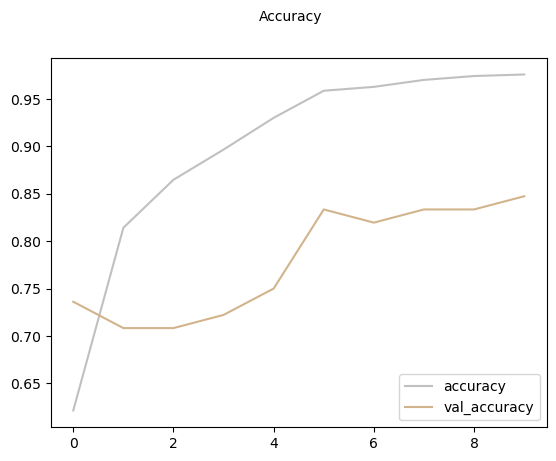

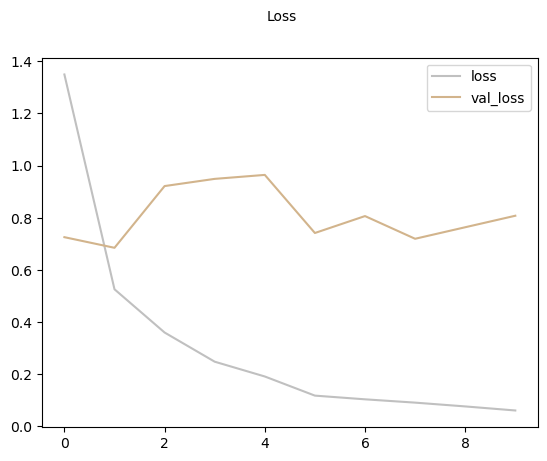

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 399ms/step
              precision    recall  f1-score   support

           0     0.8772    0.8333    0.8547       120
           1     0.8824    0.8824    0.8824        51
           2     1.0000    0.9815    0.9907        54
           3     0.8247    0.8889    0.8556        90

    accuracy                         0.8825       315
   macro avg     0.8961    0.8965    0.8958       315
weighted avg     0.8841    0.8825    0.8827       315

The Cohen's Kappa Score is: 0.8366548940464178
The execution time is 162.72332096099854 seconds


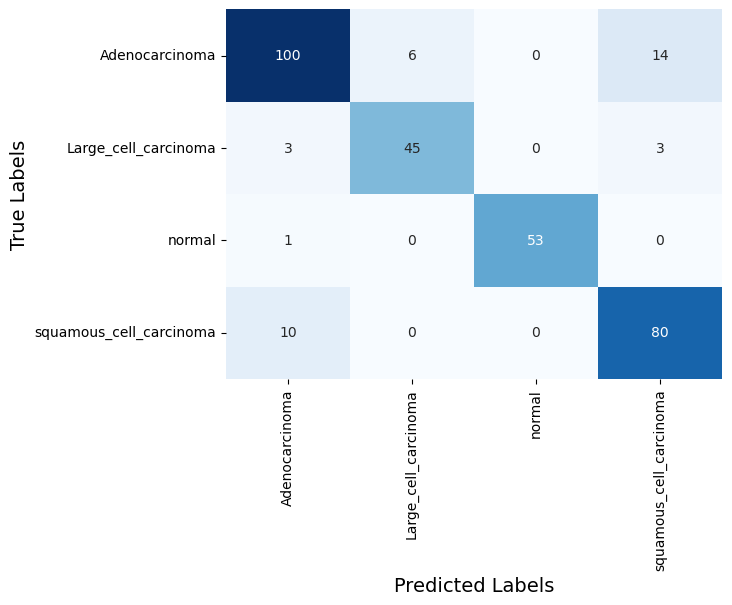

Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_31      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_31[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 182ms/step - accuracy: 0.5316 - loss: 1.7828 - val_accuracy: 0.6667 - val_loss: 0.7596 - learning_rate: 0.0010
Epoch 2/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - accuracy: 0.8223 - loss: 0.5656 - val_accuracy: 0.7917 - val_loss: 0.7032 - learning_rate: 0.0010
Epoch 3/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 13s 172ms/step - accuracy: 0.8770 - loss: 0.3443 - val_accuracy: 0.8056 - val_loss: 0.6522 - learning_rate: 0.0010
Epoch 4/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - accuracy: 0.8841 - loss: 0.3309 - val_accuracy: 0.7917 - val_loss: 0.8202 - learning_rate: 0.0010
Epoch 5/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - accuracy: 0.9296 - loss: 0.2186 - val_accuracy: 0.8056 - val_loss: 0.9248 - learning_rate: 0.0010
Epoch 6/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9234 - loss: 0.2143 - val_accuracy: 0.7639 - val_loss: 1.1265 - learning_rate: 0.0010
Epoch 7/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - accuracy: 0.9556 - loss: 0.

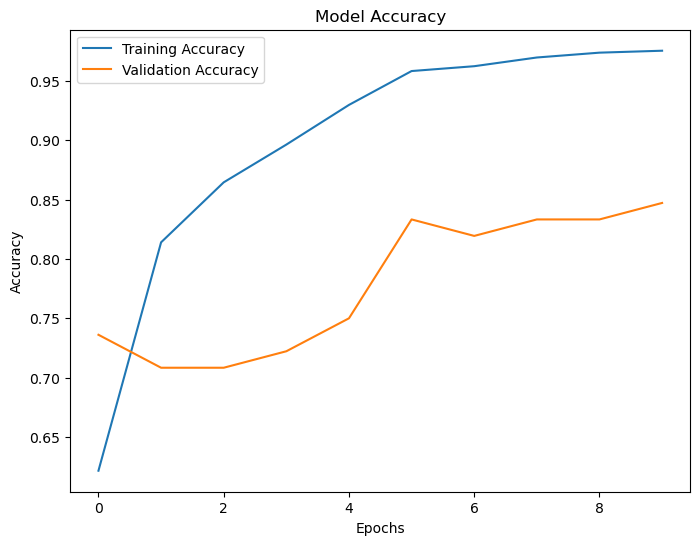

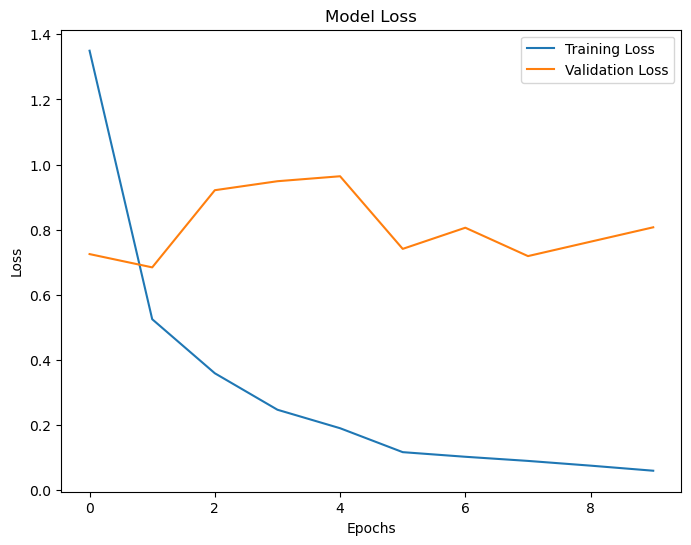

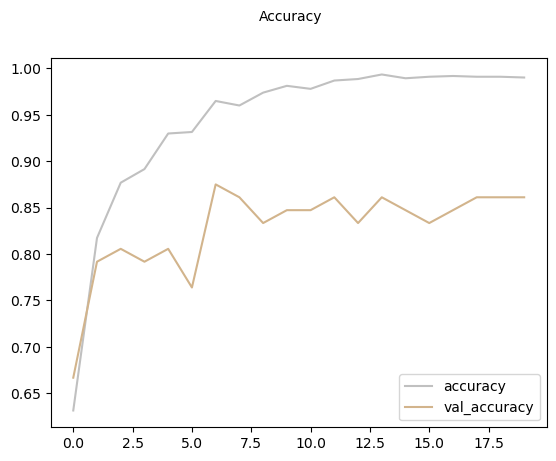

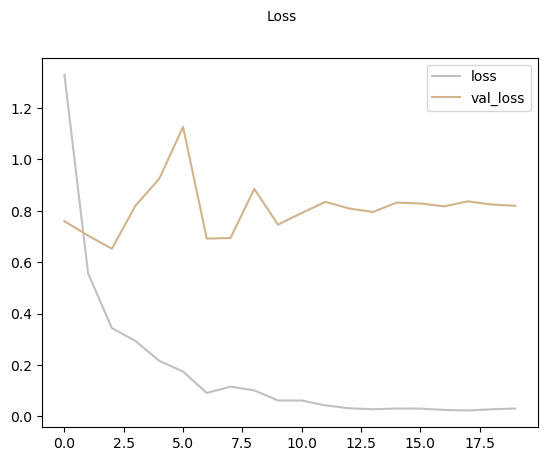

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 339ms/step
              precision    recall  f1-score   support

           0     0.9375    0.8750    0.9052       120
           1     0.9167    0.8627    0.8889        51
           2     1.0000    0.9815    0.9907        54
           3     0.8431    0.9556    0.8958        90

    accuracy                         0.9143       315
   macro avg     0.9243    0.9187    0.9201       315
weighted avg     0.9179    0.9143    0.9145       315

The Cohen's Kappa Score is: 0.8807069219440353
The execution time is 261.64439940452576 seconds


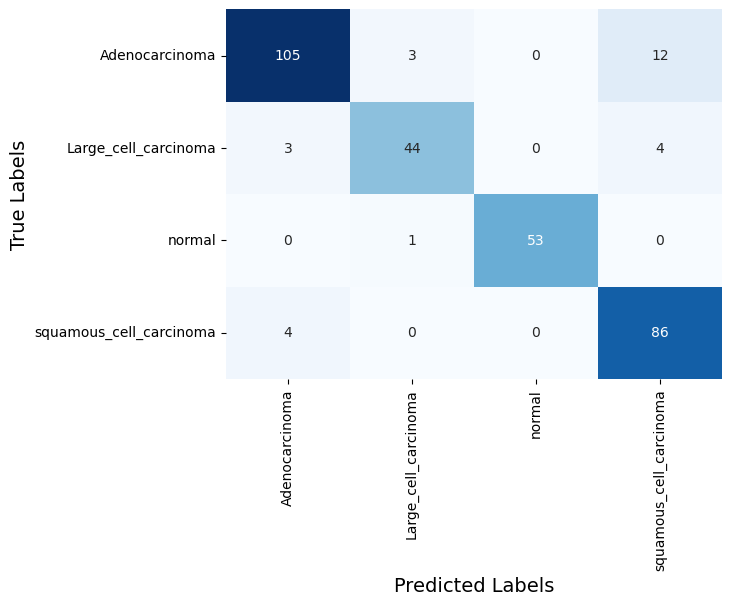

Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_32[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - accuracy: 0.5370 - loss: 1.9030 - val_accuracy: 0.5972 - val_loss: 0.9301 - learning_rate: 0.0010
Epoch 2/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - accuracy: 0.7734 - loss: 0.6276 - val_accuracy: 0.7917 - val_loss: 0.5926 - learning_rate: 0.0010
Epoch 3/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - accuracy: 0.8673 - loss: 0.3669 - val_accuracy: 0.8472 - val_loss: 0.5632 - learning_rate: 0.0010
Epoch 4/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - accuracy: 0.9046 - loss: 0.3225 - val_accuracy: 0.7917 - val_loss: 0.8433 - learning_rate: 0.0010
Epoch 5/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - accuracy: 0.9130 - loss: 0.2236 - val_accuracy: 0.7778 - val_loss: 0.9499 - learning_rate: 0.0010
Epoch 6/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - accuracy: 0.9164 - loss: 0.2181 - val_accuracy: 0.7778 - val_loss: 1.1516 - learning_rate: 0.0010
Epoch 7/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - accuracy: 0.9546 - loss: 0.

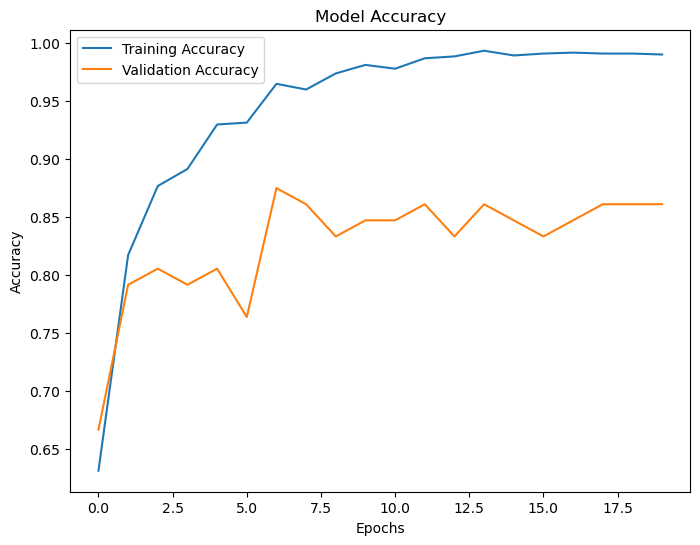

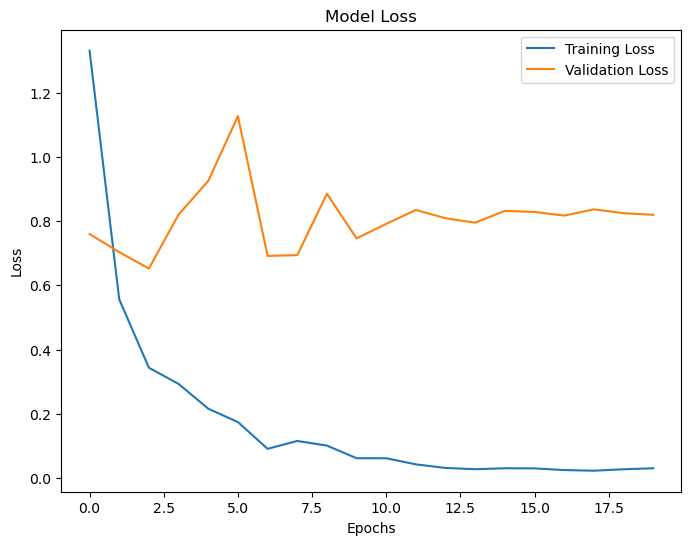

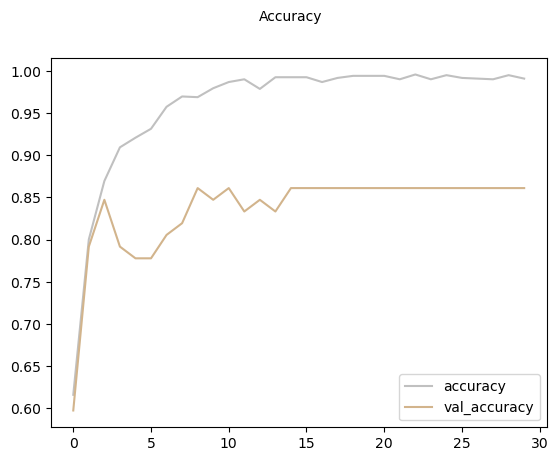

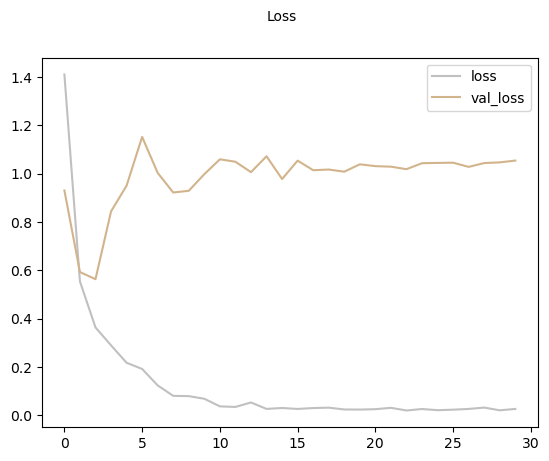

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 334ms/step
              precision    recall  f1-score   support

           0     0.8710    0.9000    0.8852       120
           1     0.8889    0.9412    0.9143        51
           2     1.0000    0.9815    0.9907        54
           3     0.9048    0.8444    0.8736        90

    accuracy                         0.9048       315
   macro avg     0.9162    0.9168    0.9159       315
weighted avg     0.9056    0.9048    0.9047       315

The Cohen's Kappa Score is: 0.8672174682797286
The execution time is 375.3118534088135 seconds


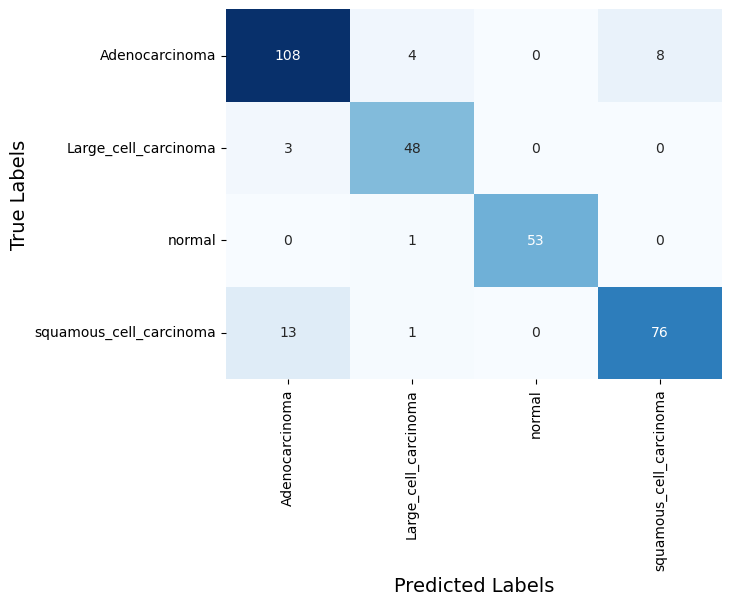

Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_33      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_33[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - accuracy: 0.5490 - loss: 1.7737 - val_accuracy: 0.7361 - val_loss: 0.7098 - learning_rate: 0.0010
Epoch 2/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - accuracy: 0.7827 - loss: 0.6408 - val_accuracy: 0.6806 - val_loss: 0.6967 - learning_rate: 0.0010
Epoch 3/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - accuracy: 0.8488 - loss: 0.4070 - val_accuracy: 0.7083 - val_loss: 0.8957 - learning_rate: 0.0010
Epoch 4/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - accuracy: 0.8912 - loss: 0.3150 - val_accuracy: 0.7778 - val_loss: 0.6788 - learning_rate: 0.0010
Epoch 5/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - accuracy: 0.9111 - loss: 0.2452 - val_accuracy: 0.7778 - val_loss: 1.0836 - learning_rate: 0.0010
Epoch 6/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - accuracy: 0.9345 - loss: 0.1602 - val_accuracy: 0.7500 - val_loss: 1.1467 - learning_rate: 0.0010
Epoch 7/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - accuracy: 0.9488 - loss: 0.

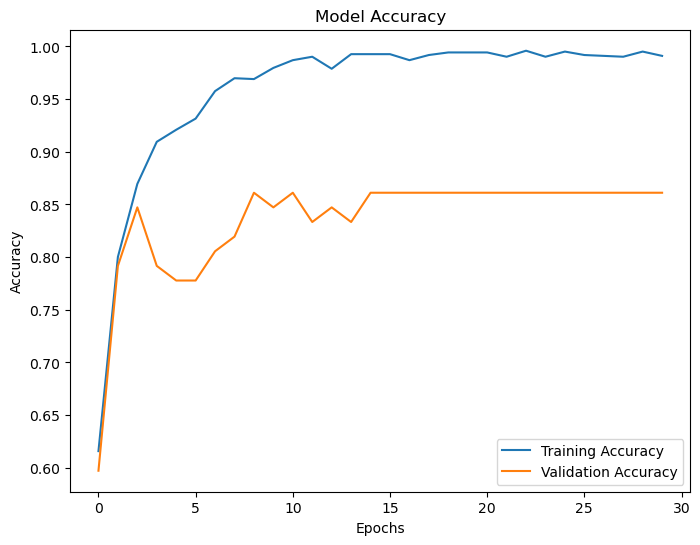

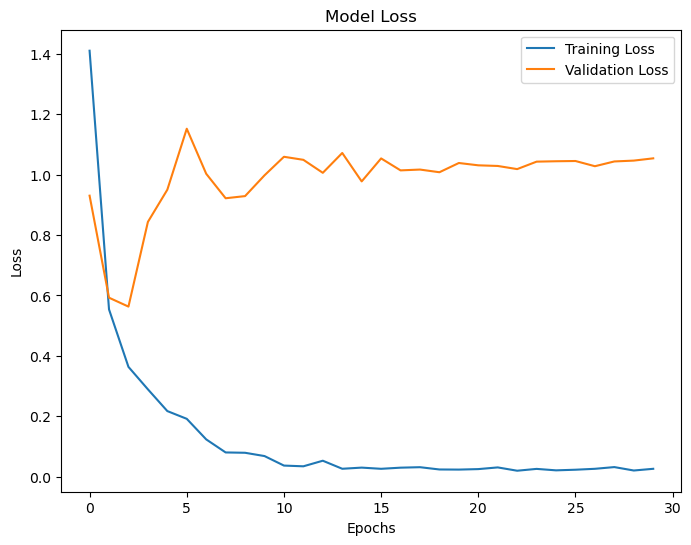

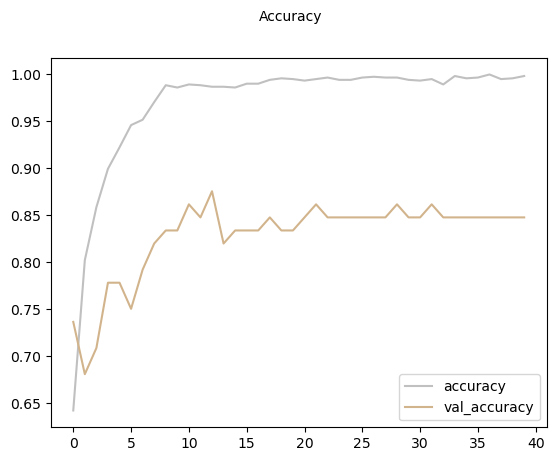

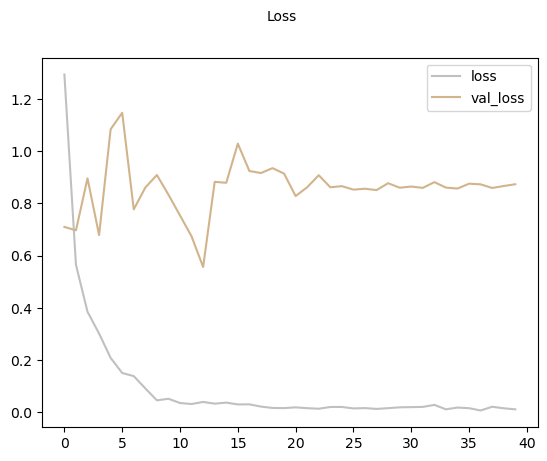

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 351ms/step
              precision    recall  f1-score   support

           0     0.8780    0.9000    0.8889       120
           1     0.9167    0.8627    0.8889        51
           2     1.0000    0.9815    0.9907        54
           3     0.8791    0.8889    0.8840        90

    accuracy                         0.9048       315
   macro avg     0.9185    0.9083    0.9131       315
weighted avg     0.9055    0.9048    0.9049       315

The Cohen's Kappa Score is: 0.8668357641090678
The execution time is 494.89193058013916 seconds


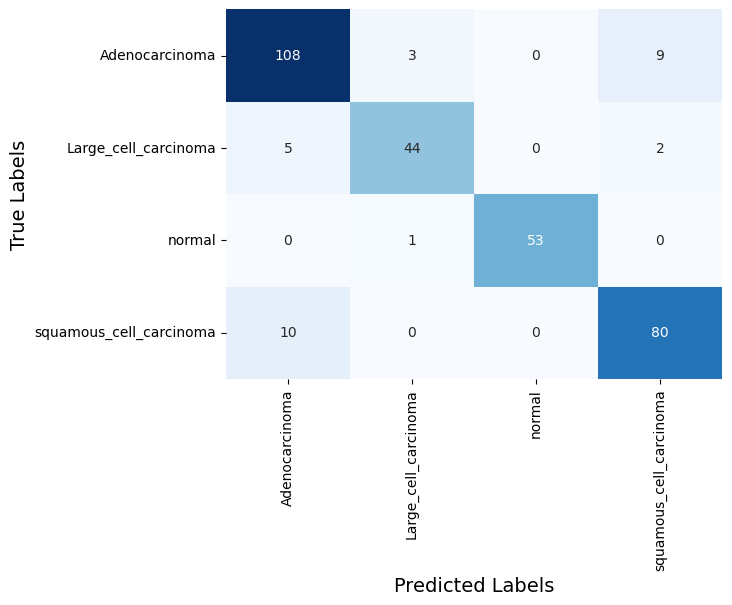

Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_34      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_34[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 23s 207ms/step - accuracy: 0.5509 - loss: 1.7776 - val_accuracy: 0.7083 - val_loss: 0.7537 - learning_rate: 0.0010
Epoch 2/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - accuracy: 0.7975 - loss: 0.6499 - val_accuracy: 0.7361 - val_loss: 0.6975 - learning_rate: 0.0010
Epoch 3/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 14s 188ms/step - accuracy: 0.8631 - loss: 0.3882 - val_accuracy: 0.8056 - val_loss: 0.6888 - learning_rate: 0.0010
Epoch 4/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 14s 185ms/step - accuracy: 0.8965 - loss: 0.2850 - val_accuracy: 0.7500 - val_loss: 0.8498 - learning_rate: 0.0010
Epoch 5/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.8999 - loss: 0.2615 - val_accuracy: 0.8194 - val_loss: 0.7543 - learning_rate: 0.0010
Epoch 6/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 14s 186ms/step - accuracy: 0.9148 - loss: 0.2179 - val_accuracy: 0.8333 - val_loss: 0.9853 - learning_rate: 0.0010
Epoch 7/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 14s 184ms/step - accuracy: 0.9469 - loss: 0.

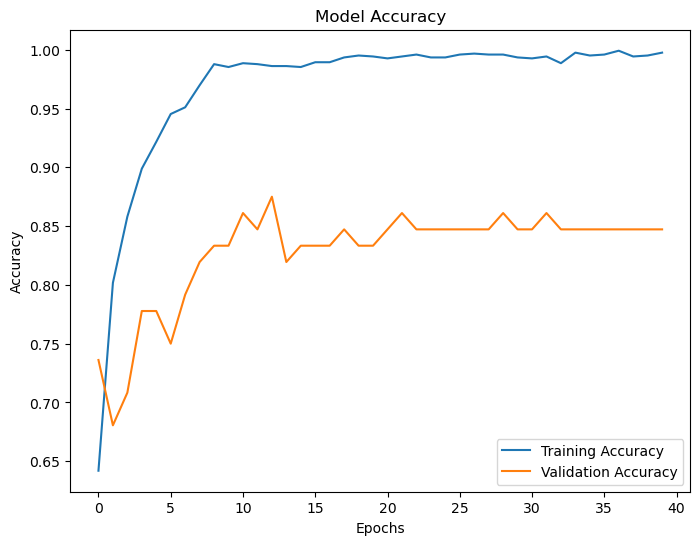

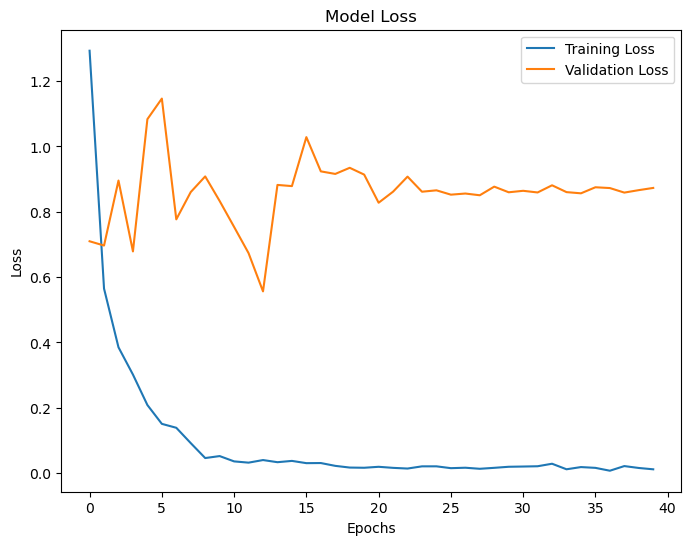

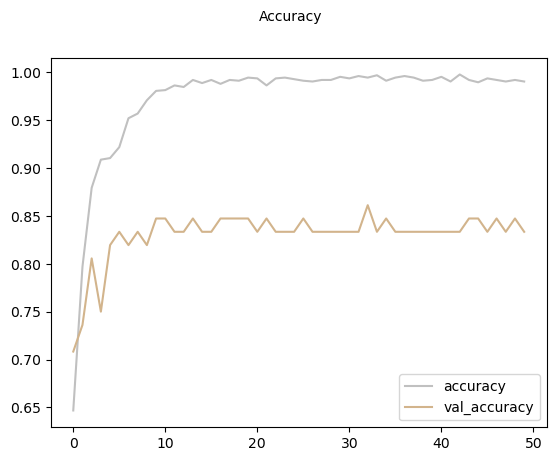

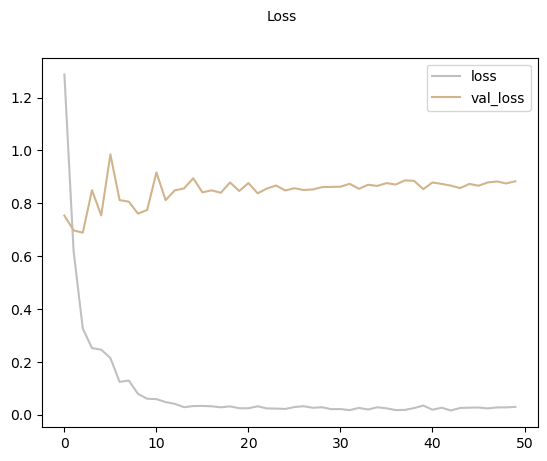

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 386ms/step
              precision    recall  f1-score   support

           0     0.8803    0.8583    0.8692       120
           1     0.8868    0.9216    0.9038        51
           2     1.0000    0.9815    0.9907        54
           3     0.8696    0.8889    0.8791        90

    accuracy                         0.8984       315
   macro avg     0.9092    0.9126    0.9107       315
weighted avg     0.8988    0.8984    0.8985       315

The Cohen's Kappa Score is: 0.8587047939444912
The execution time is 737.0321328639984 seconds


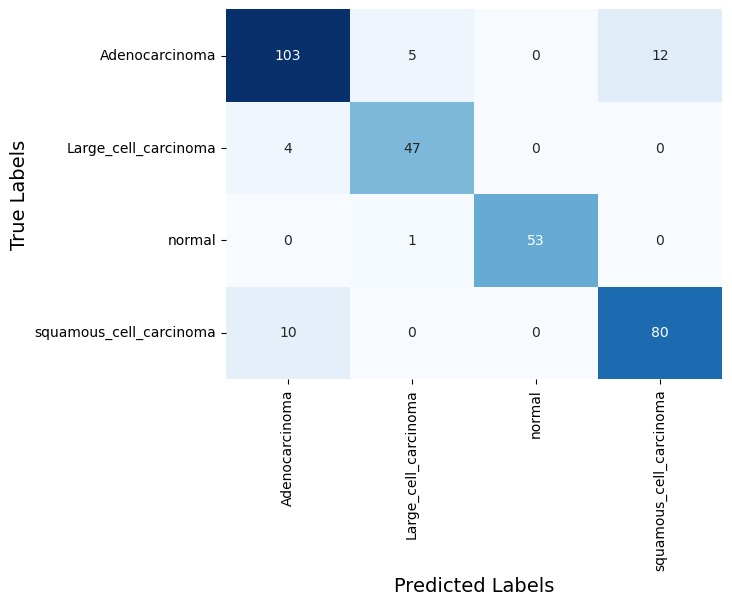

Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_35      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_35[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step - accuracy: 0.5707 - loss: 1.6117 - val_accuracy: 0.6806 - val_loss: 0.8346 - learning_rate: 0.0010
Epoch 2/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - accuracy: 0.7747 - loss: 0.5837 - val_accuracy: 0.8194 - val_loss: 0.6195 - learning_rate: 0.0010
Epoch 3/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - accuracy: 0.8705 - loss: 0.3444 - val_accuracy: 0.8056 - val_loss: 0.6502 - learning_rate: 0.0010
Epoch 4/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 256ms/step - accuracy: 0.9101 - loss: 0.2839 - val_accuracy: 0.8333 - val_loss: 0.5569 - learning_rate: 0.0010
Epoch 5/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - accuracy: 0.9365 - loss: 0.1821 - val_accuracy: 0.8333 - val_loss: 0.6860 - learning_rate: 0.0010
Epoch 6/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - accuracy: 0.9392 - loss: 0.1777 - val_accuracy: 0.7639 - val_loss: 1.0244 - learning_rate: 0.0010
Epoch 7/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - accuracy: 0.9439 - loss: 0.

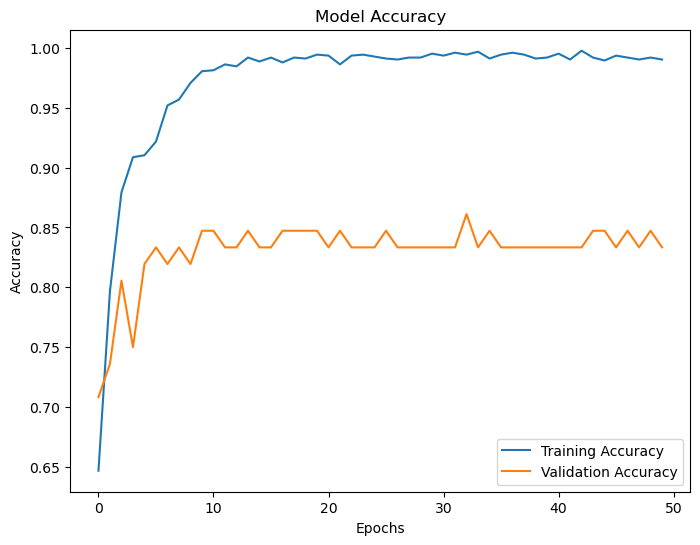

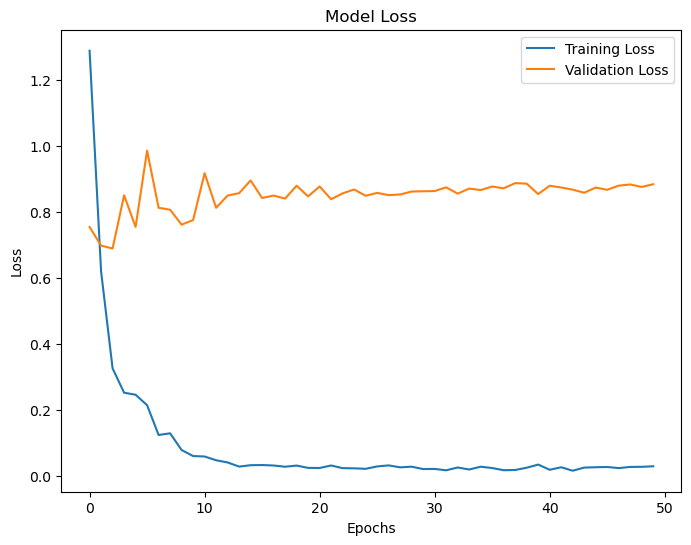

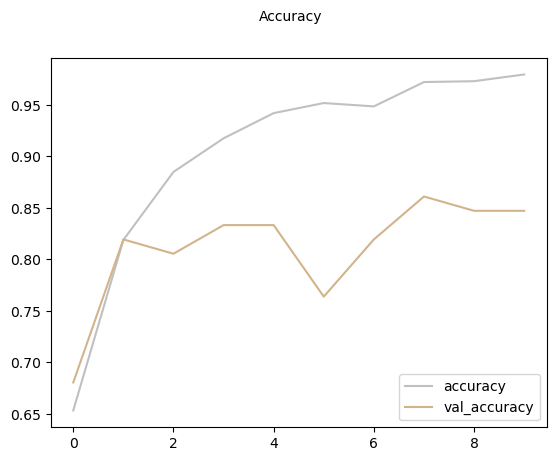

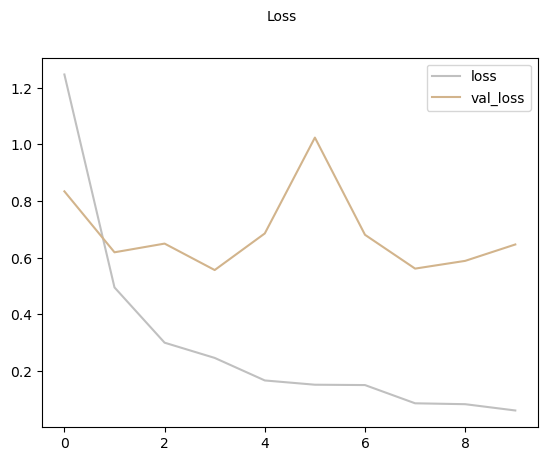

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 339ms/step
              precision    recall  f1-score   support

           0     0.9189    0.8500    0.8831       120
           1     0.8889    0.9412    0.9143        51
           2     1.0000    0.9815    0.9907        54
           3     0.8144    0.8778    0.8449        90

    accuracy                         0.8952       315
   macro avg     0.9056    0.9126    0.9082       315
weighted avg     0.8981    0.8952    0.8957       315

The Cohen's Kappa Score is: 0.8547352534272419
The execution time is 108.84080386161804 seconds


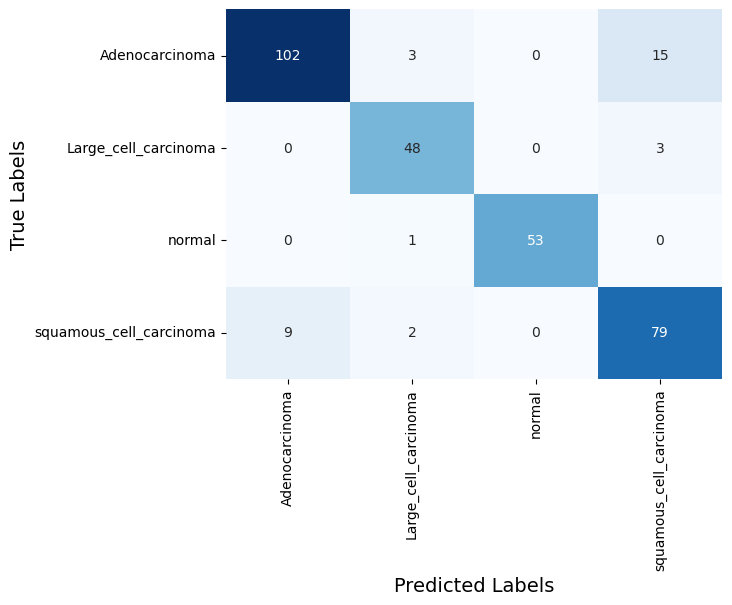

Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_36      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_36[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 256ms/step - accuracy: 0.5135 - loss: 1.6861 - val_accuracy: 0.7917 - val_loss: 0.7825 - learning_rate: 0.0010
Epoch 2/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - accuracy: 0.8069 - loss: 0.5074 - val_accuracy: 0.7917 - val_loss: 0.6202 - learning_rate: 0.0010
Epoch 3/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 238ms/step - accuracy: 0.8840 - loss: 0.2985 - val_accuracy: 0.8056 - val_loss: 0.5679 - learning_rate: 0.0010
Epoch 4/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 254ms/step - accuracy: 0.9155 - loss: 0.2389 - val_accuracy: 0.8056 - val_loss: 0.5690 - learning_rate: 0.0010
Epoch 5/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 226ms/step - accuracy: 0.9278 - loss: 0.1995 - val_accuracy: 0.8333 - val_loss: 0.6799 - learning_rate: 0.0010
Epoch 6/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - accuracy: 0.9343 - loss: 0.1764 - val_accuracy: 0.8611 - val_loss: 0.5172 - learning_rate: 0.0010
Epoch 7/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - accuracy: 0.9558 - loss: 0.123

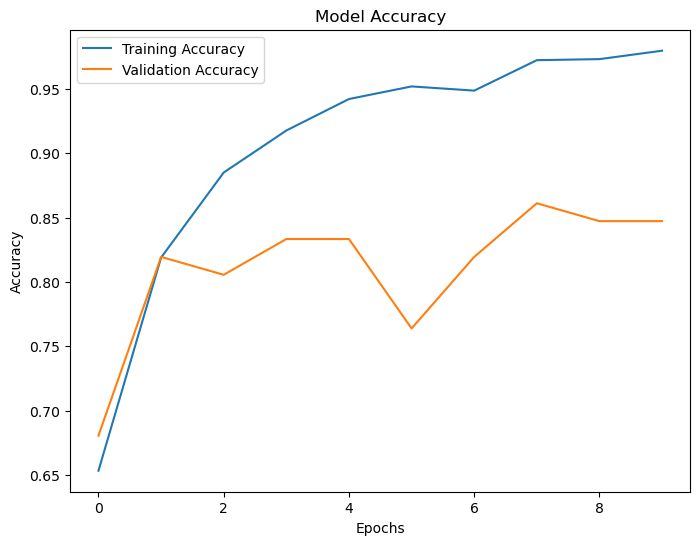

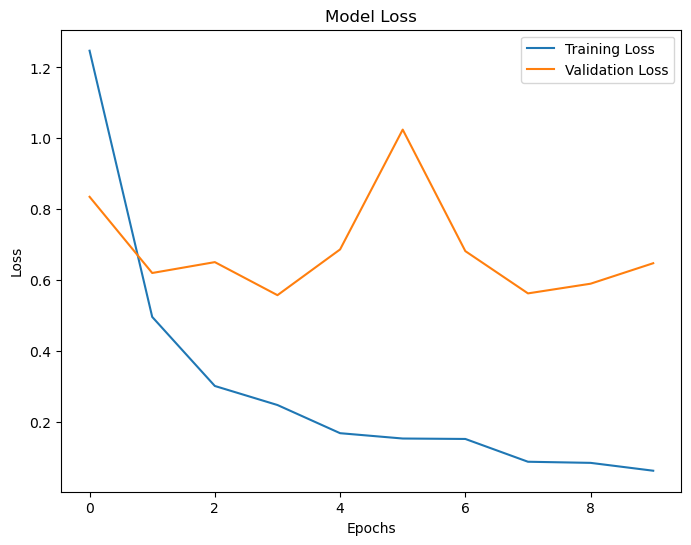

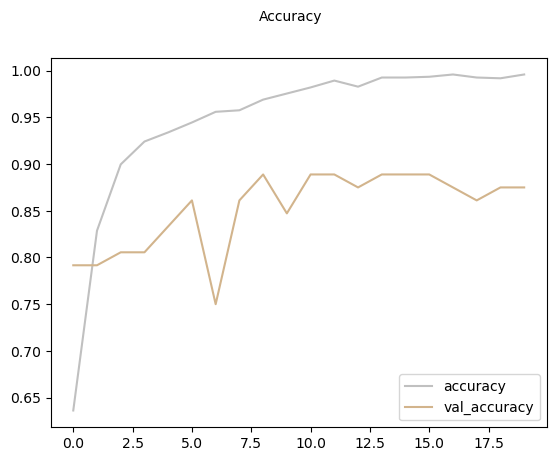

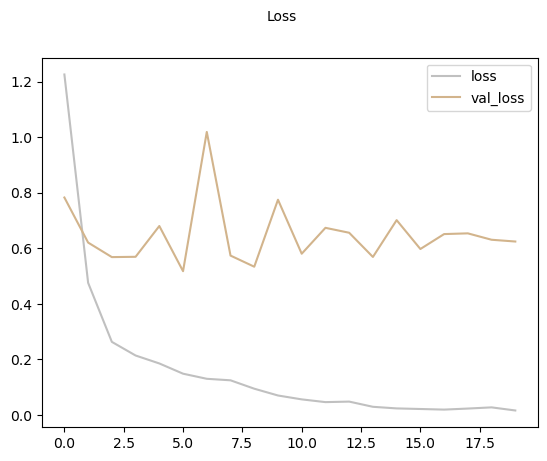

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 334ms/step
              precision    recall  f1-score   support

           0     0.8879    0.8583    0.8729       120
           1     0.8750    0.9608    0.9159        51
           2     1.0000    0.9815    0.9907        54
           3     0.8667    0.8667    0.8667        90

    accuracy                         0.8984       315
   macro avg     0.9074    0.9168    0.9115       315
weighted avg     0.8990    0.8984    0.8983       315

The Cohen's Kappa Score is: 0.858995341810399
The execution time is 202.2505328655243 seconds


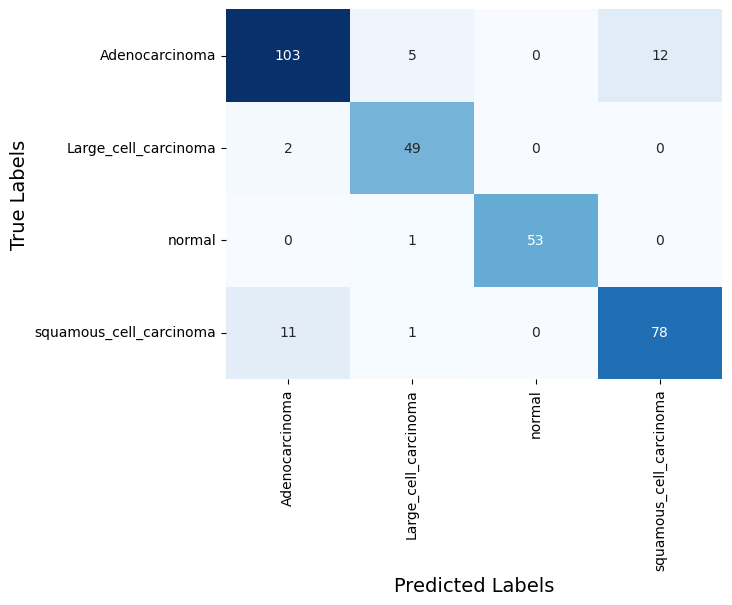

Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_37      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_37[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 270ms/step - accuracy: 0.5426 - loss: 1.6043 - val_accuracy: 0.6250 - val_loss: 0.8254 - learning_rate: 0.0010
Epoch 2/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - accuracy: 0.8227 - loss: 0.5103 - val_accuracy: 0.6944 - val_loss: 0.7332 - learning_rate: 0.0010
Epoch 3/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 238ms/step - accuracy: 0.8738 - loss: 0.3509 - val_accuracy: 0.8472 - val_loss: 0.5668 - learning_rate: 0.0010
Epoch 4/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - accuracy: 0.8818 - loss: 0.3295 - val_accuracy: 0.8194 - val_loss: 0.5336 - learning_rate: 0.0010
Epoch 5/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - accuracy: 0.9400 - loss: 0.1566 - val_accuracy: 0.8472 - val_loss: 0.4438 - learning_rate: 0.0010
Epoch 6/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 255ms/step - accuracy: 0.9466 - loss: 0.1288 - val_accuracy: 0.8611 - val_loss: 0.5019 - learning_rate: 0.0010
Epoch 7/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - accuracy: 0.9566 - loss: 0.128

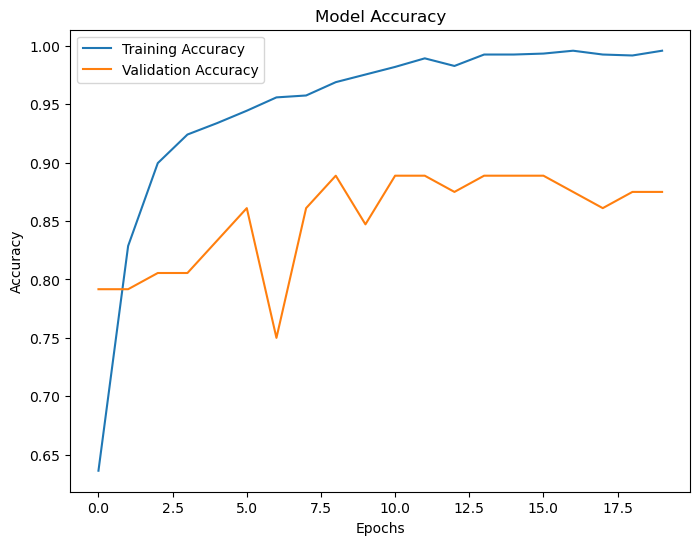

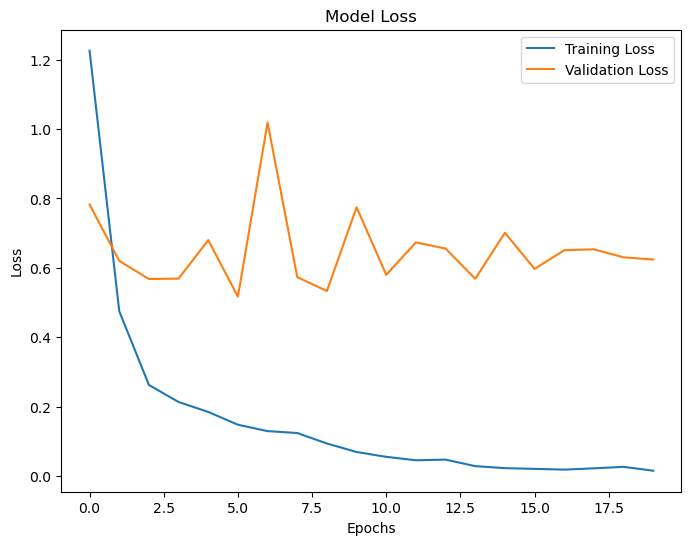

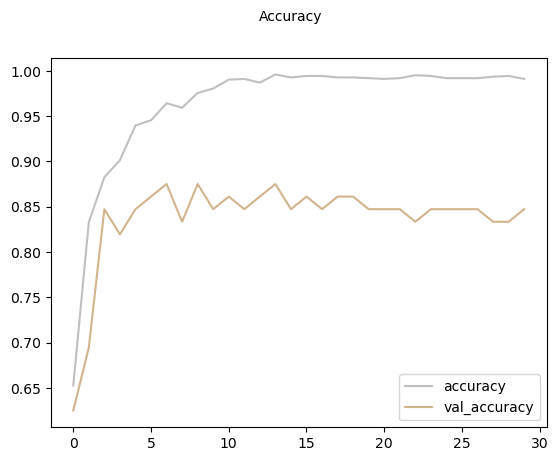

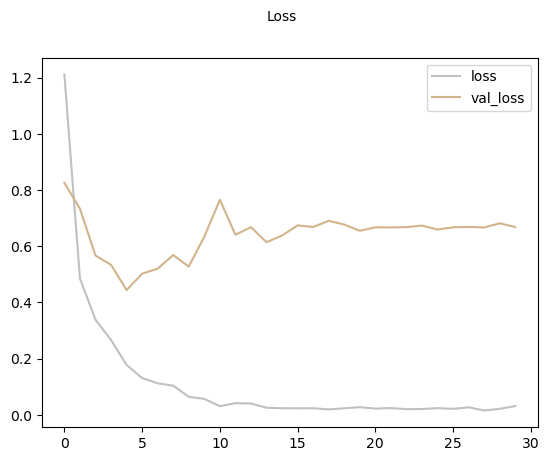

10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 448ms/step
              precision    recall  f1-score   support

           0     0.8814    0.8667    0.8739       120
           1     0.9038    0.9216    0.9126        51
           2     1.0000    0.9815    0.9907        54
           3     0.8478    0.8667    0.8571        90

    accuracy                         0.8952       315
   macro avg     0.9083    0.9091    0.9086       315
weighted avg     0.8958    0.8952    0.8954       315

The Cohen's Kappa Score is: 0.8541482510417981
The execution time is 307.53654384613037 seconds


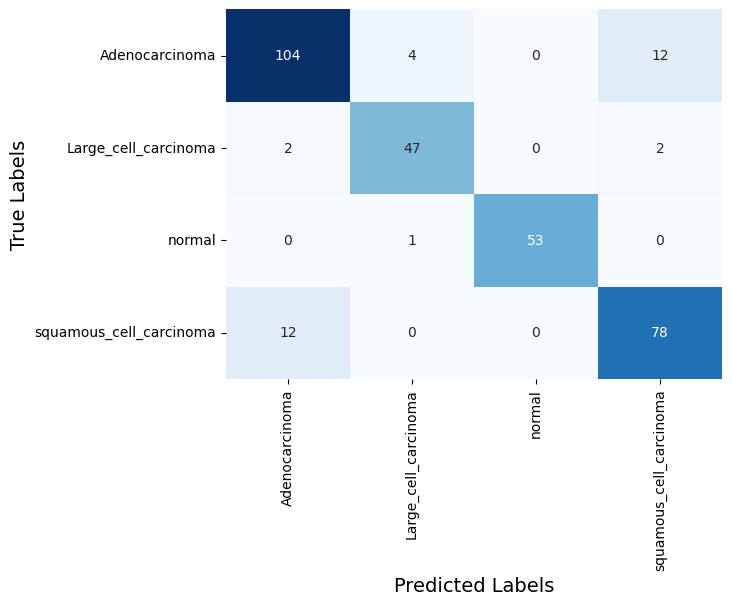

Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_38      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_38[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 19s 323ms/step - accuracy: 0.5596 - loss: 1.7239 - val_accuracy: 0.6806 - val_loss: 0.7748 - learning_rate: 0.0010
Epoch 2/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - accuracy: 0.8136 - loss: 0.5667 - val_accuracy: 0.7778 - val_loss: 0.6773 - learning_rate: 0.0010
Epoch 3/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 274ms/step - accuracy: 0.8842 - loss: 0.3309 - val_accuracy: 0.7222 - val_loss: 0.7291 - learning_rate: 0.0010
Epoch 4/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 279ms/step - accuracy: 0.8997 - loss: 0.2872 - val_accuracy: 0.8194 - val_loss: 0.5535 - learning_rate: 0.0010
Epoch 5/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 285ms/step - accuracy: 0.9353 - loss: 0.1708 - val_accuracy: 0.8194 - val_loss: 0.6644 - learning_rate: 0.0010
Epoch 6/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 272ms/step - accuracy: 0.9420 - loss: 0.1516 - val_accuracy: 0.7778 - val_loss: 0.7196 - learning_rate: 0.0010
Epoch 7/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 278ms/step - accuracy: 0.9624 - loss: 0.

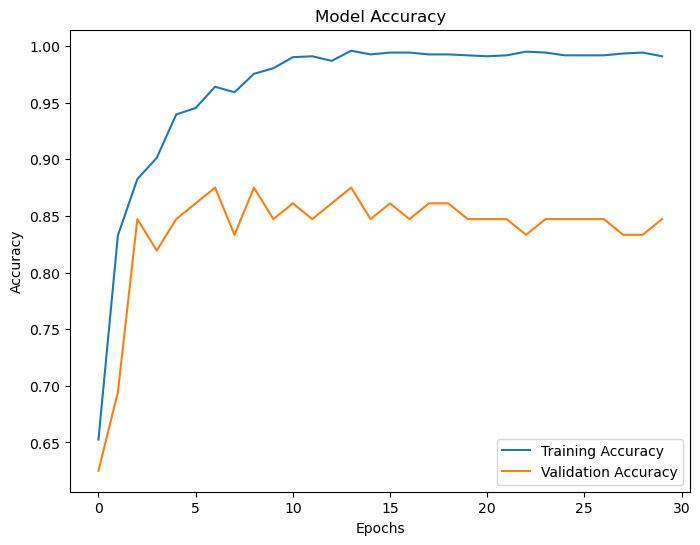

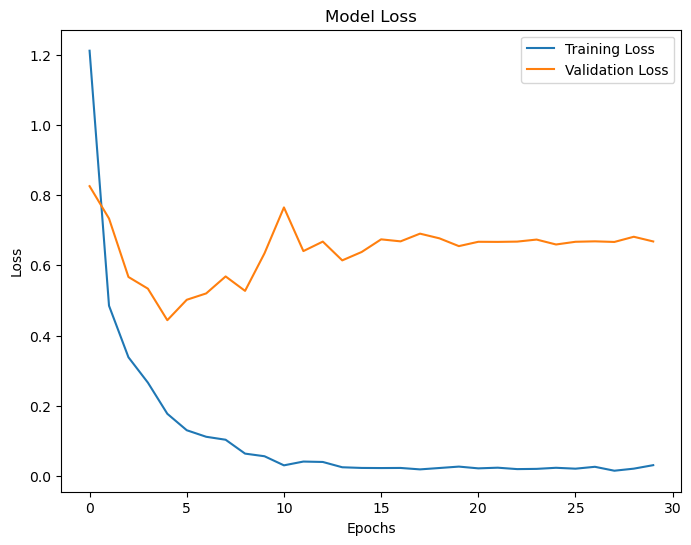

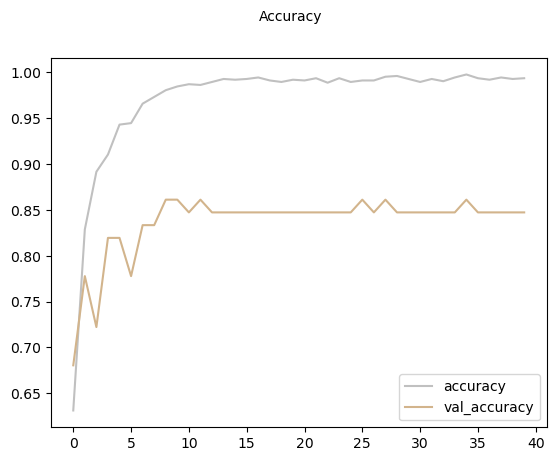

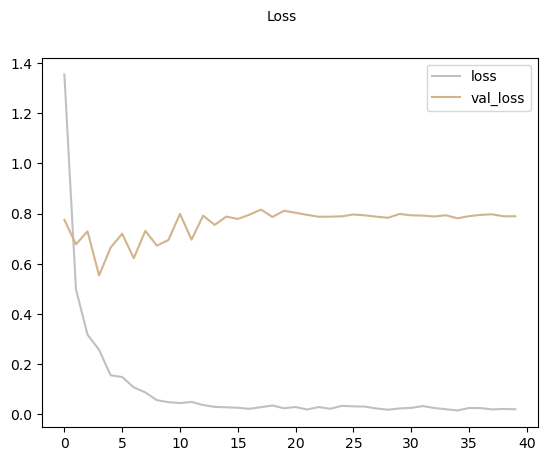

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 369ms/step
              precision    recall  f1-score   support

           0     0.9252    0.8250    0.8722       120
           1     0.8596    0.9608    0.9074        51
           2     1.0000    0.9815    0.9907        54
           3     0.8367    0.9111    0.8723        90

    accuracy                         0.8984       315
   macro avg     0.9054    0.9196    0.9107       315
weighted avg     0.9021    0.8984    0.8983       315

The Cohen's Kappa Score is: 0.8596022062510447
The execution time is 455.39205598831177 seconds


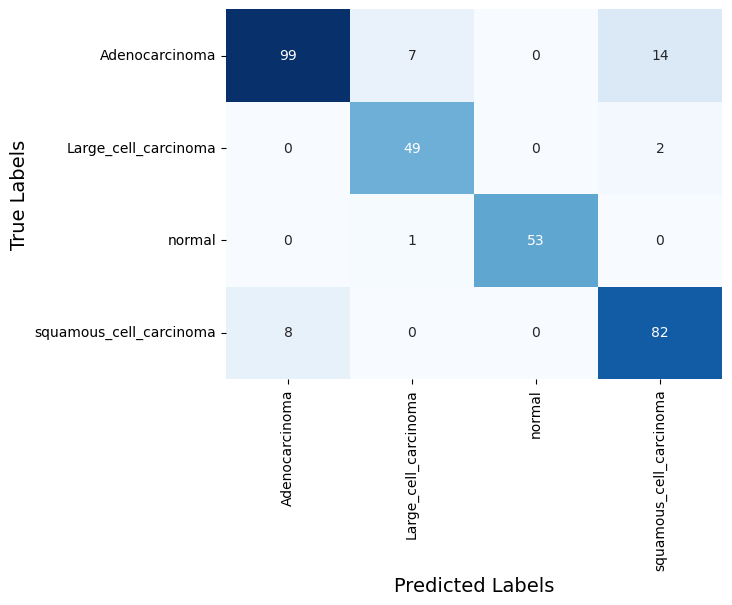

Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_39      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_39[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 270ms/step - accuracy: 0.5556 - loss: 1.7827 - val_accuracy: 0.6528 - val_loss: 0.8353 - learning_rate: 0.0010
Epoch 2/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - accuracy: 0.8218 - loss: 0.4494 - val_accuracy: 0.7500 - val_loss: 0.6778 - learning_rate: 0.0010
Epoch 3/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - accuracy: 0.8968 - loss: 0.3035 - val_accuracy: 0.8056 - val_loss: 0.5884 - learning_rate: 0.0010
Epoch 4/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - accuracy: 0.9129 - loss: 0.2305 - val_accuracy: 0.8333 - val_loss: 0.5568 - learning_rate: 0.0010
Epoch 5/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - accuracy: 0.9250 - loss: 0.2407 - val_accuracy: 0.7917 - val_loss: 0.6732 - learning_rate: 0.0010
Epoch 6/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9385 - loss: 0.2021 - val_accuracy: 0.8194 - val_loss: 0.5184 - learning_rate: 0.0010
Epoch 7/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 263ms/step - accuracy: 0.9331 - loss: 0.

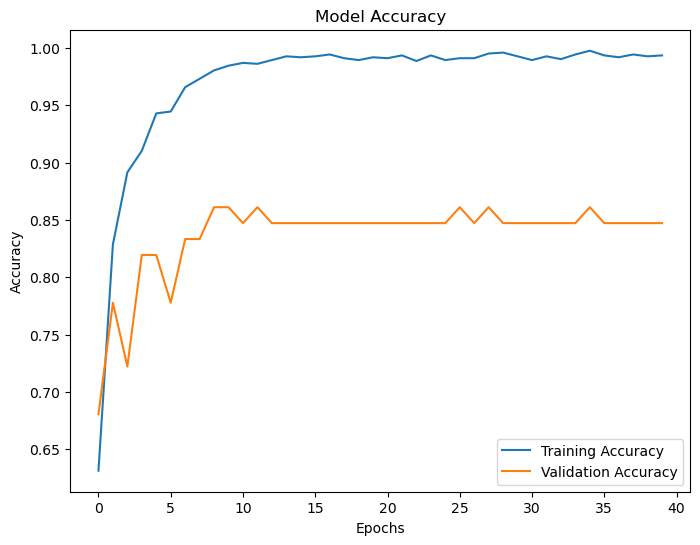

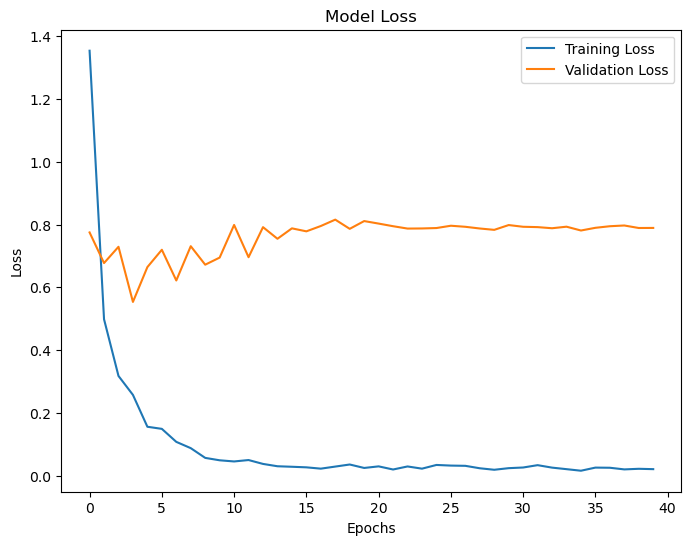

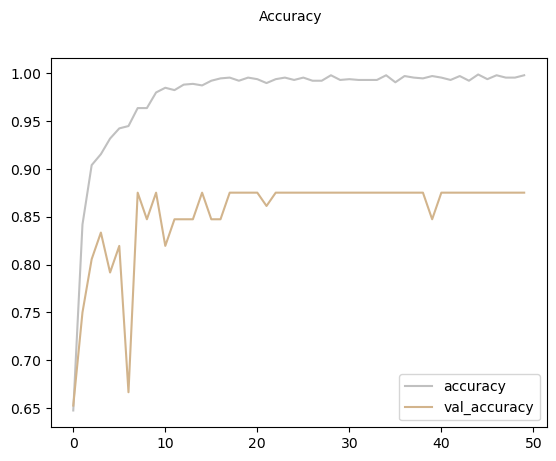

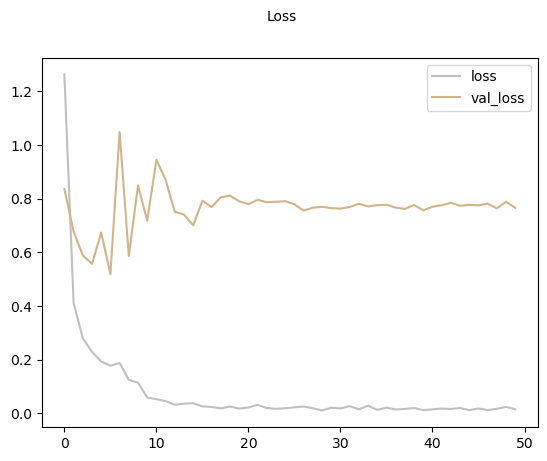

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 337ms/step
              precision    recall  f1-score   support

           0     0.9279    0.8583    0.8918       120
           1     0.8909    0.9608    0.9245        51
           2     1.0000    0.9815    0.9907        54
           3     0.8438    0.9000    0.8710        90

    accuracy                         0.9079       315
   macro avg     0.9156    0.9251    0.9195       315
weighted avg     0.9102    0.9079    0.9081       315

The Cohen's Kappa Score is: 0.8724126372245035
The execution time is 512.1594533920288 seconds


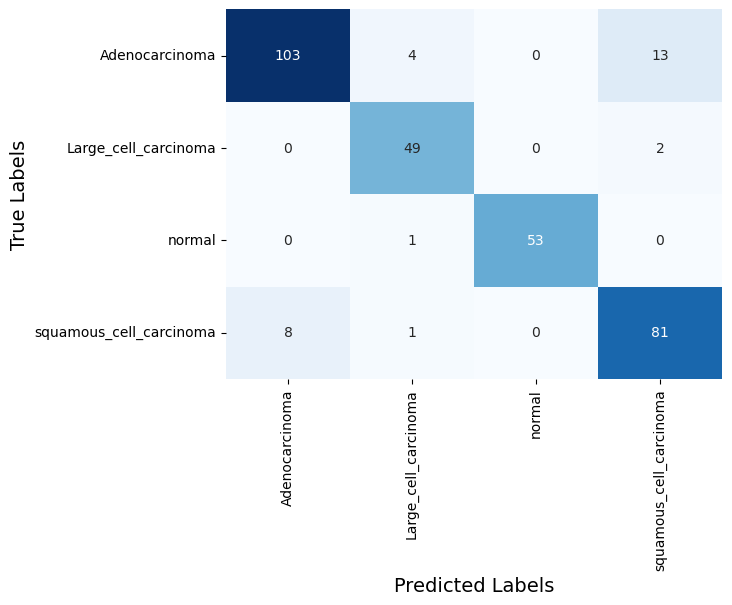

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_40      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_40[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 468ms/step - accuracy: 0.5533 - loss: 1.6191 - val_accuracy: 0.6111 - val_loss: 0.9128 - learning_rate: 0.0010
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 398ms/step - accuracy: 0.7972 - loss: 0.5761 - val_accuracy: 0.7222 - val_loss: 0.7718 - learning_rate: 0.0010
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 415ms/step - accuracy: 0.8700 - loss: 0.3441 - val_accuracy: 0.8194 - val_loss: 0.5815 - learning_rate: 0.0010
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 414ms/step - accuracy: 0.9089 - loss: 0.2541 - val_accuracy: 0.8194 - val_loss: 0.5730 - learning_rate: 0.0010
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 428ms/step - accuracy: 0.9281 - loss: 0.2097 - val_accuracy: 0.8333 - val_loss: 0.5678 - learning_rate: 0.0010
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 425ms/step - accuracy: 0.9456 - loss: 0.1390 - val_accuracy: 0.8194 - val_loss: 0.5831 - learning_rate: 0.0010
Epoch 7/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 417ms/step - accuracy: 0.9616 - loss: 0.1331 -

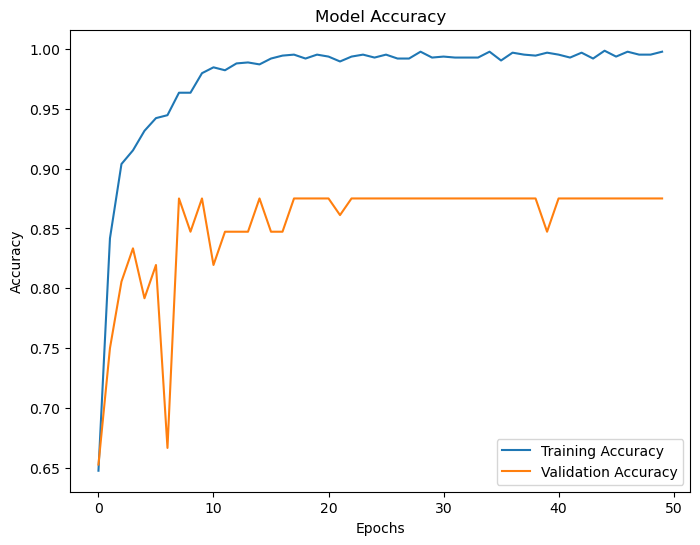

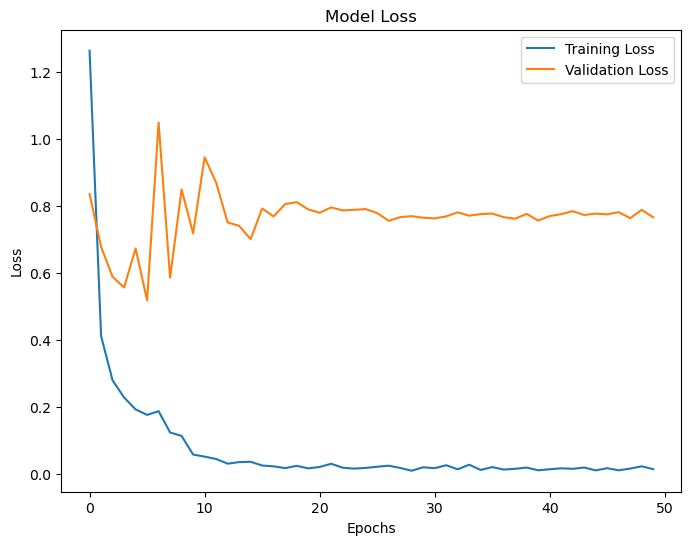

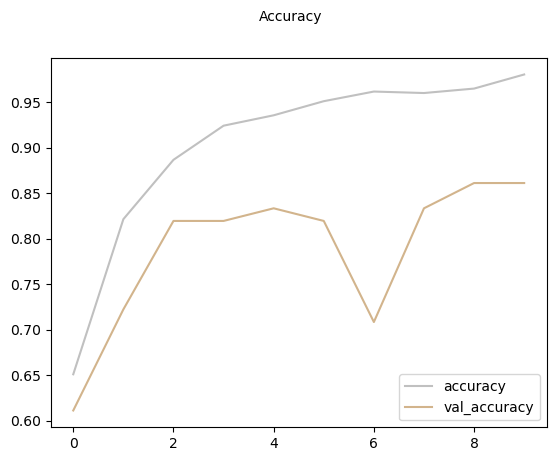

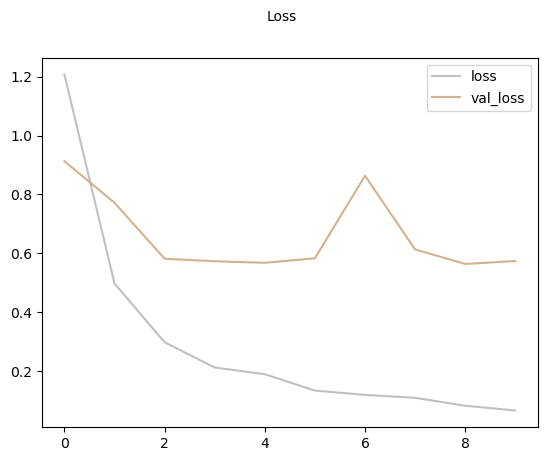

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 343ms/step
              precision    recall  f1-score   support

           0     0.9412    0.8000    0.8649       120
           1     0.8980    0.8627    0.8800        51
           2     1.0000    0.9815    0.9907        54
           3     0.7568    0.9333    0.8358        90

    accuracy                         0.8794       315
   macro avg     0.8990    0.8944    0.8928       315
weighted avg     0.8916    0.8794    0.8806       315

The Cohen's Kappa Score is: 0.8329005779378508
The execution time is 93.79118466377258 seconds


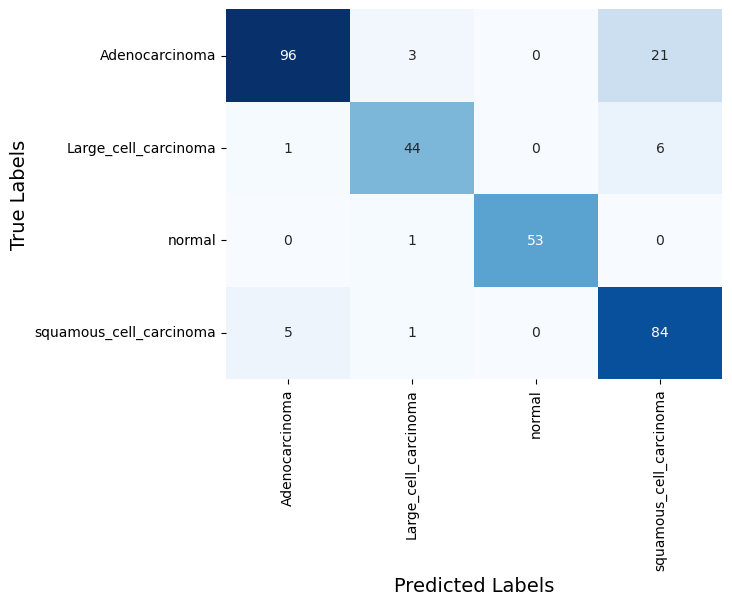

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_41      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_41[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 459ms/step - accuracy: 0.5487 - loss: 1.5147 - val_accuracy: 0.6944 - val_loss: 0.8584 - learning_rate: 0.0010
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 403ms/step - accuracy: 0.8087 - loss: 0.5626 - val_accuracy: 0.7500 - val_loss: 0.7278 - learning_rate: 0.0010
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 398ms/step - accuracy: 0.8729 - loss: 0.3362 - val_accuracy: 0.7778 - val_loss: 0.6352 - learning_rate: 0.0010
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 429ms/step - accuracy: 0.9280 - loss: 0.2076 - val_accuracy: 0.8611 - val_loss: 0.6119 - learning_rate: 0.0010
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 406ms/step - accuracy: 0.9303 - loss: 0.1906 - val_accuracy: 0.8889 - val_loss: 0.5082 - learning_rate: 0.0010
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 426ms/step - accuracy: 0.9537 - loss: 0.1375 - val_accuracy: 0.8889 - val_loss: 0.4590 - learning_rate: 0.0010
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 426ms/step - accuracy: 0.9540 - loss: 0.1586 -

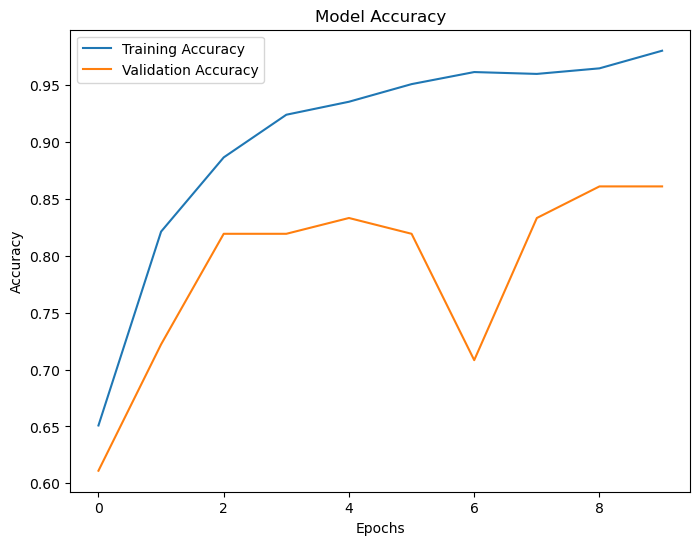

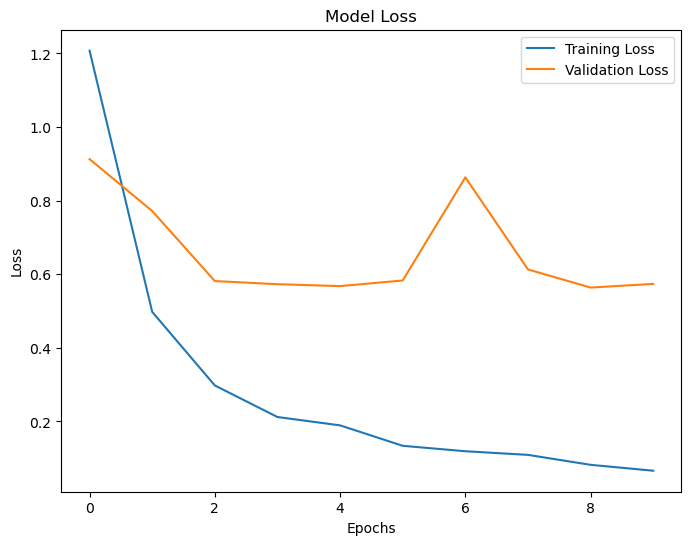

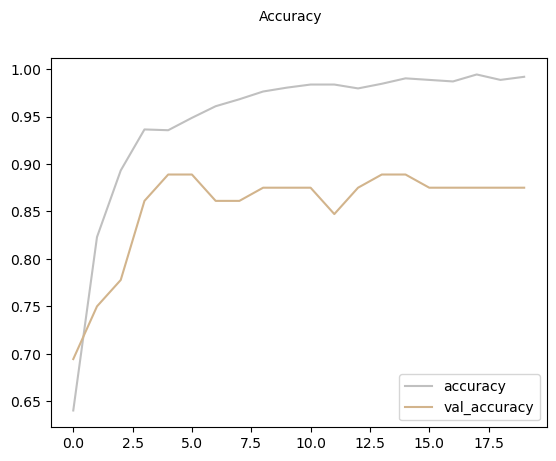

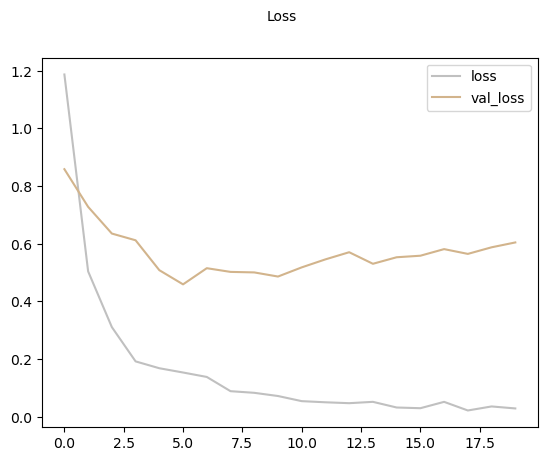

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step
              precision    recall  f1-score   support

           0     0.9273    0.8500    0.8870       120
           1     0.8750    0.9608    0.9159        51
           2     1.0000    0.9815    0.9907        54
           3     0.8438    0.9000    0.8710        90

    accuracy                         0.9048       315
   macro avg     0.9115    0.9231    0.9161       315
weighted avg     0.9074    0.9048    0.9048       315

The Cohen's Kappa Score is: 0.8681401481853572
The execution time is 178.49767971038818 seconds


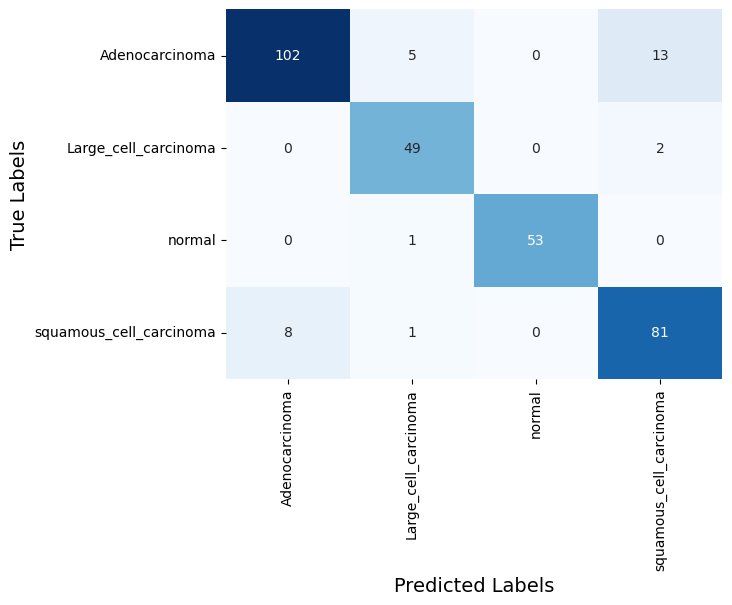

Model: "functional_42"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_42      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_42[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 21s 544ms/step - accuracy: 0.5233 - loss: 1.6539 - val_accuracy: 0.7083 - val_loss: 0.8783 - learning_rate: 0.0010
Epoch 2/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 430ms/step - accuracy: 0.8211 - loss: 0.4785 - val_accuracy: 0.7917 - val_loss: 0.6976 - learning_rate: 0.0010
Epoch 3/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 432ms/step - accuracy: 0.8804 - loss: 0.3229 - val_accuracy: 0.7778 - val_loss: 0.5823 - learning_rate: 0.0010
Epoch 4/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 446ms/step - accuracy: 0.8935 - loss: 0.3064 - val_accuracy: 0.8333 - val_loss: 0.5964 - learning_rate: 0.0010
Epoch 5/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 447ms/step - accuracy: 0.9137 - loss: 0.2334 - val_accuracy: 0.7639 - val_loss: 0.6467 - learning_rate: 0.0010
Epoch 6/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 446ms/step - accuracy: 0.9446 - loss: 0.1689 - val_accuracy: 0.8194 - val_loss: 0.4810 - learning_rate: 0.0010
Epoch 7/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 442ms/step - accuracy: 0.9639 - loss: 0.1326 -

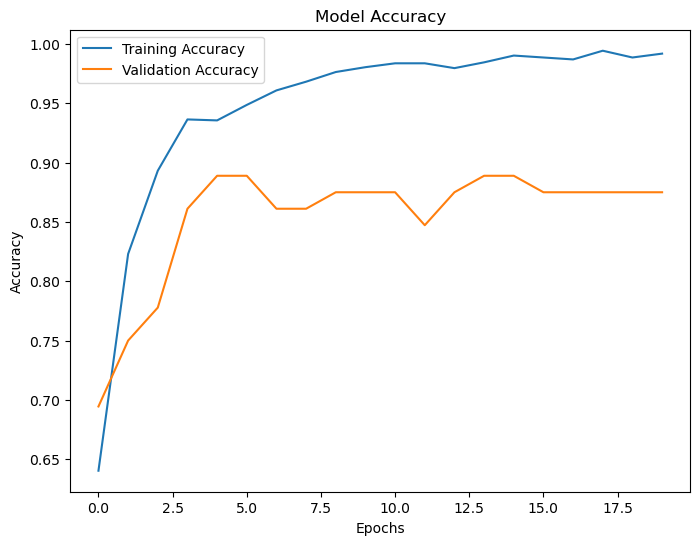

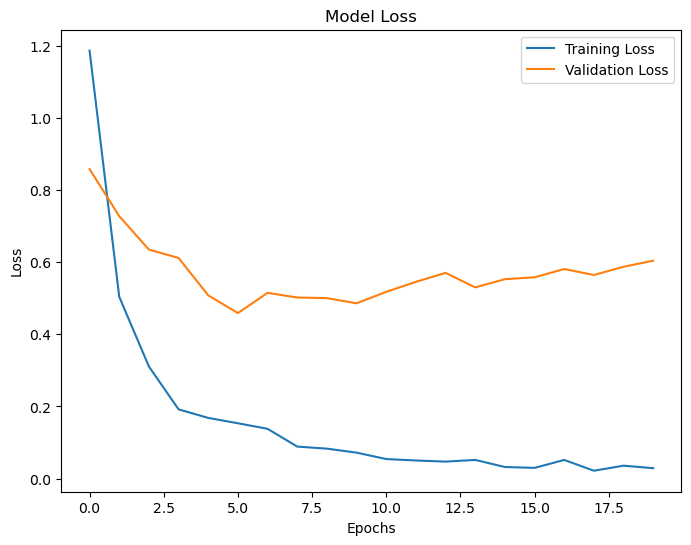

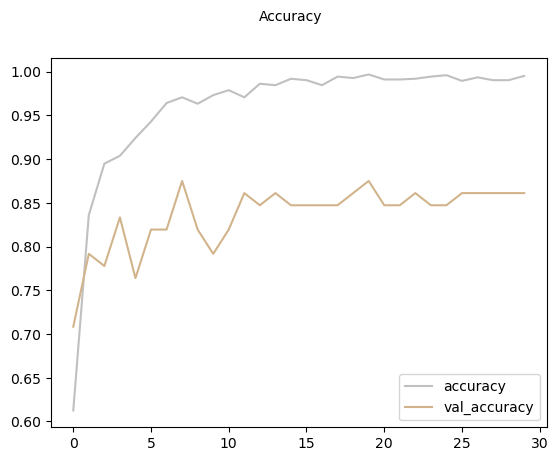

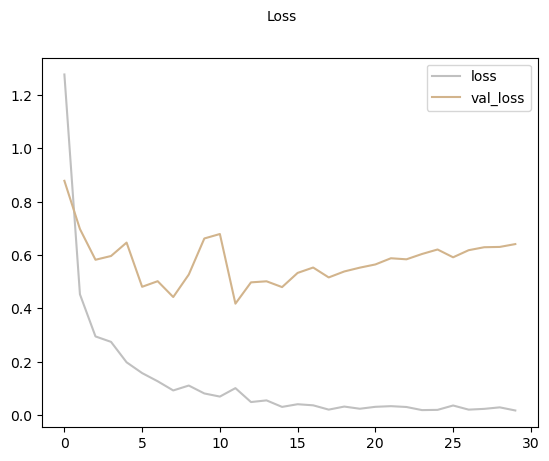

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 387ms/step
              precision    recall  f1-score   support

           0     0.9099    0.8417    0.8745       120
           1     0.9074    0.9608    0.9333        51
           2     1.0000    0.9815    0.9907        54
           3     0.8247    0.8889    0.8556        90

    accuracy                         0.8984       315
   macro avg     0.9105    0.9182    0.9135       315
weighted avg     0.9006    0.8984    0.8985       315

The Cohen's Kappa Score is: 0.8591372154445982
The execution time is 285.60204577445984 seconds


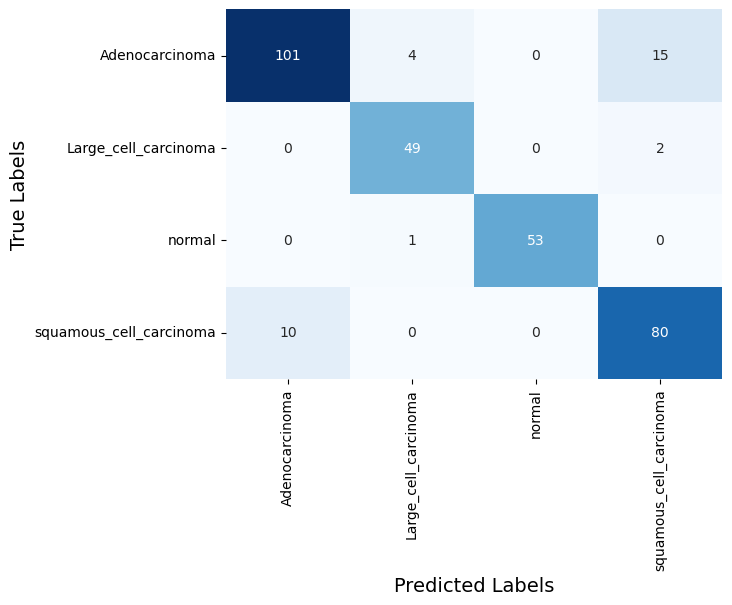

Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_43      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_43[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 473ms/step - accuracy: 0.5423 - loss: 1.7446 - val_accuracy: 0.5972 - val_loss: 0.8923 - learning_rate: 0.0010
Epoch 2/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 408ms/step - accuracy: 0.8024 - loss: 0.5740 - val_accuracy: 0.7500 - val_loss: 0.7732 - learning_rate: 0.0010
Epoch 3/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 401ms/step - accuracy: 0.8561 - loss: 0.4380 - val_accuracy: 0.7778 - val_loss: 0.6456 - learning_rate: 0.0010
Epoch 4/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 405ms/step - accuracy: 0.9302 - loss: 0.1944 - val_accuracy: 0.7500 - val_loss: 0.6566 - learning_rate: 0.0010
Epoch 5/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 405ms/step - accuracy: 0.9414 - loss: 0.1864 - val_accuracy: 0.8333 - val_loss: 0.5746 - learning_rate: 0.0010
Epoch 6/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 435ms/step - accuracy: 0.9352 - loss: 0.1787 - val_accuracy: 0.7917 - val_loss: 0.5788 - learning_rate: 0.0010
Epoch 7/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 418ms/step - accuracy: 0.9431 - loss: 0.1561 -

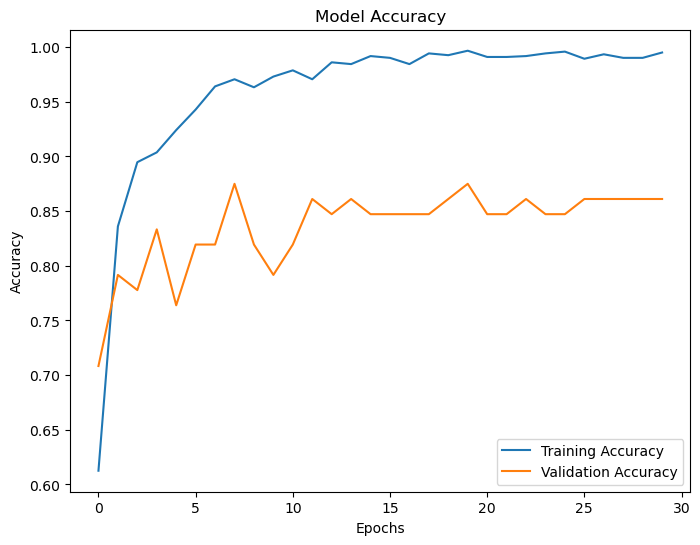

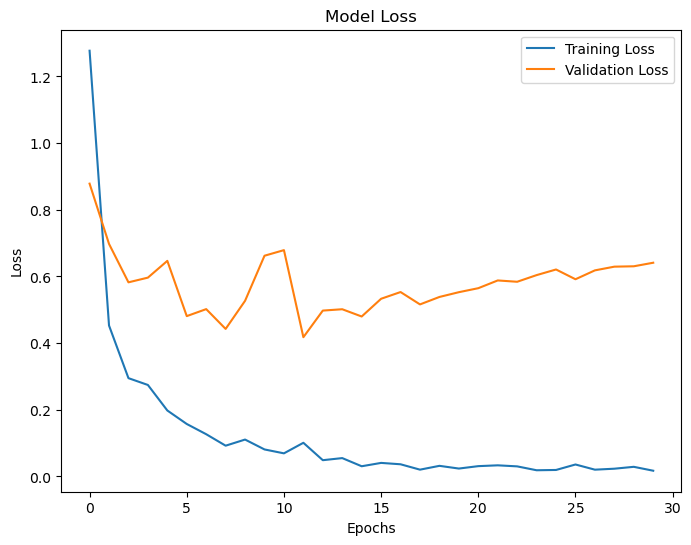

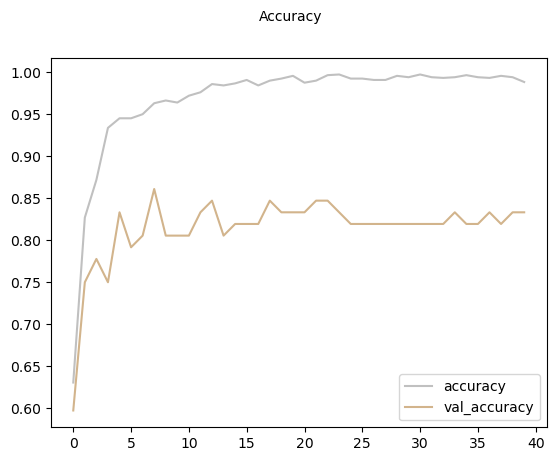

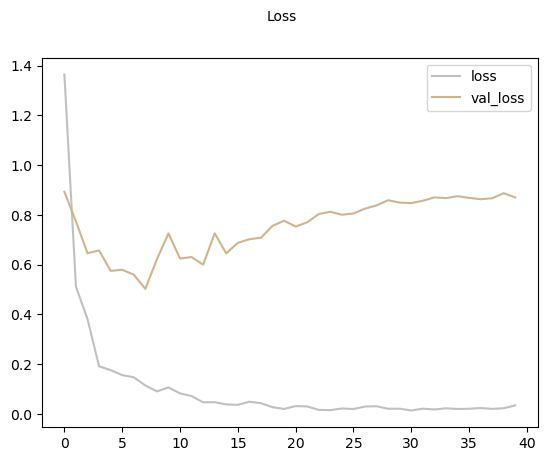

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 352ms/step
              precision    recall  f1-score   support

           0     0.9043    0.8667    0.8851       120
           1     0.9074    0.9608    0.9333        51
           2     1.0000    0.9815    0.9907        54
           3     0.8602    0.8889    0.8743        90

    accuracy                         0.9079       315
   macro avg     0.9180    0.9245    0.9209       315
weighted avg     0.9086    0.9079    0.9079       315

The Cohen's Kappa Score is: 0.8721286692142947
The execution time is 354.50294828414917 seconds


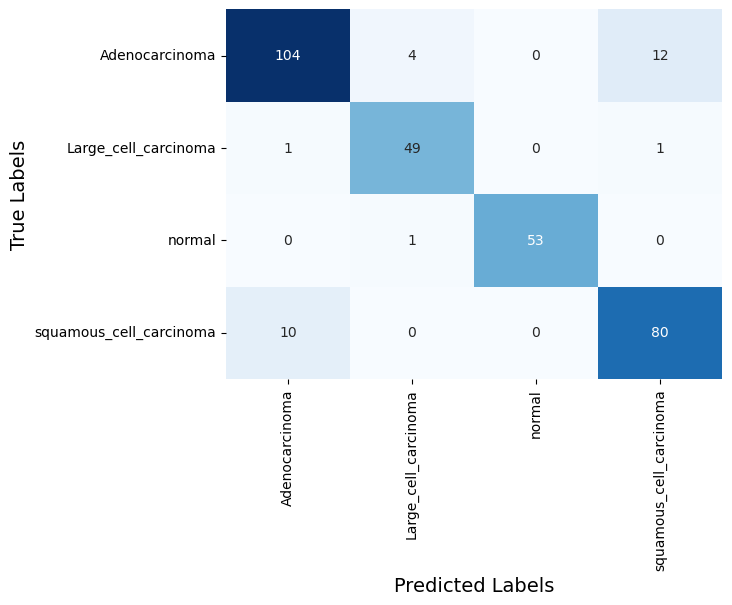

Model: "functional_44"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_44      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_44[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,566,212 (5.97 MB)

 Non-trainable params: 5,673,040 (21.64 MB)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 445ms/step - accuracy: 0.5089 - loss: 1.7313 - val_accuracy: 0.6111 - val_loss: 0.8900 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 407ms/step - accuracy: 0.8056 - loss: 0.5645 - val_accuracy: 0.7778 - val_loss: 0.6974 - learning_rate: 0.0010
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 386ms/step - accuracy: 0.8423 - loss: 0.4241 - val_accuracy: 0.8194 - val_loss: 0.5960 - learning_rate: 0.0010
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 412ms/step - accuracy: 0.9244 - loss: 0.2227 - val_accuracy: 0.8472 - val_loss: 0.5954 - learning_rate: 0.0010
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 394ms/step - accuracy: 0.9423 - loss: 0.1856 - val_accuracy: 0.8194 - val_loss: 0.5320 - learning_rate: 0.0010
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 441ms/step - accuracy: 0.9490 - loss: 0.1461 - val_accuracy: 0.7917 - val_loss: 0.4968 - learning_rate: 0.0010
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 401ms/step - accuracy: 0.9516 - loss: 0.1265 -

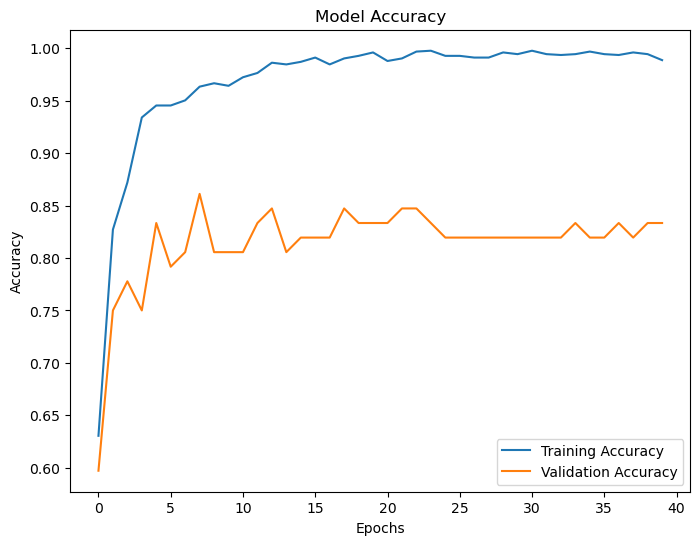

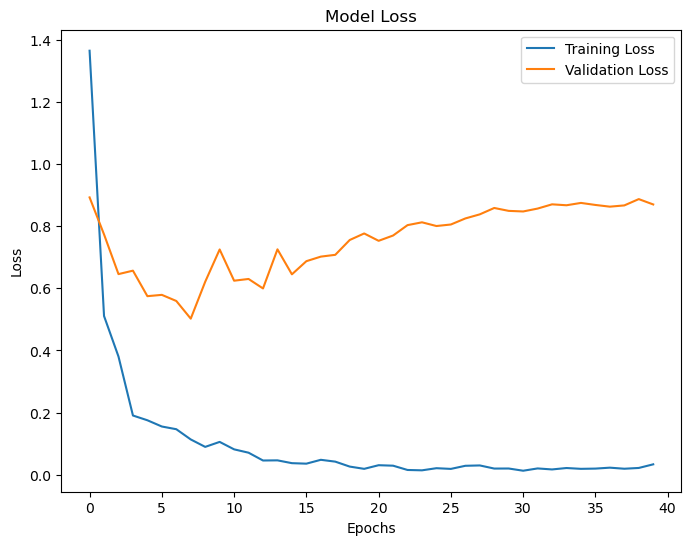

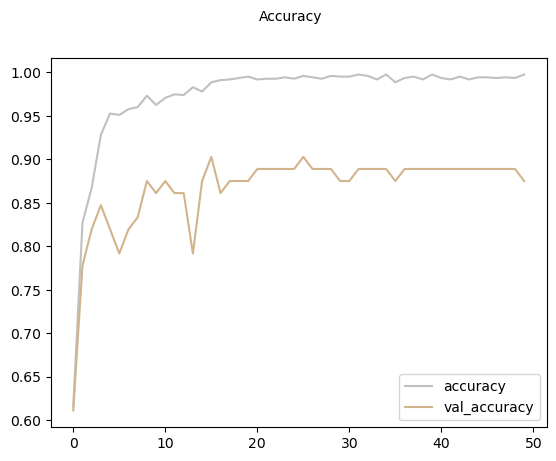

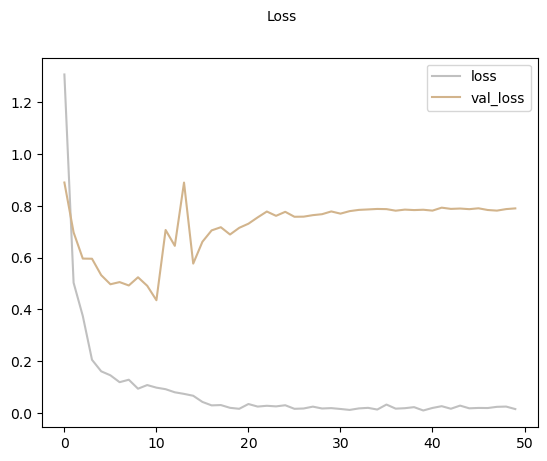

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 340ms/step
              precision    recall  f1-score   support

           0     0.8750    0.8750    0.8750       120
           1     0.8889    0.9412    0.9143        51
           2     1.0000    0.9815    0.9907        54
           3     0.8636    0.8444    0.8539        90

    accuracy                         0.8952       315
   macro avg     0.9069    0.9105    0.9085       315
weighted avg     0.8954    0.8952    0.8952       315

The Cohen's Kappa Score is: 0.8541850776417119
The execution time is 431.1927969455719 seconds


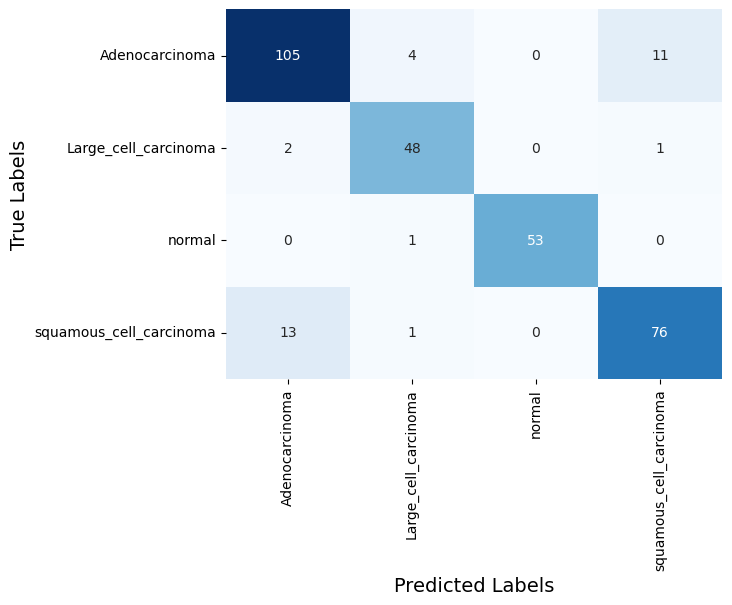

CPU times: total: 39min 5s
Wall time: 1h 24min 4s


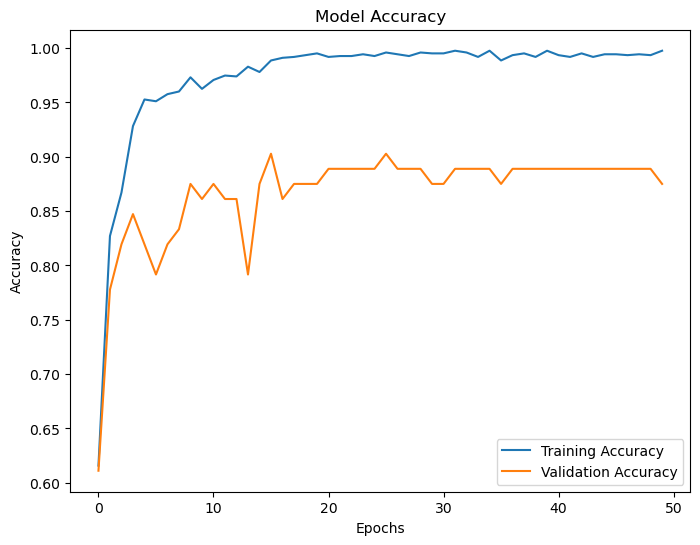

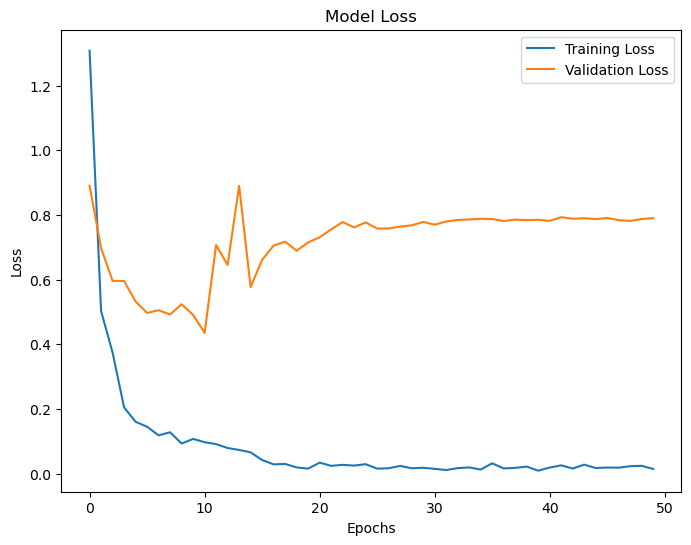

In [25]:
%%time

model_name = 'EfficientNetV2B0'

x_train = tf.image.resize(x_train, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()

def build_model_EfficientNetV2B0():
    base_model = EfficientNetV2B0(weights='imagenet', include_top=False, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-5]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

for batch in batch_list:
    for epoch_num in epoch_list:
        start_time = time.time()
        
        model_EfficientNetV2B0 = build_model_EfficientNetV2B0()
        model_EfficientNetV2B0.summary()
        
        lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)
        
        history_EfficientNetV2B0 = model_EfficientNetV2B0.fit(x_train, y_train, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

        end_time = time.time()
        
        fig = plt.figure()
        plt.plot(history_EfficientNetV2B0.history['accuracy'], color='silver', label='accuracy')
        plt.plot(history_EfficientNetV2B0.history['val_accuracy'], color='tan', label='val_accuracy')
        fig.suptitle('Accuracy', fontsize=10)
        plt.legend(loc="lower right")
        plt.show()
        
        fig = plt.figure()
        plt.plot(history_EfficientNetV2B0.history['loss'], color='silver', label='loss')
        plt.plot(history_EfficientNetV2B0.history['val_loss'], color='tan', label='val_loss')
        fig.suptitle('Loss', fontsize=10)
        plt.legend(loc="upper right")
        plt.show()
        
        y_pred = model_EfficientNetV2B0.predict(x_test)
        
        y_pred_labels = np.argmax(y_pred, axis=1)
        y_test_labels = np.argmax(y_test, axis=1)
        
        all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch, history_EfficientNetV2B0, start_time, end_time)

## EfficientNetLiteB0

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 6,052,900 (23.09 MB)

 Trainable params: 3,417,220 (13.04 MB)

 Non-trainable params: 2,635,680 (10.05 MB)

Epoch 1/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - accuracy: 0.5872 - loss: 1.7780 - val_accuracy: 0.5556 - val_loss: 1.6959 - learning_rate: 0.0010
Epoch 2/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - accuracy: 0.8218 - loss: 0.5136 - val_accuracy: 0.5833 - val_loss: 1.9794 - learning_rate: 0.0010
Epoch 3/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - accuracy: 0.8810 - loss: 0.3450 - val_accuracy: 0.7222 - val_loss: 1.4448 - learning_rate: 0.0010
Epoch 4/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - accuracy: 0.9233 - loss: 0.1979 - val_accuracy: 0.6667 - val_loss: 1.6595 - learning_rate: 0.0010
Epoch 5/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - accuracy: 0.9466 - loss: 0.1523 - val_accuracy: 0.8472 - val_loss: 1.0640 - learning_rate: 0.0010
Epoch 6/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - accuracy: 0.9402 - loss: 0.1542 - val_accuracy: 0.8472 - val_loss: 0.9368 - learning_rate: 0.0010
Epoch 7/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - accuracy: 0.9428 - loss: 0.

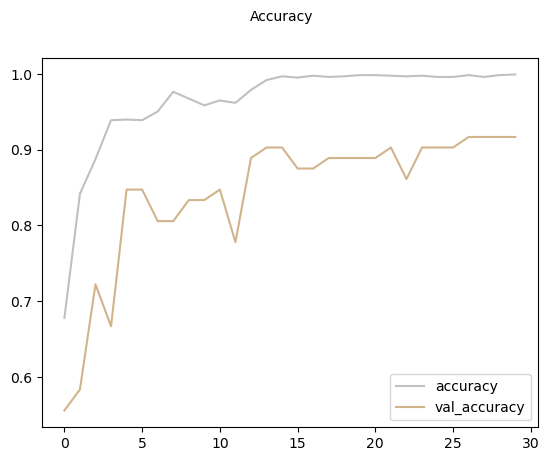

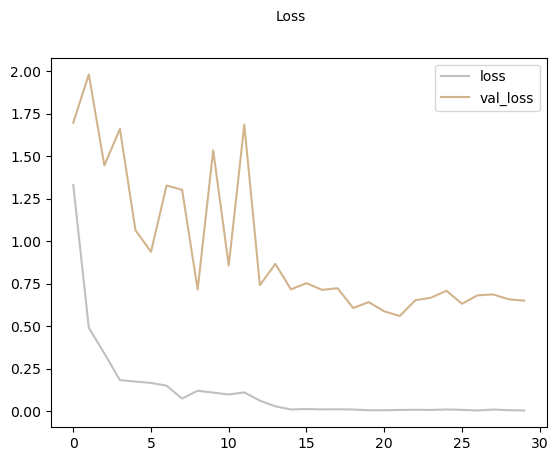

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 348ms/step
              precision    recall  f1-score   support

           0     0.8346    0.9250    0.8775       120
           1     0.9038    0.9216    0.9126        51
           2     1.0000    0.9815    0.9907        54
           3     0.9351    0.8000    0.8623        90

    accuracy                         0.8984       315
   macro avg     0.9184    0.9070    0.9108       315
weighted avg     0.9029    0.8984    0.8982       315

The Cohen's Kappa Score is: 0.8576693353666285
The execution time is 375.0163276195526 seconds


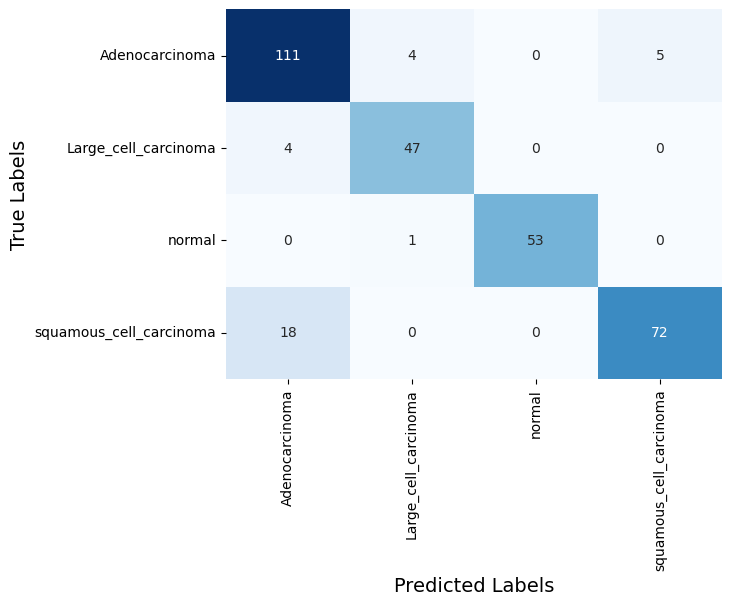

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 6,052,900 (23.09 MB)

 Trainable params: 3,417,220 (13.04 MB)

 Non-trainable params: 2,635,680 (10.05 MB)

Epoch 1/30


KeyboardInterrupt: 

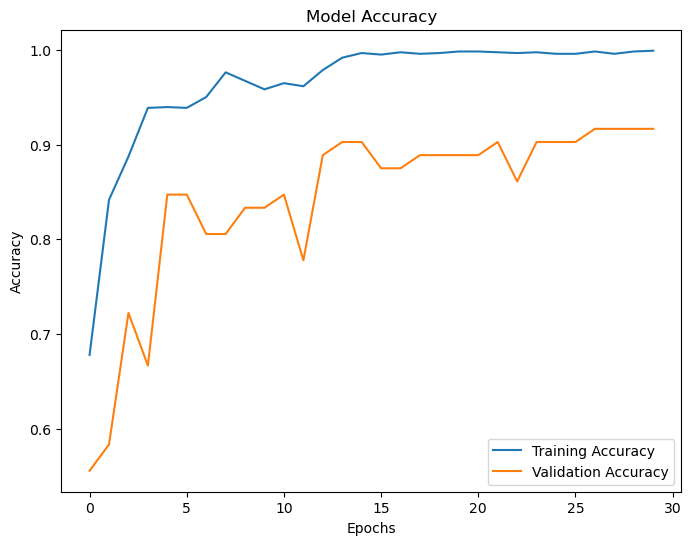

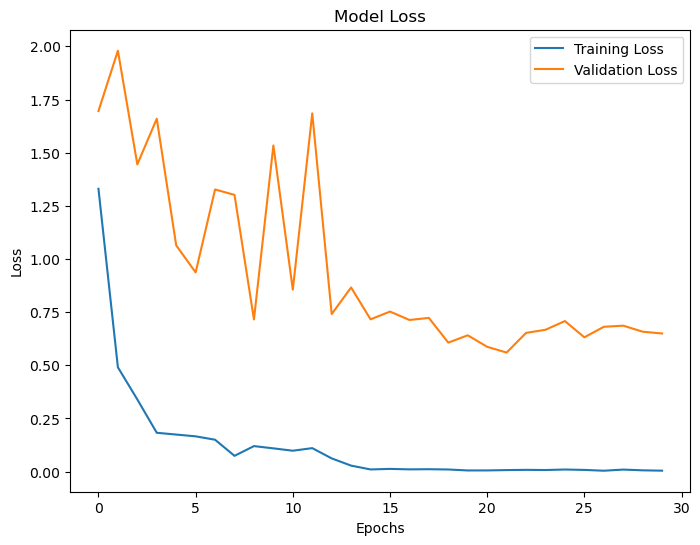

In [26]:
%%time
import time

model_name = 'EfficientNetLiteB0'

x_train = tf.image.resize(x_train, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()

def build_model_EfficientNetLiteB0():
    base_model = EfficientNetLiteB0(weights='imagenet', include_top=False)#, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-5]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

for batch in batch_list:
    for epoch_num in [30]:
        start_time = time.time()
        
        model_EfficientNetLiteB0 = build_model_EfficientNetLiteB0()
        model_EfficientNetLiteB0.summary()
        
        lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)
        
        history_EfficientNetLiteB0 = model_EfficientNetLiteB0.fit(x_train, y_train, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

        end_time = time.time()
        
        fig = plt.figure()
        plt.plot(history_EfficientNetLiteB0.history['accuracy'], color='silver', label='accuracy')
        plt.plot(history_EfficientNetLiteB0.history['val_accuracy'], color='tan', label='val_accuracy')
        fig.suptitle('Accuracy', fontsize=10)
        plt.legend(loc="lower right")
        plt.show()
        
        fig = plt.figure()
        plt.plot(history_EfficientNetLiteB0.history['loss'], color='silver', label='loss')
        plt.plot(history_EfficientNetLiteB0.history['val_loss'], color='tan', label='val_loss')
        fig.suptitle('Loss', fontsize=10)
        plt.legend(loc="upper right")
        plt.show()
        
        y_pred = model_EfficientNetLiteB0.predict(x_test)
        
        y_pred_labels = np.argmax(y_pred, axis=1)
        y_test_labels = np.argmax(y_test, axis=1)
        
        all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch, history_EfficientNetLiteB0, start_time, end_time)

## EfficientNetLiteB1

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_15[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - accuracy: 0.5640 - loss: 1.7151 - val_accuracy: 0.6806 - val_loss: 0.7685 - learning_rate: 0.0010
Epoch 2/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - accuracy: 0.7919 - loss: 0.5845 - val_accuracy: 0.7222 - val_loss: 0.6496 - learning_rate: 0.0010
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - accuracy: 0.8636 - loss: 0.3751 - val_accuracy: 0.8333 - val_loss: 0.4697 - learning_rate: 0.0010
Epoch 4/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - accuracy: 0.8891 - loss: 0.2775 - val_accuracy: 0.8750 - val_loss: 0.5015 - learning_rate: 0.0010
Epoch 5/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - accuracy: 0.9280 - loss: 0.1792 - val_accuracy: 0.7500 - val_loss: 1.3537 - learning_rate: 0.0010
Epoch 6/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - accuracy: 0.9459 - loss: 0.1580 - val_accuracy: 0.7222 - val_loss: 0.7535 - learning_rate: 0.0010
Epoch 7/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - accuracy: 0.9553 - loss: 0.

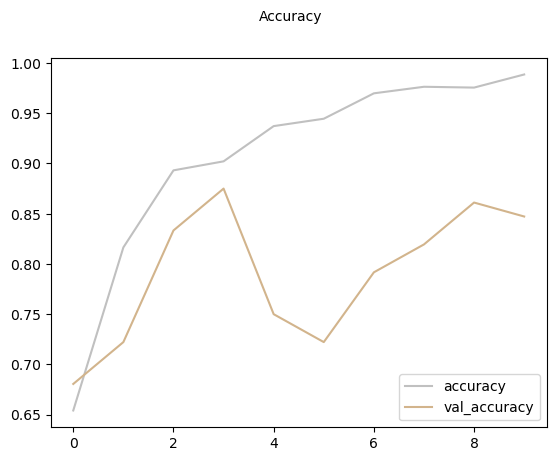

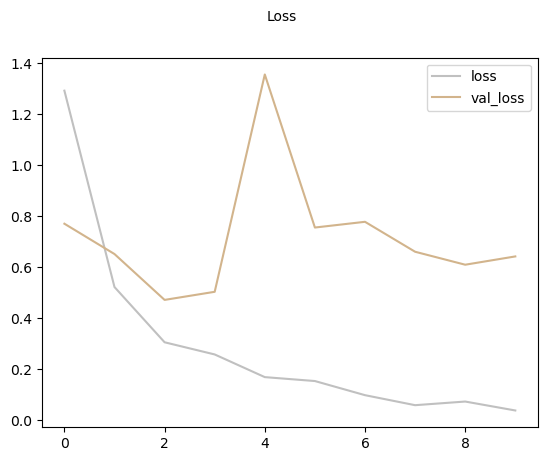

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 319ms/step
              precision    recall  f1-score   support

           0     0.8908    0.8833    0.8870       120
           1     0.8868    0.9216    0.9038        51
           2     1.0000    0.9815    0.9907        54
           3     0.8556    0.8556    0.8556        90

    accuracy                         0.8984       315
   macro avg     0.9083    0.9105    0.9093       315
weighted avg     0.8988    0.8984    0.8985       315

The Cohen's Kappa Score is: 0.8585858585858586
The execution time is 129.01010656356812 seconds


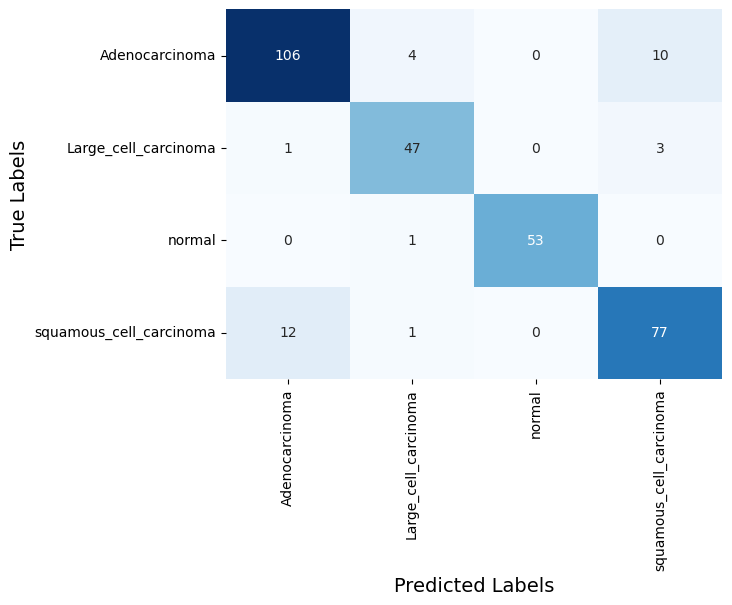

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_16[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - accuracy: 0.5309 - loss: 1.7957 - val_accuracy: 0.6528 - val_loss: 1.0074 - learning_rate: 0.0010
Epoch 2/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - accuracy: 0.7989 - loss: 0.5719 - val_accuracy: 0.7639 - val_loss: 0.6414 - learning_rate: 0.0010
Epoch 3/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - accuracy: 0.8793 - loss: 0.3541 - val_accuracy: 0.7917 - val_loss: 0.4589 - learning_rate: 0.0010
Epoch 4/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - accuracy: 0.9246 - loss: 0.1900 - val_accuracy: 0.7222 - val_loss: 0.7232 - learning_rate: 0.0010
Epoch 5/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - accuracy: 0.9163 - loss: 0.2509 - val_accuracy: 0.7917 - val_loss: 0.9446 - learning_rate: 0.0010
Epoch 6/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - accuracy: 0.9409 - loss: 0.1769 - val_accuracy: 0.8194 - val_loss: 0.8005 - learning_rate: 0.0010
Epoch 7/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - accuracy: 0.9519 - loss: 0.

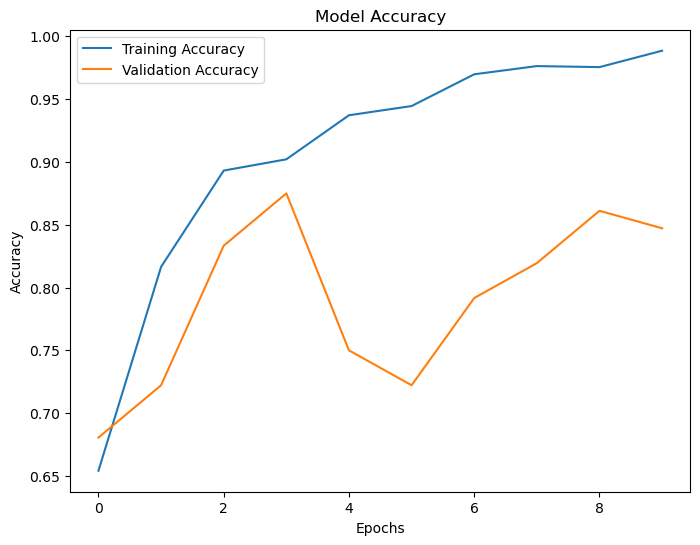

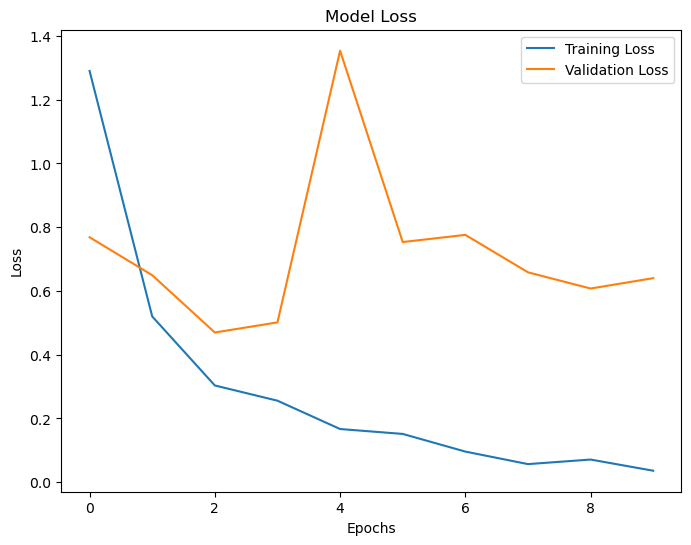

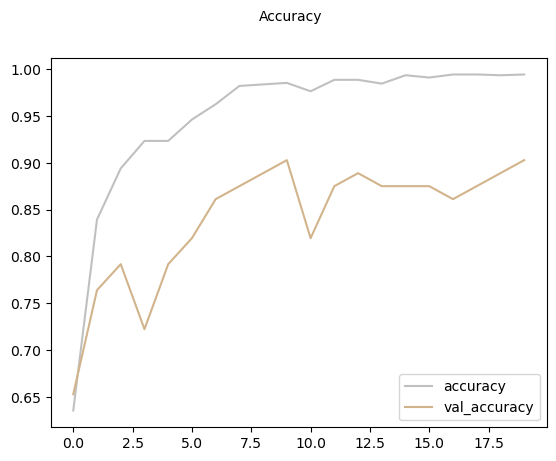

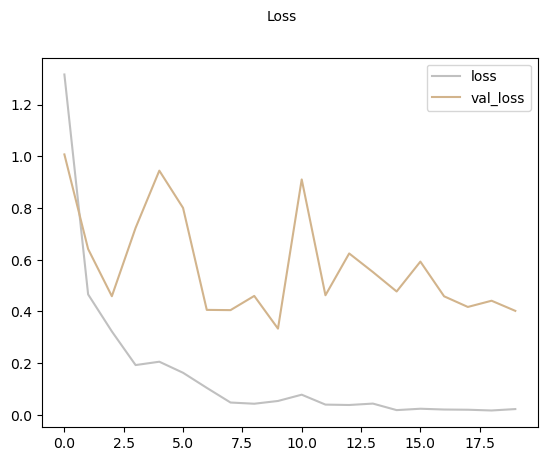

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 327ms/step
              precision    recall  f1-score   support

           0     0.8406    0.9667    0.8992       120
           1     0.9375    0.8824    0.9091        51
           2     1.0000    0.9815    0.9907        54
           3     0.9342    0.7889    0.8554        90

    accuracy                         0.9048       315
   macro avg     0.9281    0.9048    0.9136       315
weighted avg     0.9104    0.9048    0.9040       315

The Cohen's Kappa Score is: 0.8659859604339503
The execution time is 228.91035747528076 seconds


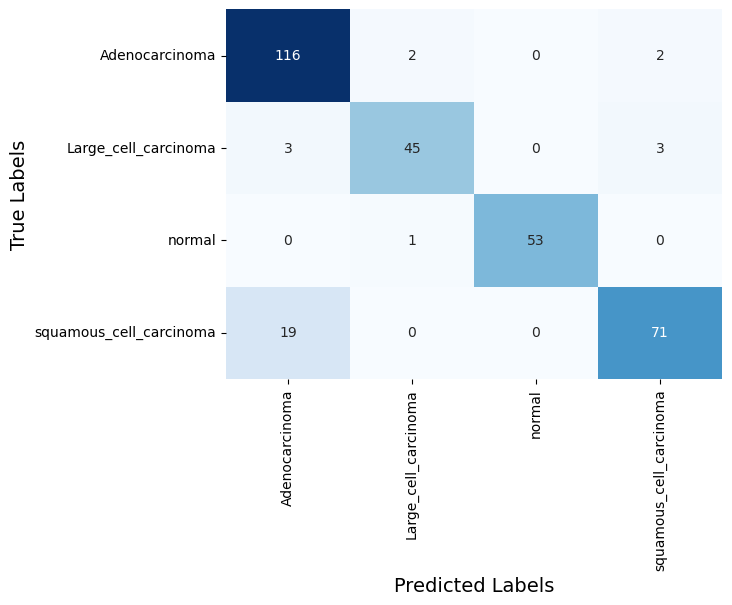

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_17[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - accuracy: 0.5520 - loss: 1.6439 - val_accuracy: 0.6111 - val_loss: 0.9711 - learning_rate: 0.0010
Epoch 2/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - accuracy: 0.8100 - loss: 0.5642 - val_accuracy: 0.5972 - val_loss: 1.2473 - learning_rate: 0.0010
Epoch 3/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - accuracy: 0.8713 - loss: 0.3208 - val_accuracy: 0.7361 - val_loss: 1.2001 - learning_rate: 0.0010
Epoch 4/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - accuracy: 0.8885 - loss: 0.2972 - val_accuracy: 0.7222 - val_loss: 0.9338 - learning_rate: 0.0010
Epoch 5/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - accuracy: 0.9036 - loss: 0.2510 - val_accuracy: 0.7778 - val_loss: 0.7193 - learning_rate: 0.0010
Epoch 6/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - accuracy: 0.9322 - loss: 0.1618 - val_accuracy: 0.7917 - val_loss: 0.5646 - learning_rate: 0.0010
Epoch 7/30
77/77 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - accuracy: 0.9513 - loss: 0.

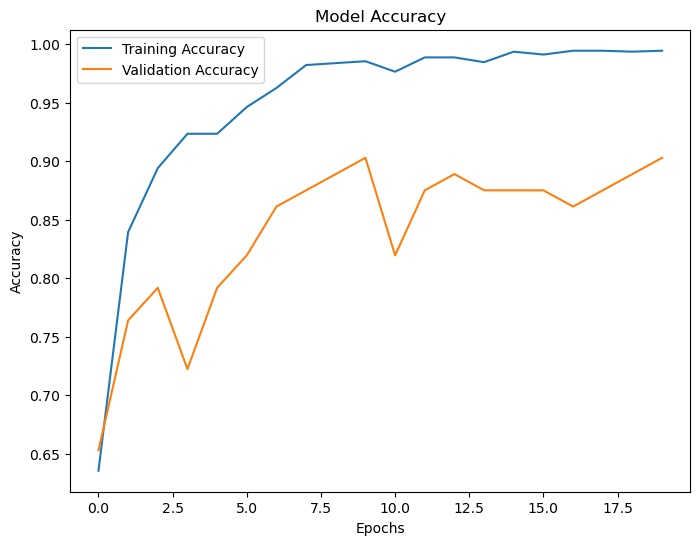

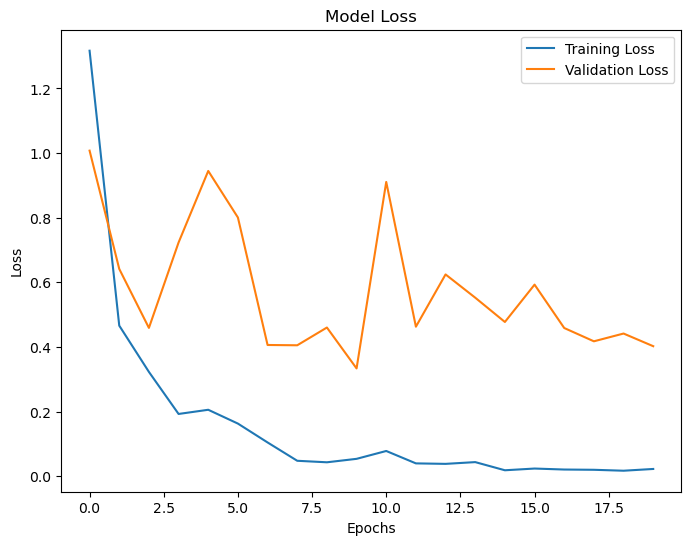

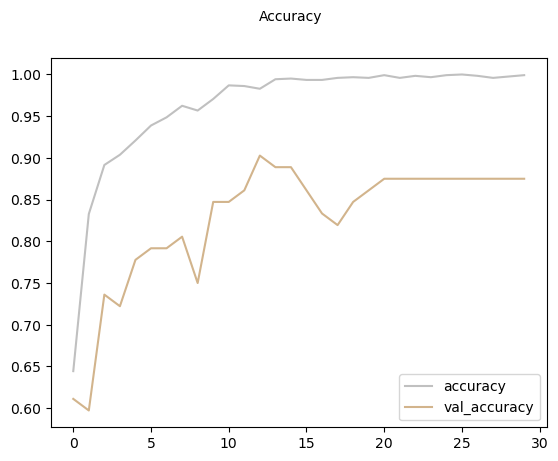

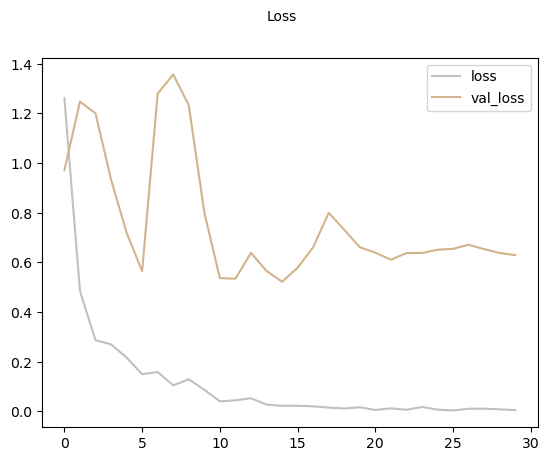

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 313ms/step
              precision    recall  f1-score   support

           0     0.8800    0.9167    0.8980       120
           1     0.9231    0.9412    0.9320        51
           2     1.0000    0.9815    0.9907        54
           3     0.8941    0.8444    0.8686        90

    accuracy                         0.9111       315
   macro avg     0.9243    0.9209    0.9223       315
weighted avg     0.9116    0.9111    0.9110       315

The Cohen's Kappa Score is: 0.875881285093089
The execution time is 355.67021560668945 seconds


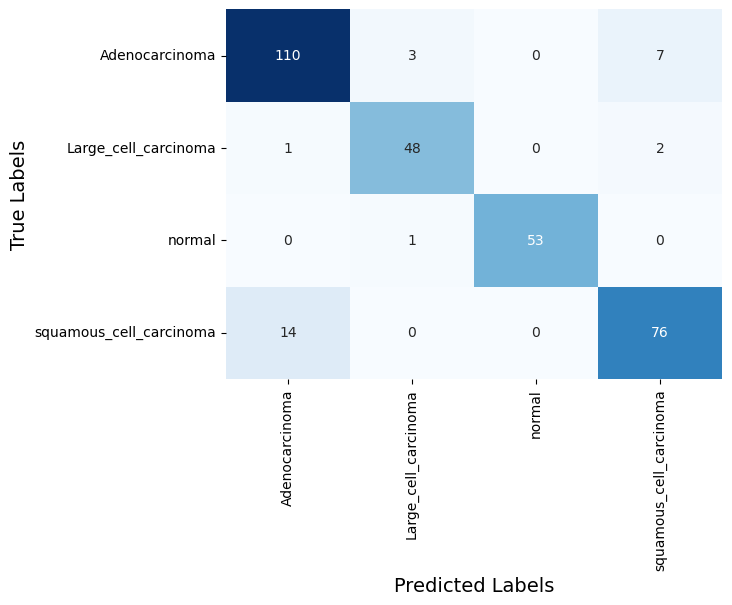

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_18[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - accuracy: 0.5501 - loss: 1.6257 - val_accuracy: 0.5833 - val_loss: 1.2482 - learning_rate: 0.0010
Epoch 2/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - accuracy: 0.8082 - loss: 0.5803 - val_accuracy: 0.6667 - val_loss: 0.7722 - learning_rate: 0.0010
Epoch 3/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 138ms/step - accuracy: 0.8414 - loss: 0.4126 - val_accuracy: 0.4861 - val_loss: 2.4329 - learning_rate: 0.0010
Epoch 4/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - accuracy: 0.8991 - loss: 0.2677 - val_accuracy: 0.8472 - val_loss: 0.9320 - learning_rate: 0.0010
Epoch 5/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - accuracy: 0.9460 - loss: 0.1755 - val_accuracy: 0.7778 - val_loss: 1.1122 - learning_rate: 0.0010
Epoch 6/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 138ms/step - accuracy: 0.9395 - loss: 0.1340 - val_accuracy: 0.8472 - val_loss: 0.7598 - learning_rate: 5.0000e-04
Epoch 7/40
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - accuracy: 0.9634 - loss

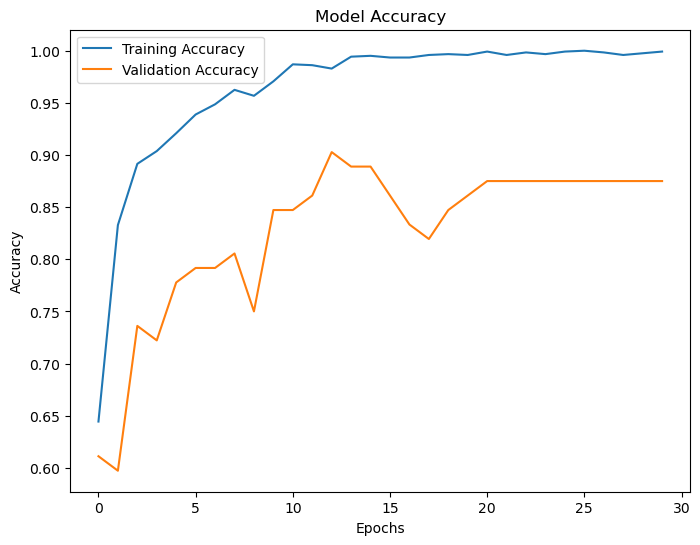

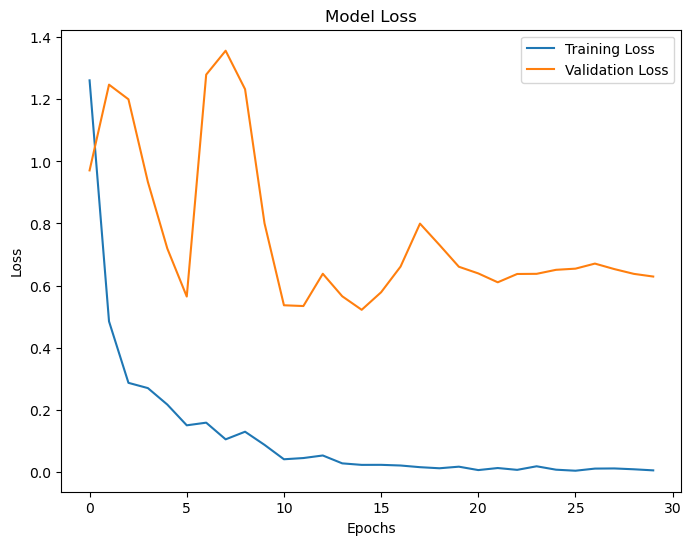

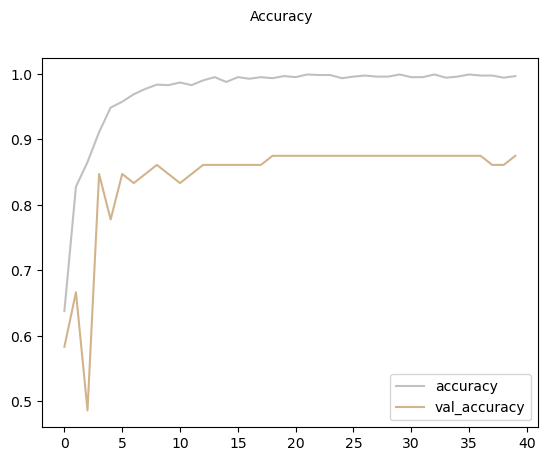

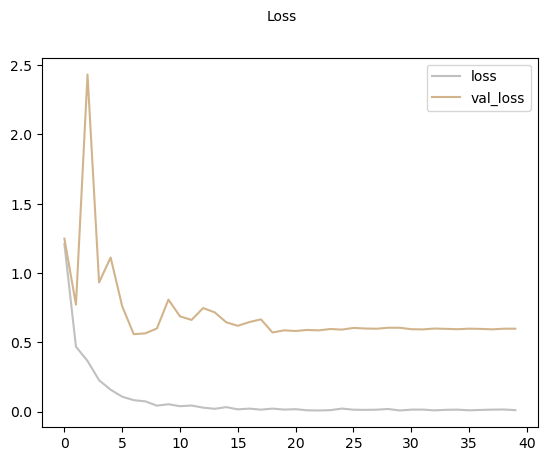

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 311ms/step
              precision    recall  f1-score   support

           0     0.8615    0.9333    0.8960       120
           1     0.9375    0.8824    0.9091        51
           2     1.0000    1.0000    1.0000        54
           3     0.9036    0.8333    0.8671        90

    accuracy                         0.9079       315
   macro avg     0.9257    0.9123    0.9180       315
weighted avg     0.9096    0.9079    0.9077       315

The Cohen's Kappa Score is: 0.8709581726490656
The execution time is 449.43852615356445 seconds


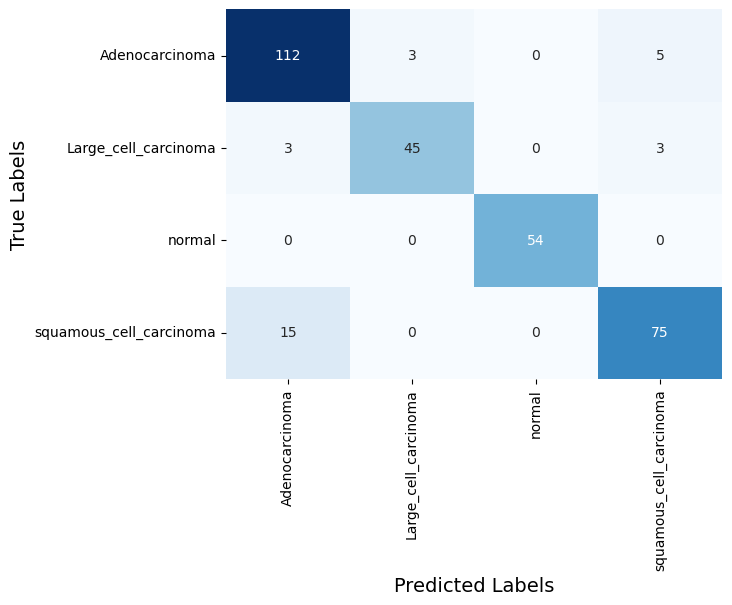

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_19      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_19[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - accuracy: 0.5571 - loss: 1.6281 - val_accuracy: 0.6111 - val_loss: 0.7803 - learning_rate: 0.0010
Epoch 2/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - accuracy: 0.7910 - loss: 0.5782 - val_accuracy: 0.6389 - val_loss: 1.2826 - learning_rate: 0.0010
Epoch 3/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - accuracy: 0.8727 - loss: 0.3410 - val_accuracy: 0.7222 - val_loss: 1.0491 - learning_rate: 0.0010
Epoch 4/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - accuracy: 0.8994 - loss: 0.2516 - val_accuracy: 0.8333 - val_loss: 0.6533 - learning_rate: 0.0010
Epoch 5/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - accuracy: 0.9115 - loss: 0.2313 - val_accuracy: 0.7361 - val_loss: 1.1502 - learning_rate: 0.0010
Epoch 6/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - accuracy: 0.9422 - loss: 0.1636 - val_accuracy: 0.8611 - val_loss: 0.5838 - learning_rate: 0.0010
Epoch 7/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - accuracy: 0.9413 - loss: 0.

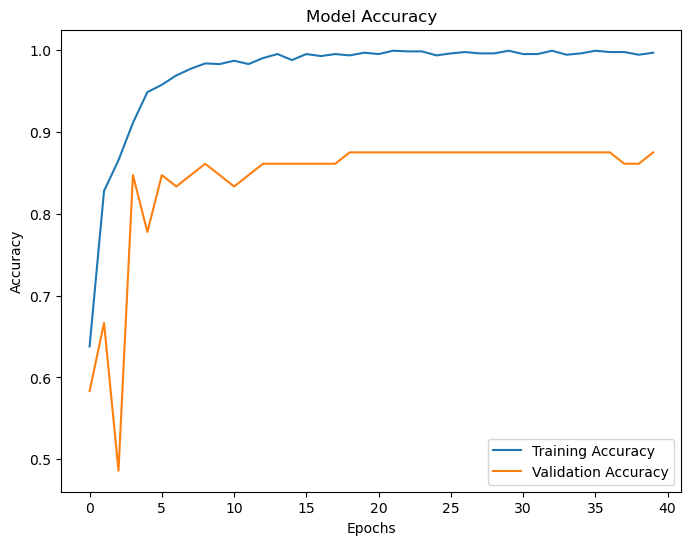

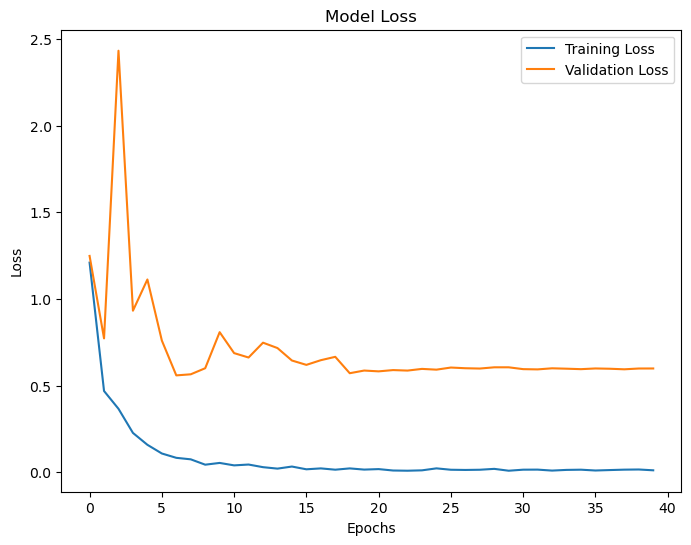

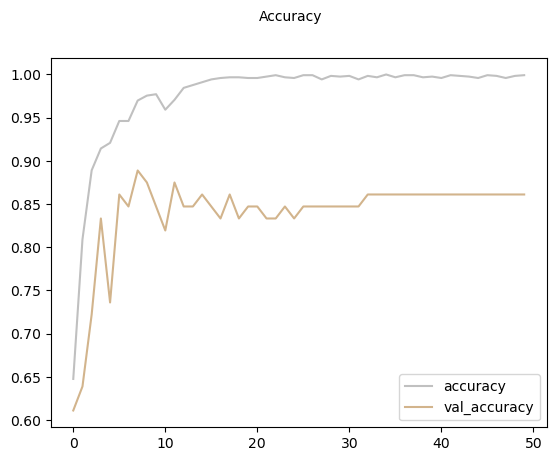

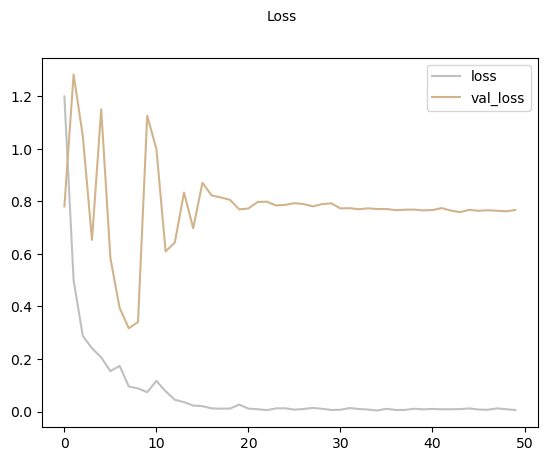

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 323ms/step
              precision    recall  f1-score   support

           0     0.8473    0.9250    0.8845       120
           1     0.8679    0.9020    0.8846        51
           2     1.0000    0.9815    0.9907        54
           3     0.9103    0.7889    0.8452        90

    accuracy                         0.8921       315
   macro avg     0.9064    0.8993    0.9012       315
weighted avg     0.8948    0.8921    0.8915       315

The Cohen's Kappa Score is: 0.8489847715736041
The execution time is 559.3554832935333 seconds


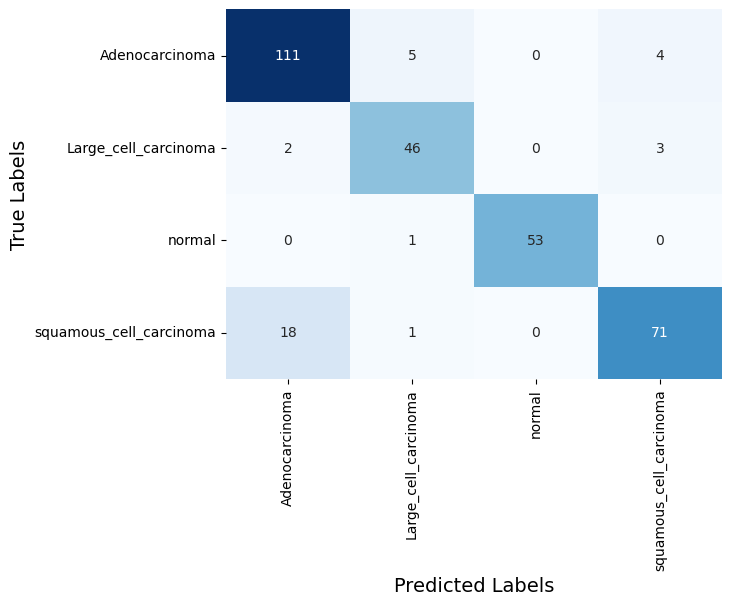

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_20[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 307ms/step - accuracy: 0.5583 - loss: 1.5601 - val_accuracy: 0.6806 - val_loss: 0.8196 - learning_rate: 0.0010
Epoch 2/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 277ms/step - accuracy: 0.7974 - loss: 0.5914 - val_accuracy: 0.5694 - val_loss: 1.0267 - learning_rate: 0.0010
Epoch 3/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - accuracy: 0.8839 - loss: 0.3221 - val_accuracy: 0.6250 - val_loss: 1.3511 - learning_rate: 0.0010
Epoch 4/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 287ms/step - accuracy: 0.9262 - loss: 0.2102 - val_accuracy: 0.7500 - val_loss: 0.8073 - learning_rate: 0.0010
Epoch 5/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 281ms/step - accuracy: 0.9466 - loss: 0.1264 - val_accuracy: 0.7222 - val_loss: 0.8672 - learning_rate: 0.0010
Epoch 6/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 299ms/step - accuracy: 0.9627 - loss: 0.1058 - val_accuracy: 0.8056 - val_loss: 0.6961 - learning_rate: 0.0010
Epoch 7/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 299ms/step - accuracy: 0.9516 - loss: 0.

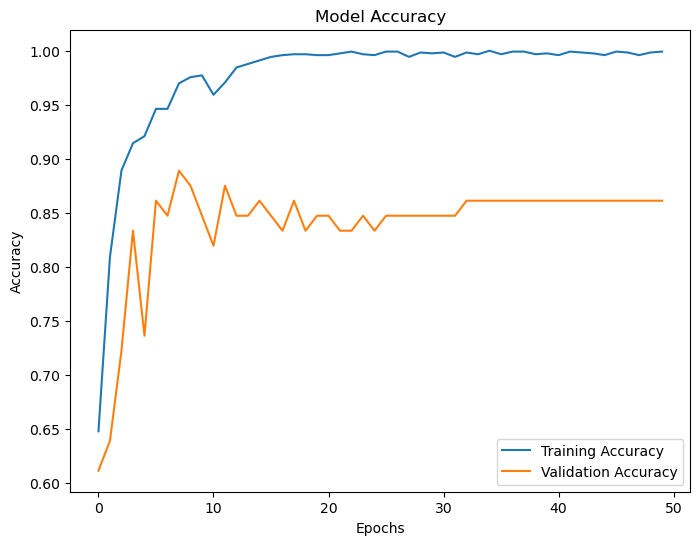

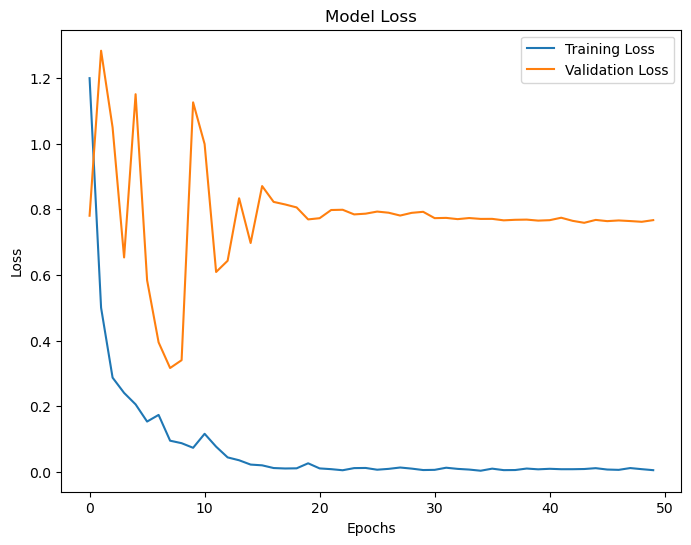

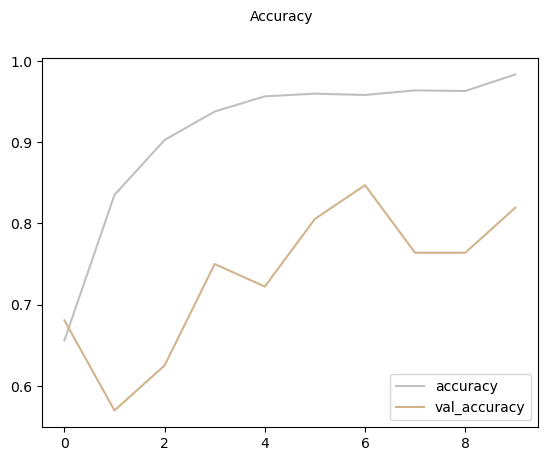

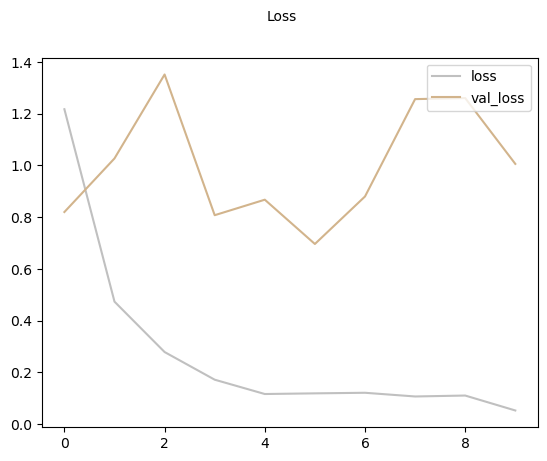

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 331ms/step
              precision    recall  f1-score   support

           0     0.9020    0.7667    0.8288       120
           1     0.9048    0.7451    0.8172        51
           2     0.9643    1.0000    0.9818        54
           3     0.7130    0.9111    0.8000        90

    accuracy                         0.8444       315
   macro avg     0.8710    0.8557    0.8570       315
weighted avg     0.8591    0.8444    0.8449       315

The Cohen's Kappa Score is: 0.7840322377534316
The execution time is 119.50785851478577 seconds


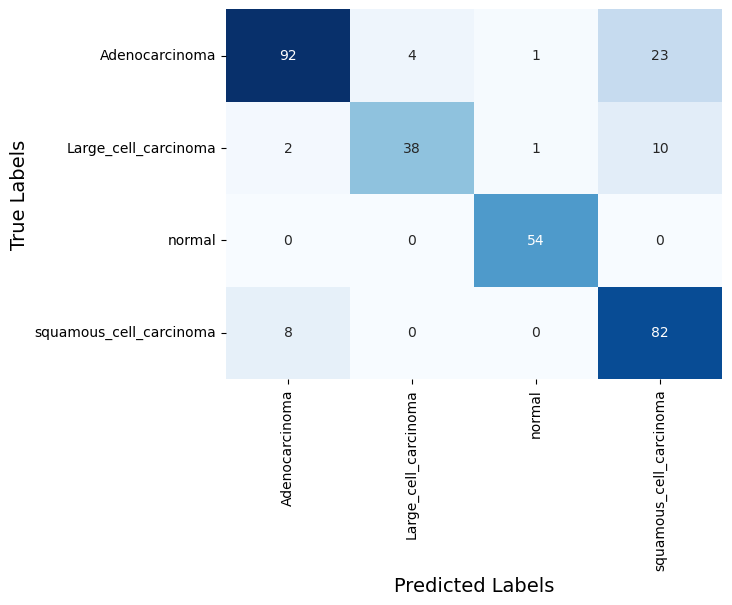

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_21[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 16s 280ms/step - accuracy: 0.5462 - loss: 1.5996 - val_accuracy: 0.6667 - val_loss: 0.8031 - learning_rate: 0.0010
Epoch 2/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - accuracy: 0.8013 - loss: 0.5241 - val_accuracy: 0.6944 - val_loss: 0.7040 - learning_rate: 0.0010
Epoch 3/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 255ms/step - accuracy: 0.9116 - loss: 0.2469 - val_accuracy: 0.7639 - val_loss: 0.5578 - learning_rate: 0.0010
Epoch 4/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 263ms/step - accuracy: 0.9431 - loss: 0.1638 - val_accuracy: 0.7500 - val_loss: 0.5998 - learning_rate: 0.0010
Epoch 5/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - accuracy: 0.9445 - loss: 0.1758 - val_accuracy: 0.8472 - val_loss: 0.6103 - learning_rate: 0.0010
Epoch 6/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9450 - loss: 0.1449 - val_accuracy: 0.8333 - val_loss: 0.6601 - learning_rate: 0.0010
Epoch 7/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - accuracy: 0.9641 - loss: 0.0

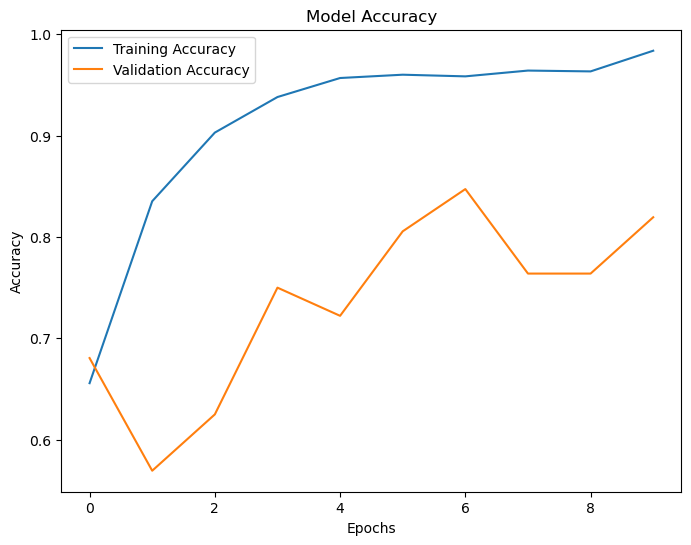

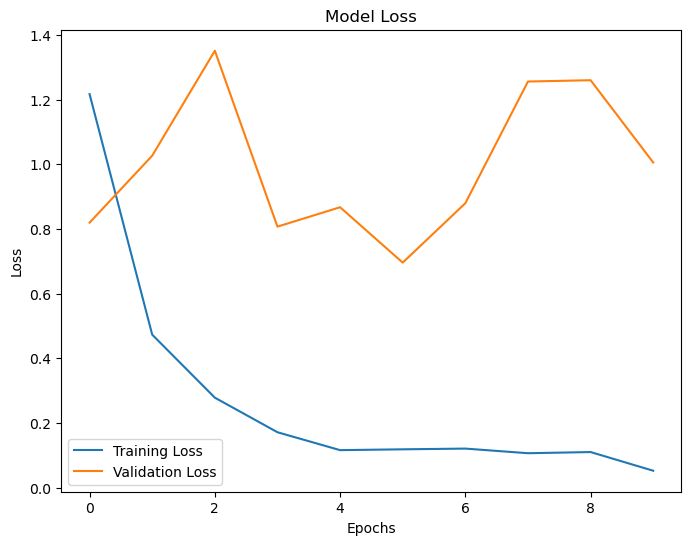

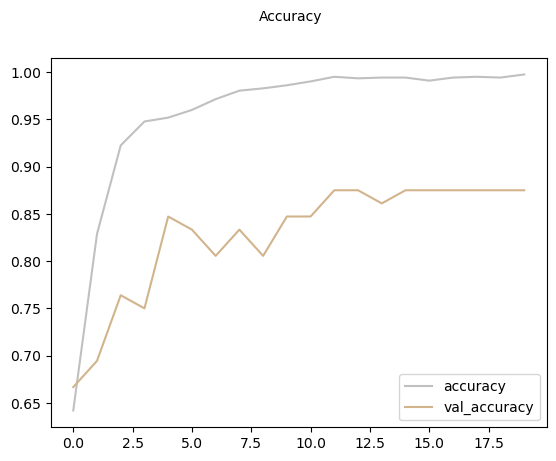

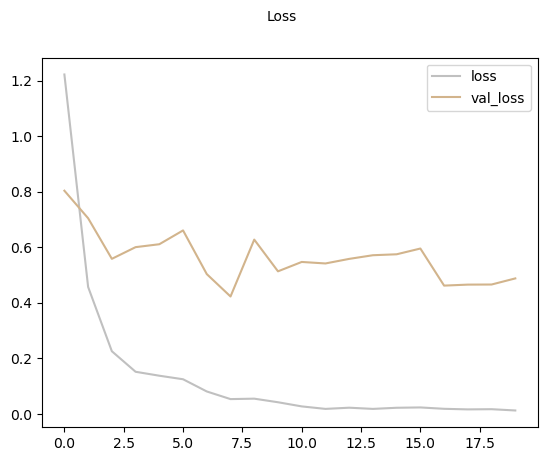

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 310ms/step
              precision    recall  f1-score   support

           0     0.8760    0.8833    0.8797       120
           1     0.8704    0.9216    0.8952        51
           2     1.0000    0.9815    0.9907        54
           3     0.8506    0.8222    0.8362        90

    accuracy                         0.8889       315
   macro avg     0.8992    0.9022    0.9004       315
weighted avg     0.8891    0.8889    0.8888       315

The Cohen's Kappa Score is: 0.8452827011324885
The execution time is 212.48239135742188 seconds


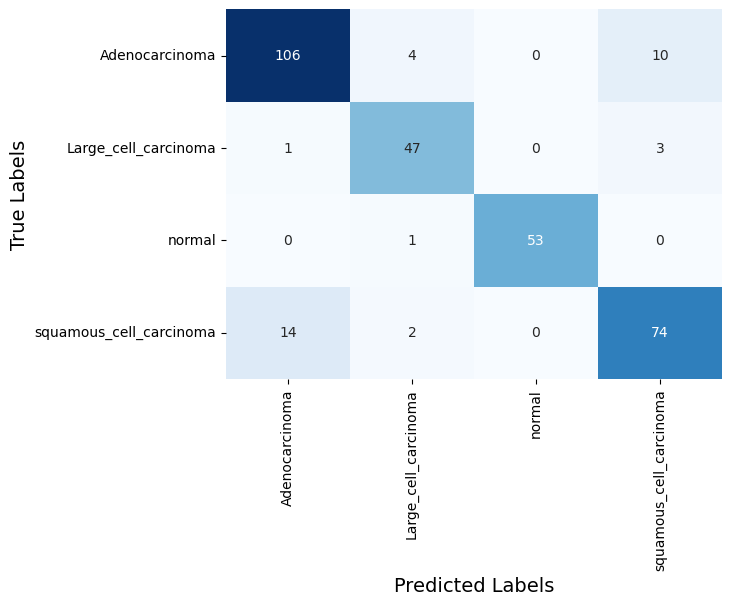

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_22[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - accuracy: 0.5596 - loss: 1.5677 - val_accuracy: 0.6250 - val_loss: 0.7070 - learning_rate: 0.0010
Epoch 2/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - accuracy: 0.8251 - loss: 0.5248 - val_accuracy: 0.6528 - val_loss: 0.9205 - learning_rate: 0.0010
Epoch 3/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - accuracy: 0.8819 - loss: 0.3332 - val_accuracy: 0.7500 - val_loss: 0.6669 - learning_rate: 0.0010
Epoch 4/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 10s 267ms/step - accuracy: 0.9184 - loss: 0.2061 - val_accuracy: 0.7500 - val_loss: 0.9350 - learning_rate: 0.0010
Epoch 5/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 270ms/step - accuracy: 0.9439 - loss: 0.1562 - val_accuracy: 0.8194 - val_loss: 0.5768 - learning_rate: 0.0010
Epoch 6/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - accuracy: 0.9525 - loss: 0.1108 - val_accuracy: 0.8472 - val_loss: 0.4946 - learning_rate: 0.0010
Epoch 7/30
39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - accuracy: 0.9714 - loss: 0.0

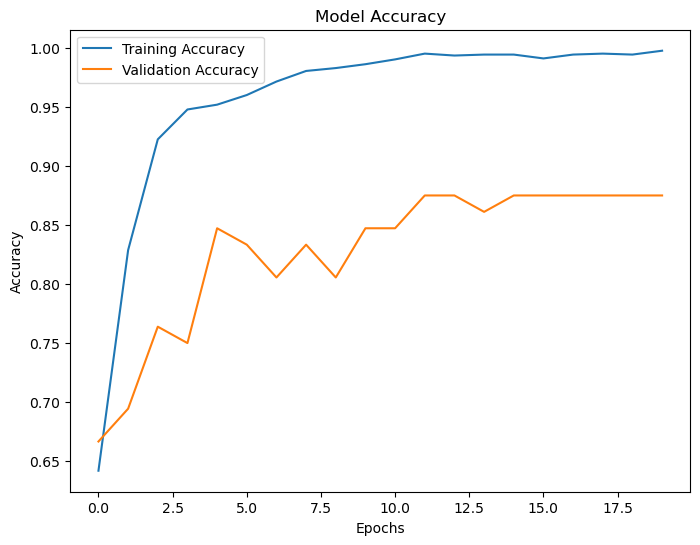

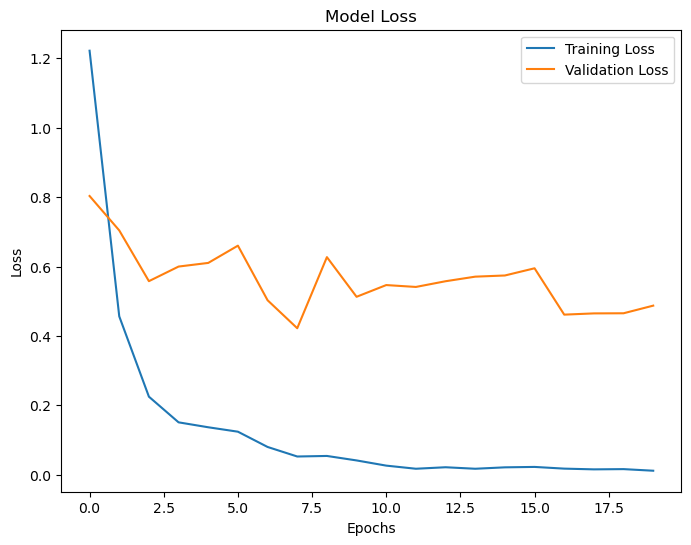

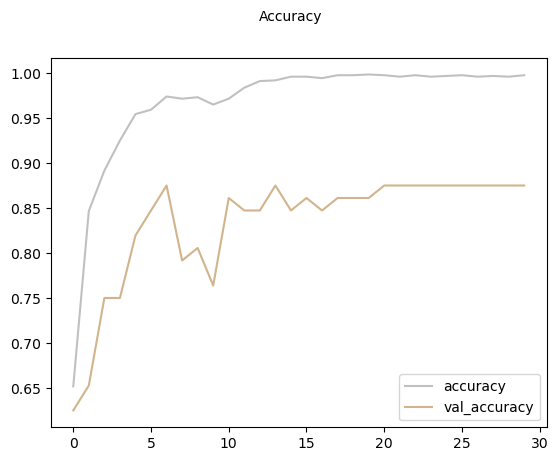

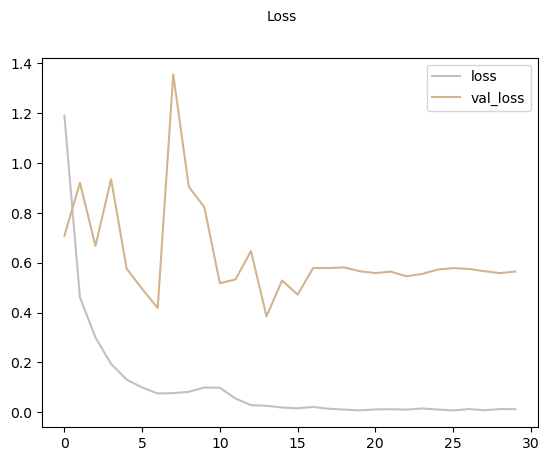

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 321ms/step
              precision    recall  f1-score   support

           0     0.8780    0.9000    0.8889       120
           1     0.9412    0.9412    0.9412        51
           2     1.0000    0.9815    0.9907        54
           3     0.8636    0.8444    0.8539        90

    accuracy                         0.9048       315
   macro avg     0.9207    0.9168    0.9187       315
weighted avg     0.9051    0.9048    0.9048       315

The Cohen's Kappa Score is: 0.8670549506204102
The execution time is 310.5099778175354 seconds


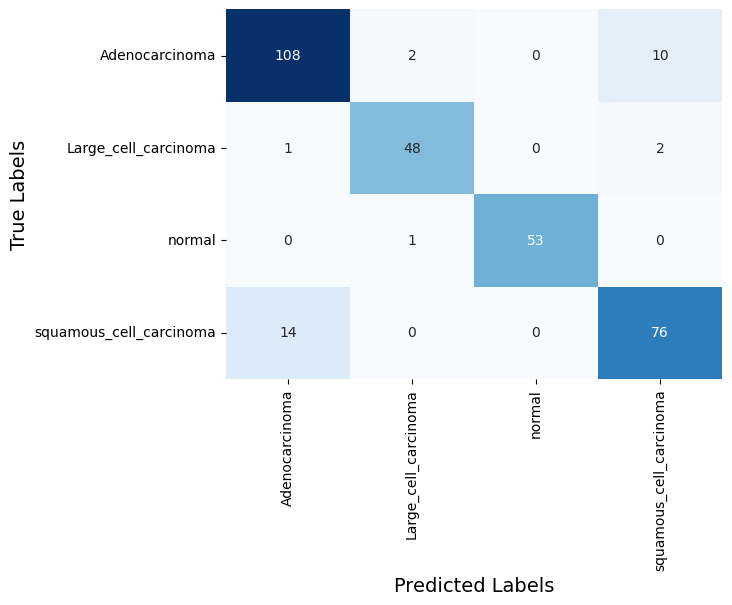

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_23      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_23[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 311ms/step - accuracy: 0.5553 - loss: 1.6339 - val_accuracy: 0.6389 - val_loss: 0.7602 - learning_rate: 0.0010
Epoch 2/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 320ms/step - accuracy: 0.8298 - loss: 0.5250 - val_accuracy: 0.6944 - val_loss: 0.6530 - learning_rate: 0.0010
Epoch 3/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 344ms/step - accuracy: 0.8795 - loss: 0.3228 - val_accuracy: 0.6806 - val_loss: 0.8436 - learning_rate: 0.0010
Epoch 4/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 14s 349ms/step - accuracy: 0.9310 - loss: 0.1784 - val_accuracy: 0.7917 - val_loss: 0.7080 - learning_rate: 0.0010
Epoch 5/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 14s 347ms/step - accuracy: 0.9360 - loss: 0.1954 - val_accuracy: 0.8472 - val_loss: 0.4748 - learning_rate: 0.0010
Epoch 6/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 327ms/step - accuracy: 0.9554 - loss: 0.1421 - val_accuracy: 0.8194 - val_loss: 0.4157 - learning_rate: 0.0010
Epoch 7/40
39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 344ms/step - accuracy: 0.9739 - loss: 0.

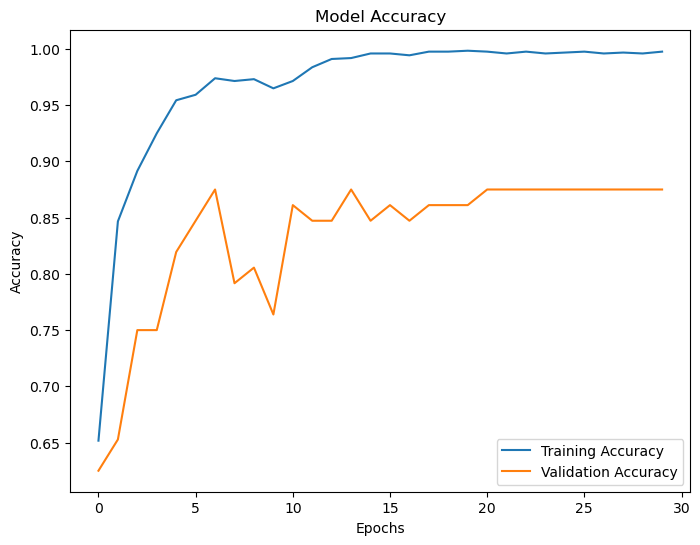

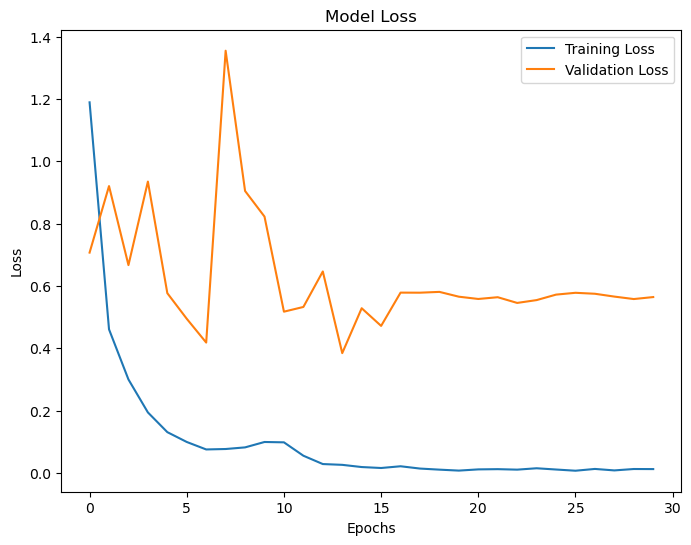

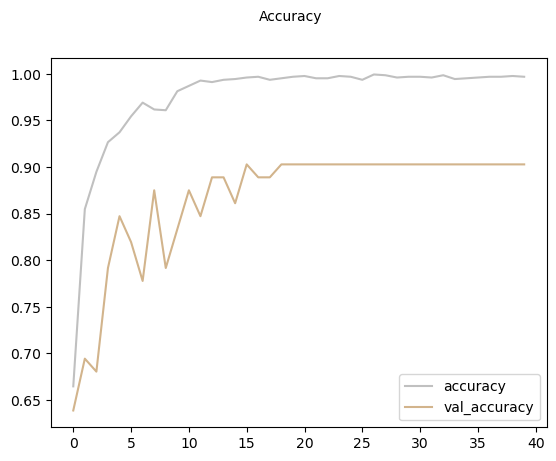

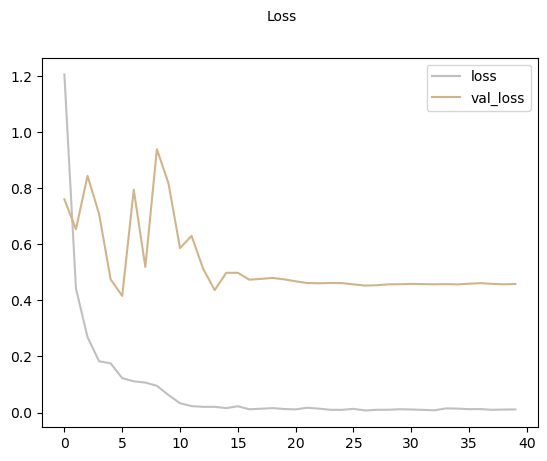

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 388ms/step
              precision    recall  f1-score   support

           0     0.8760    0.8833    0.8797       120
           1     0.8679    0.9020    0.8846        51
           2     1.0000    0.9815    0.9907        54
           3     0.8409    0.8222    0.8315        90

    accuracy                         0.8857       315
   macro avg     0.8962    0.8972    0.8966       315
weighted avg     0.8859    0.8857    0.8857       315

The Cohen's Kappa Score is: 0.8407750631844987
The execution time is 538.7158403396606 seconds


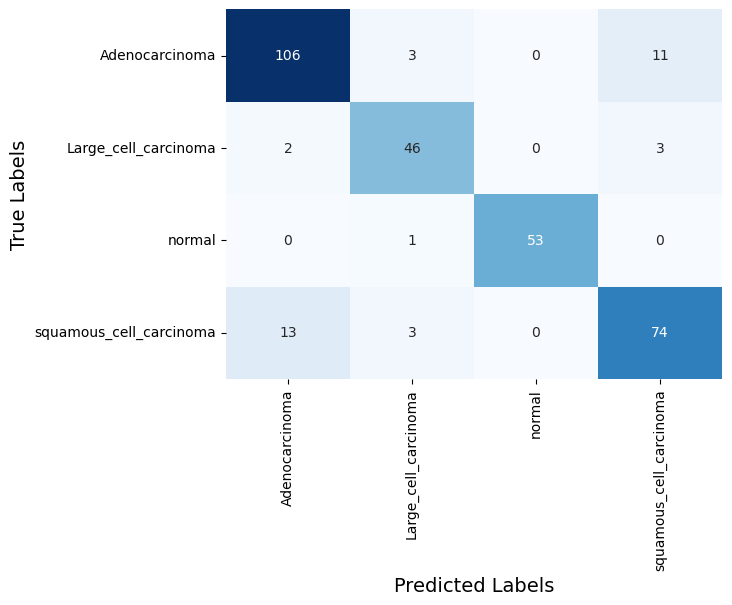

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_24      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_24[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 330ms/step - accuracy: 0.5638 - loss: 1.6036 - val_accuracy: 0.7222 - val_loss: 0.7171 - learning_rate: 0.0010
Epoch 2/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 298ms/step - accuracy: 0.8138 - loss: 0.5320 - val_accuracy: 0.7222 - val_loss: 0.6046 - learning_rate: 0.0010
Epoch 3/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 311ms/step - accuracy: 0.8903 - loss: 0.2530 - val_accuracy: 0.8194 - val_loss: 0.5612 - learning_rate: 0.0010
Epoch 4/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 296ms/step - accuracy: 0.9257 - loss: 0.2328 - val_accuracy: 0.7778 - val_loss: 0.4632 - learning_rate: 0.0010
Epoch 5/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 319ms/step - accuracy: 0.9474 - loss: 0.1368 - val_accuracy: 0.8472 - val_loss: 0.3712 - learning_rate: 0.0010
Epoch 6/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 295ms/step - accuracy: 0.9571 - loss: 0.1022 - val_accuracy: 0.8750 - val_loss: 0.3614 - learning_rate: 0.0010
Epoch 7/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 12s 318ms/step - accuracy: 0.9572 - loss: 0.

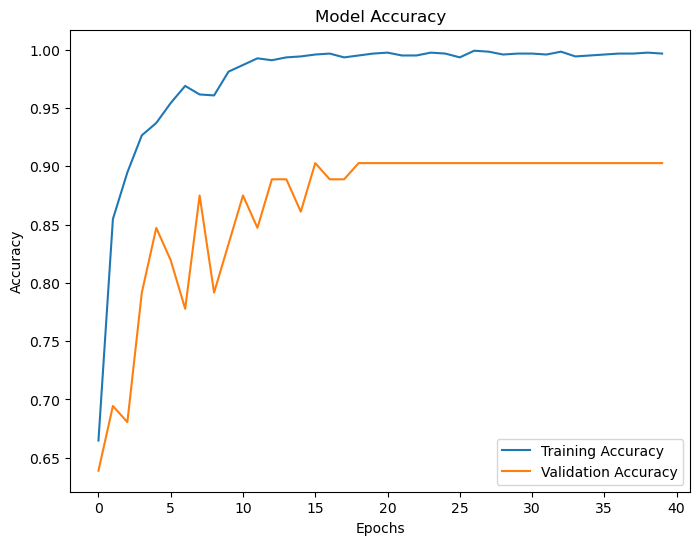

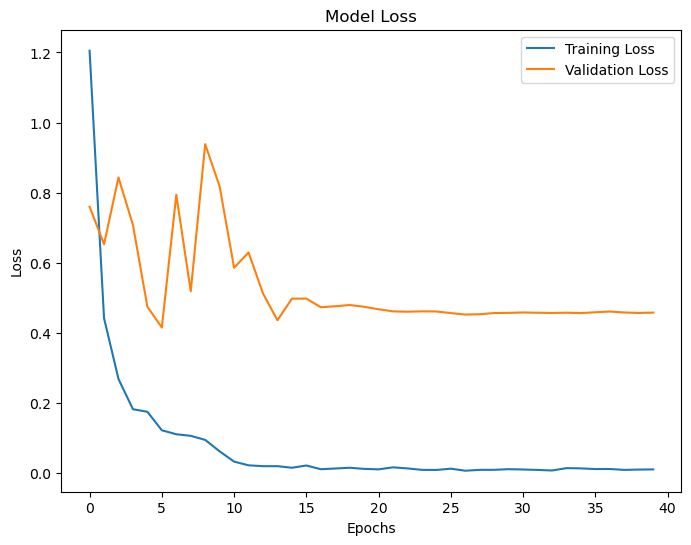

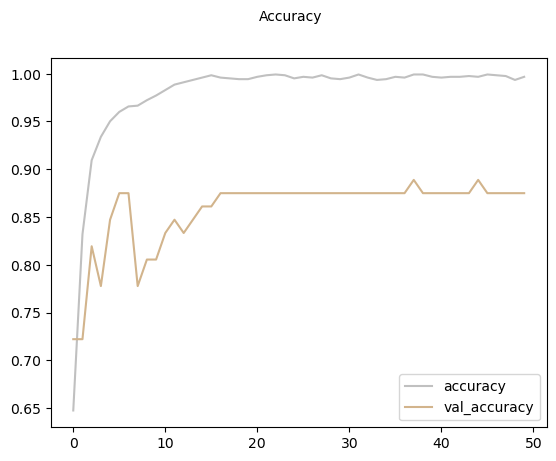

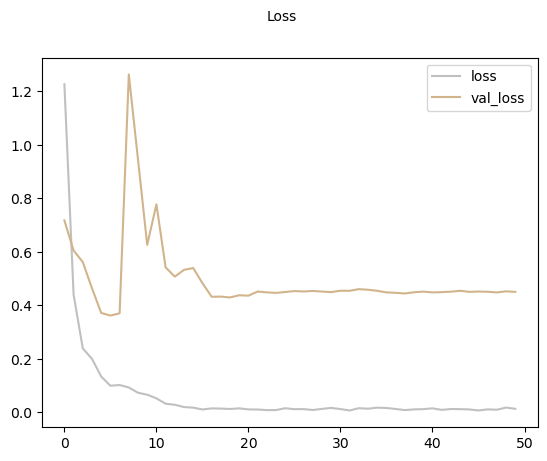

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 356ms/step
              precision    recall  f1-score   support

           0     0.8692    0.9417    0.9040       120
           1     0.8846    0.9020    0.8932        51
           2     1.0000    0.9815    0.9907        54
           3     0.9000    0.8000    0.8471        90

    accuracy                         0.9016       315
   macro avg     0.9135    0.9063    0.9087       315
weighted avg     0.9029    0.9016    0.9008       315

The Cohen's Kappa Score is: 0.8622921690569869
The execution time is 604.27610206604 seconds


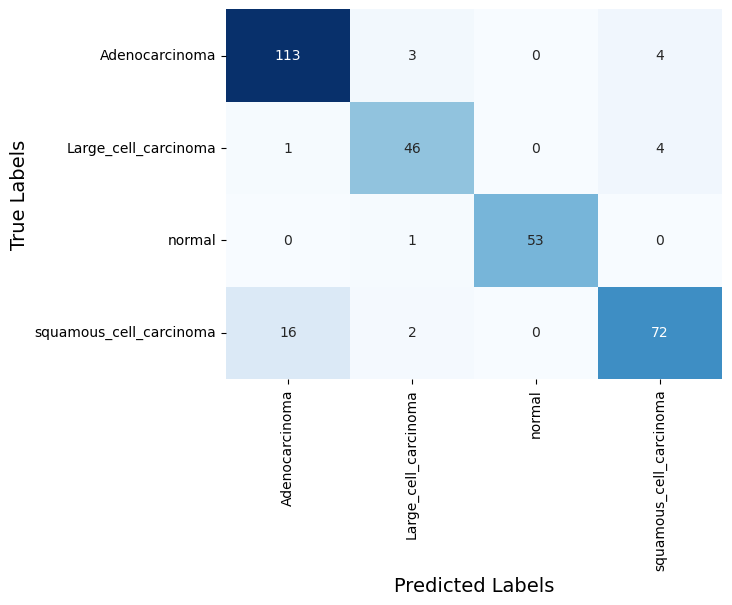

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_25      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_25[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 548ms/step - accuracy: 0.5620 - loss: 1.5309 - val_accuracy: 0.5694 - val_loss: 0.8632 - learning_rate: 0.0010
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 498ms/step - accuracy: 0.8267 - loss: 0.4436 - val_accuracy: 0.6528 - val_loss: 0.8350 - learning_rate: 0.0010
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 494ms/step - accuracy: 0.8820 - loss: 0.3593 - val_accuracy: 0.6667 - val_loss: 0.7015 - learning_rate: 0.0010
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 530ms/step - accuracy: 0.9403 - loss: 0.1628 - val_accuracy: 0.7500 - val_loss: 0.6924 - learning_rate: 0.0010
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 528ms/step - accuracy: 0.9529 - loss: 0.1191 - val_accuracy: 0.8333 - val_loss: 0.4765 - learning_rate: 0.0010
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 506ms/step - accuracy: 0.9539 - loss: 0.1328 - val_accuracy: 0.7917 - val_loss: 0.7893 - learning_rate: 0.0010
Epoch 7/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 522ms/step - accuracy: 0.9641 - loss: 0.

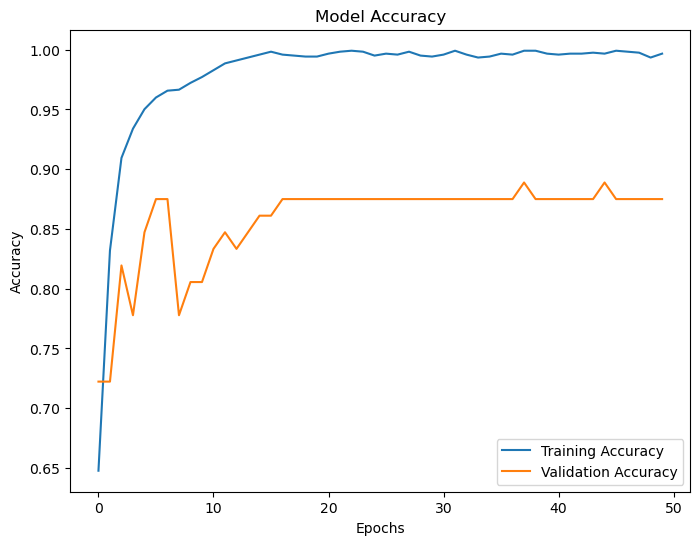

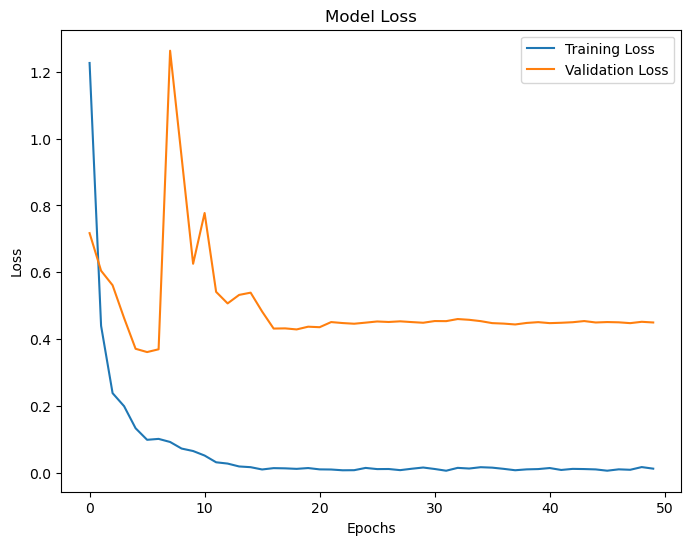

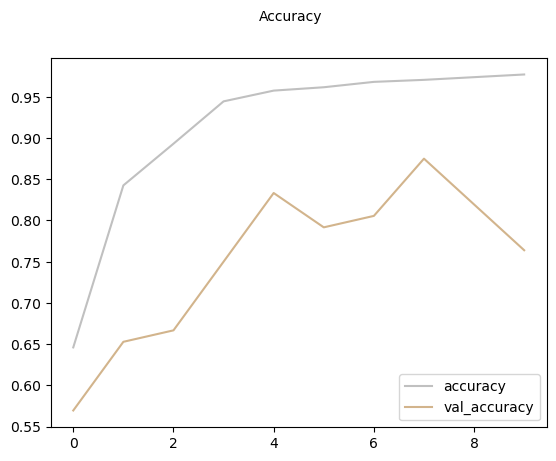

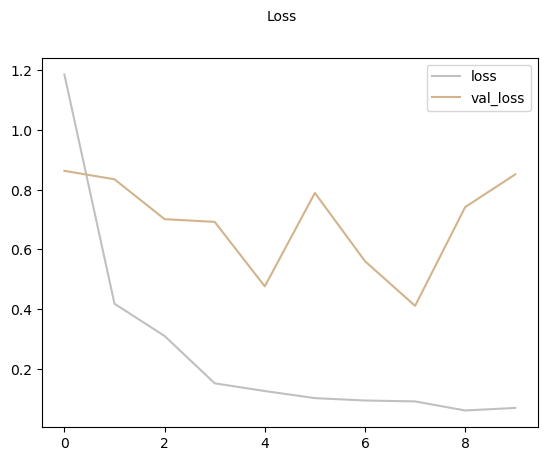

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 324ms/step
              precision    recall  f1-score   support

           0     0.8636    0.7917    0.8261       120
           1     0.8696    0.7843    0.8247        51
           2     1.0000    1.0000    1.0000        54
           3     0.7238    0.8444    0.7795        90

    accuracy                         0.8413       315
   macro avg     0.8643    0.8551    0.8576       315
weighted avg     0.8480    0.8413    0.8424       315

The Cohen's Kappa Score is: 0.7791426528122503
The execution time is 109.76513433456421 seconds


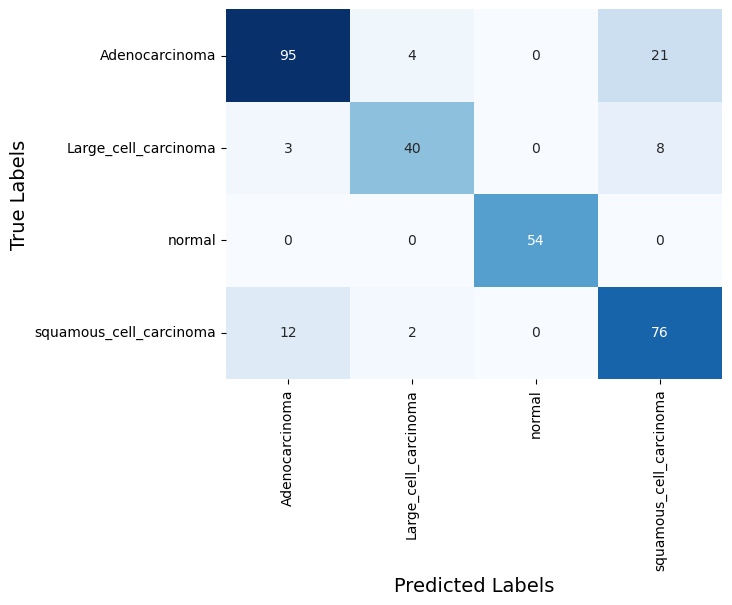

Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_26[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 540ms/step - accuracy: 0.5249 - loss: 1.5785 - val_accuracy: 0.6250 - val_loss: 0.7949 - learning_rate: 0.0010
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 521ms/step - accuracy: 0.8258 - loss: 0.5191 - val_accuracy: 0.6250 - val_loss: 0.8246 - learning_rate: 0.0010
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 490ms/step - accuracy: 0.8699 - loss: 0.3985 - val_accuracy: 0.6944 - val_loss: 0.6365 - learning_rate: 0.0010
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 500ms/step - accuracy: 0.9365 - loss: 0.1801 - val_accuracy: 0.7500 - val_loss: 0.6255 - learning_rate: 0.0010
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 514ms/step - accuracy: 0.9596 - loss: 0.1248 - val_accuracy: 0.7222 - val_loss: 0.7840 - learning_rate: 0.0010
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 532ms/step - accuracy: 0.9687 - loss: 0.0992 - val_accuracy: 0.7361 - val_loss: 0.7430 - learning_rate: 0.0010
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 501ms/step - accuracy: 0.9752 - loss: 0.

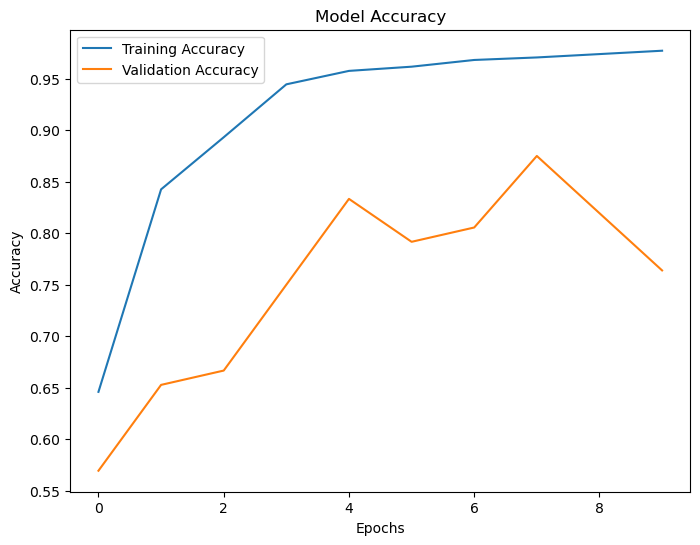

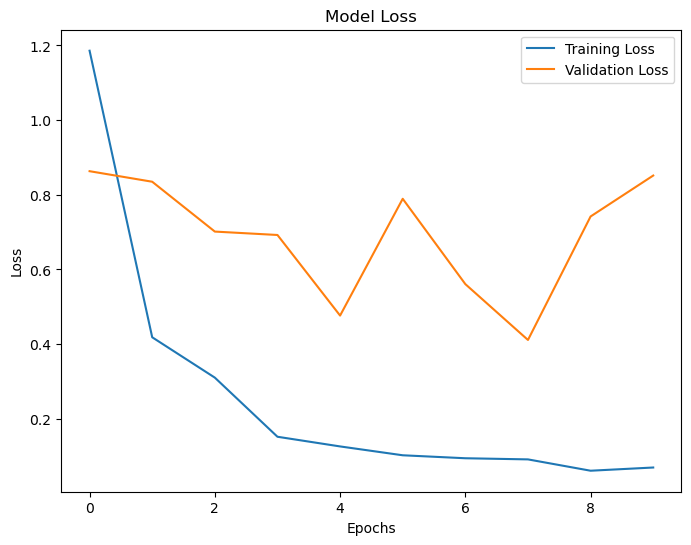

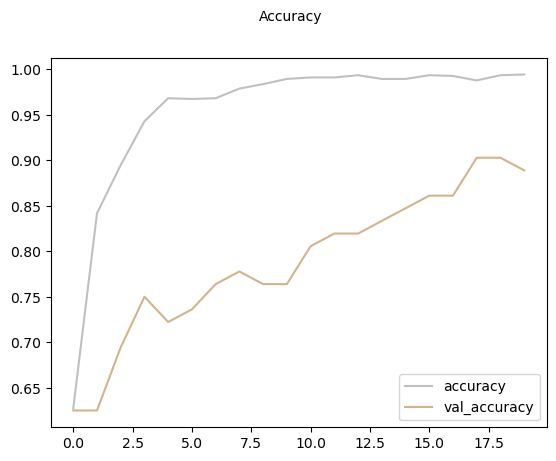

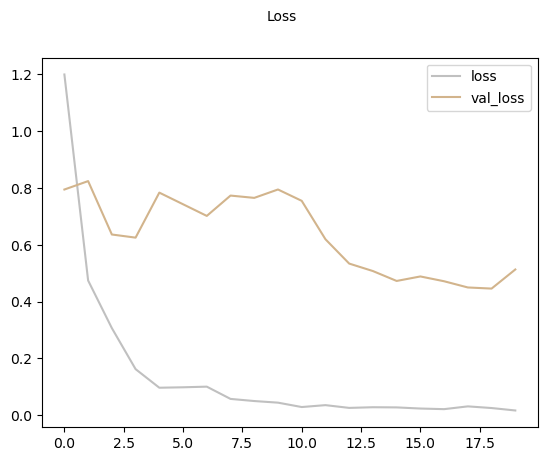

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 341ms/step
              precision    recall  f1-score   support

           0     0.8879    0.8583    0.8729       120
           1     0.8889    0.9412    0.9143        51
           2     1.0000    0.9815    0.9907        54
           3     0.8478    0.8667    0.8571        90

    accuracy                         0.8952       315
   macro avg     0.9062    0.9119    0.9087       315
weighted avg     0.8958    0.8952    0.8953       315

The Cohen's Kappa Score is: 0.8544301138511953
The execution time is 211.77379989624023 seconds


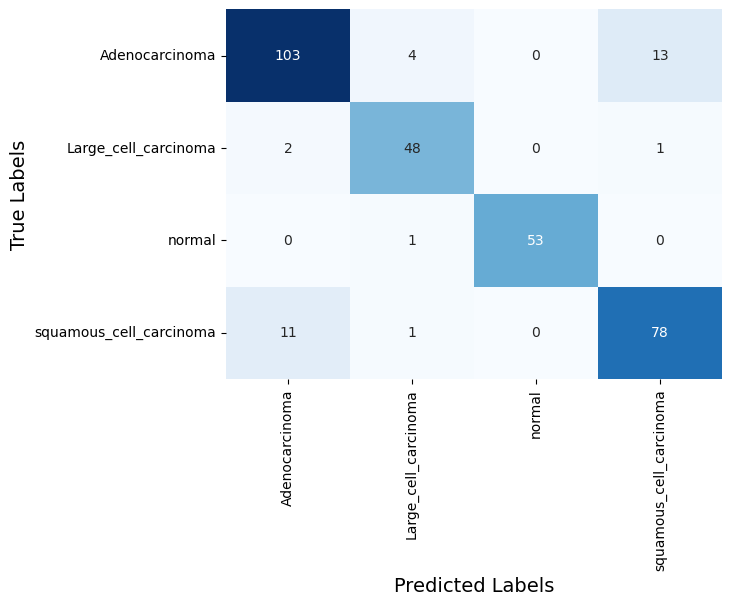

Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_27      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_27[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 20s 647ms/step - accuracy: 0.5619 - loss: 1.4671 - val_accuracy: 0.5000 - val_loss: 1.1449 - learning_rate: 0.0010
Epoch 2/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 598ms/step - accuracy: 0.8141 - loss: 0.4954 - val_accuracy: 0.5694 - val_loss: 1.1680 - learning_rate: 0.0010
Epoch 3/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 600ms/step - accuracy: 0.8929 - loss: 0.2965 - val_accuracy: 0.5833 - val_loss: 1.3172 - learning_rate: 0.0010
Epoch 4/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 606ms/step - accuracy: 0.9081 - loss: 0.2563 - val_accuracy: 0.5556 - val_loss: 1.4954 - learning_rate: 0.0010
Epoch 5/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 642ms/step - accuracy: 0.9526 - loss: 0.1144 - val_accuracy: 0.6111 - val_loss: 1.3557 - learning_rate: 5.0000e-04
Epoch 6/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 578ms/step - accuracy: 0.9801 - loss: 0.0751 - val_accuracy: 0.6944 - val_loss: 1.0456 - learning_rate: 5.0000e-04
Epoch 7/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 611ms/step - accuracy: 0.9758 - 

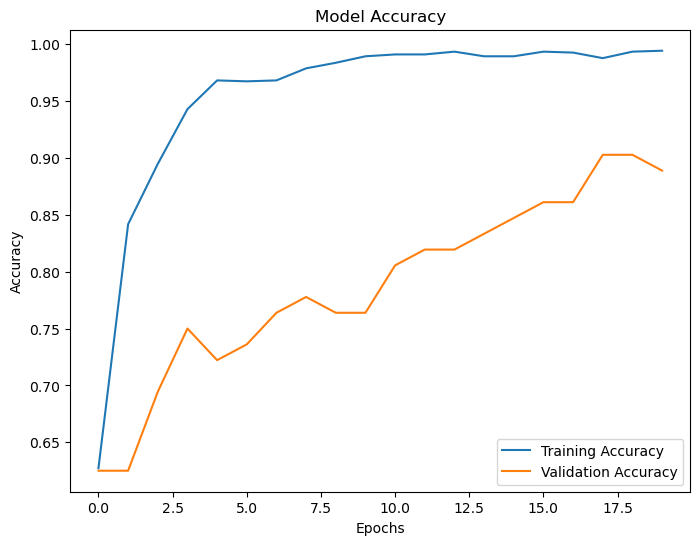

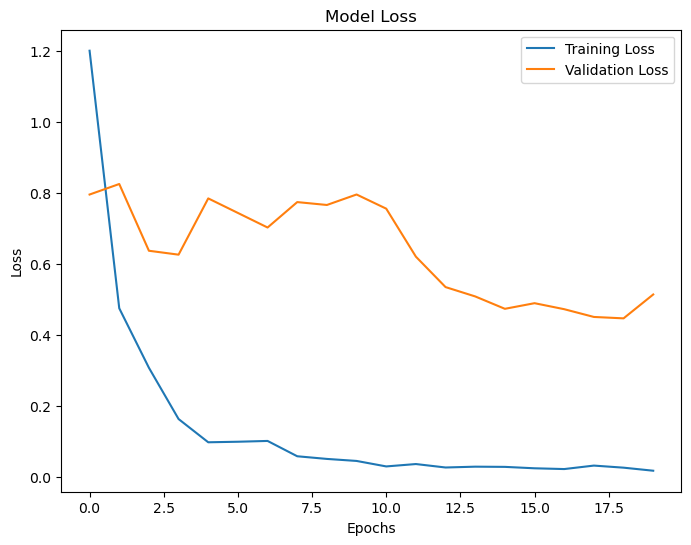

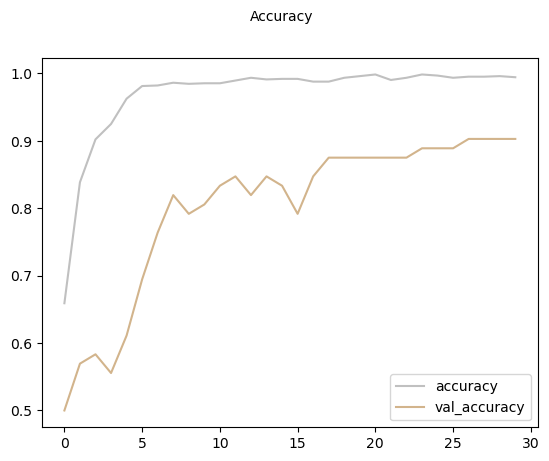

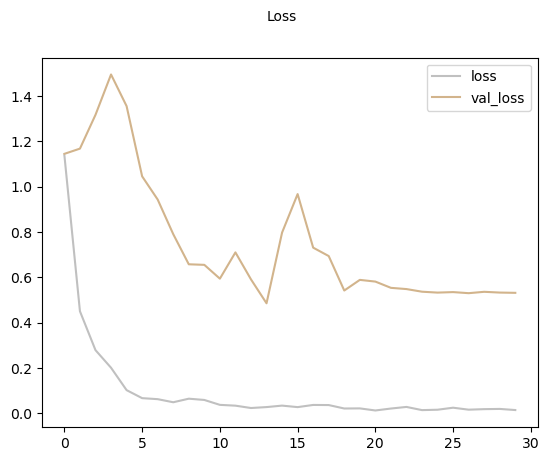

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 448ms/step
              precision    recall  f1-score   support

           0     0.8480    0.8833    0.8653       120
           1     0.9020    0.9020    0.9020        51
           2     1.0000    0.9815    0.9907        54
           3     0.8488    0.8111    0.8295        90

    accuracy                         0.8825       315
   macro avg     0.8997    0.8945    0.8969       315
weighted avg     0.8830    0.8825    0.8825       315

The Cohen's Kappa Score is: 0.8358959195742164
The execution time is 374.2882122993469 seconds


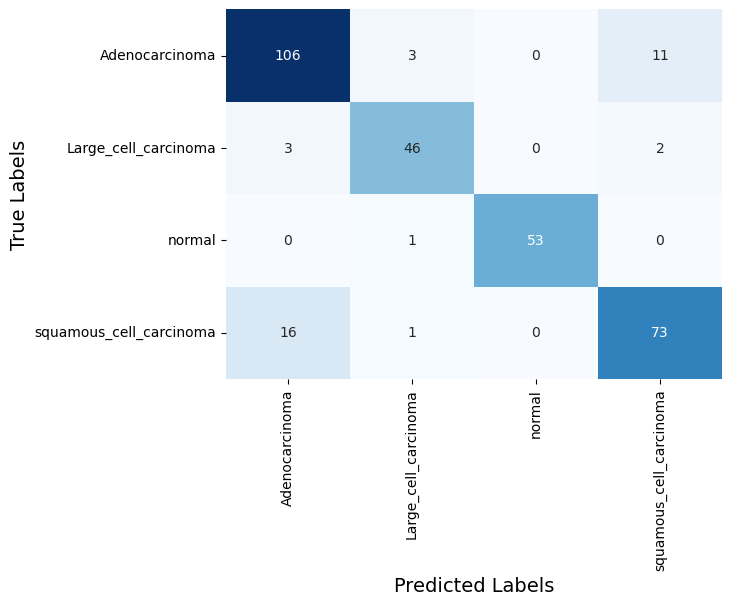

Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_28      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_28[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 17s 604ms/step - accuracy: 0.5602 - loss: 1.4458 - val_accuracy: 0.5833 - val_loss: 0.7767 - learning_rate: 0.0010
Epoch 2/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 528ms/step - accuracy: 0.8397 - loss: 0.4540 - val_accuracy: 0.5833 - val_loss: 0.8844 - learning_rate: 0.0010
Epoch 3/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 536ms/step - accuracy: 0.8827 - loss: 0.2987 - val_accuracy: 0.6389 - val_loss: 0.6355 - learning_rate: 0.0010
Epoch 4/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 572ms/step - accuracy: 0.9356 - loss: 0.1922 - val_accuracy: 0.7639 - val_loss: 0.5993 - learning_rate: 0.0010
Epoch 5/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 567ms/step - accuracy: 0.9606 - loss: 0.1154 - val_accuracy: 0.7222 - val_loss: 0.9786 - learning_rate: 0.0010
Epoch 6/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 535ms/step - accuracy: 0.9474 - loss: 0.1322 - val_accuracy: 0.8194 - val_loss: 0.5750 - learning_rate: 0.0010
Epoch 7/40
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 548ms/step - accuracy: 0.9677 - loss: 0.

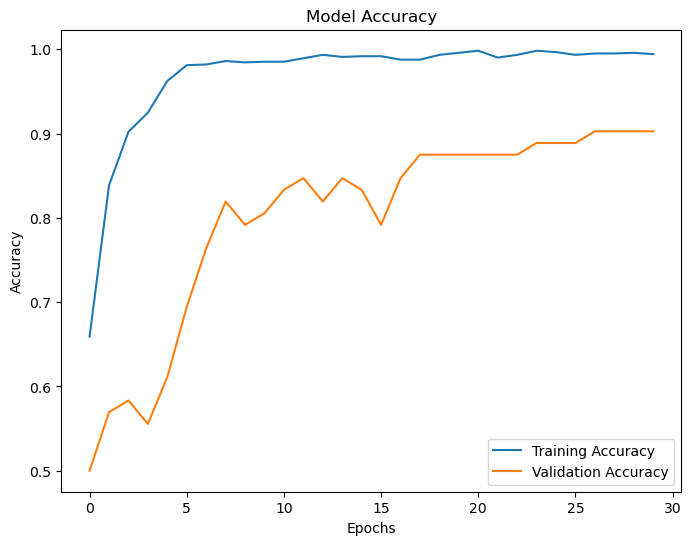

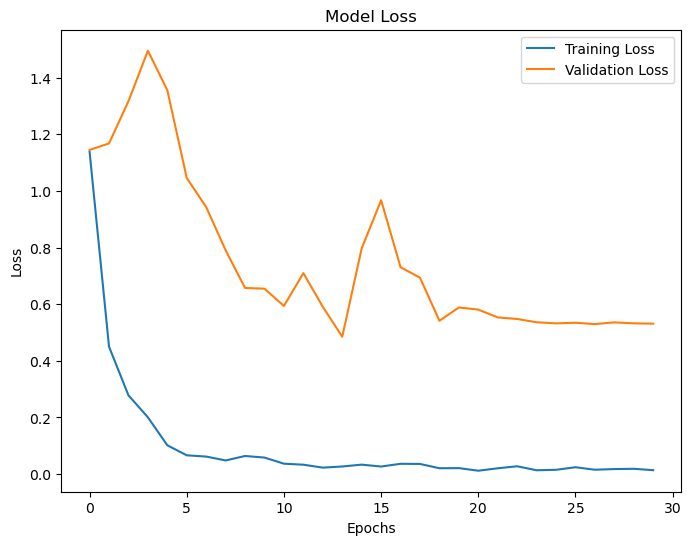

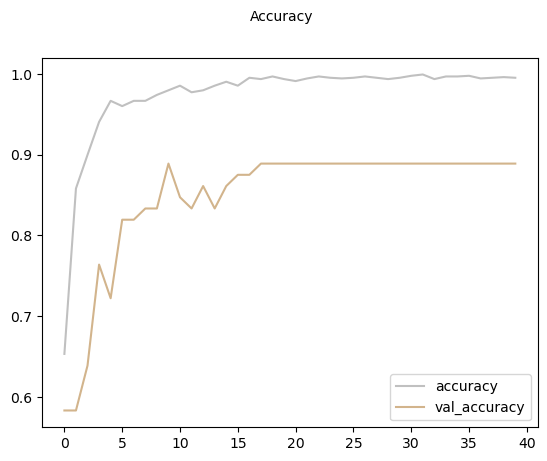

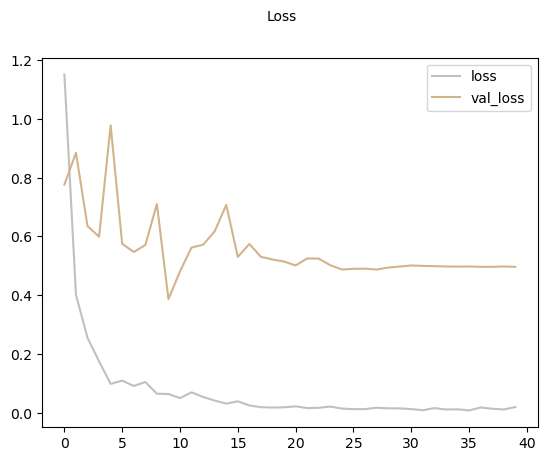

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 357ms/step
              precision    recall  f1-score   support

           0     0.8516    0.9083    0.8790       120
           1     0.9200    0.9020    0.9109        51
           2     1.0000    0.9815    0.9907        54
           3     0.8690    0.8111    0.8391        90

    accuracy                         0.8921       315
   macro avg     0.9102    0.9007    0.9049       315
weighted avg     0.8931    0.8921    0.8919       315

The Cohen's Kappa Score is: 0.8489272565697601
The execution time is 445.702196598053 seconds


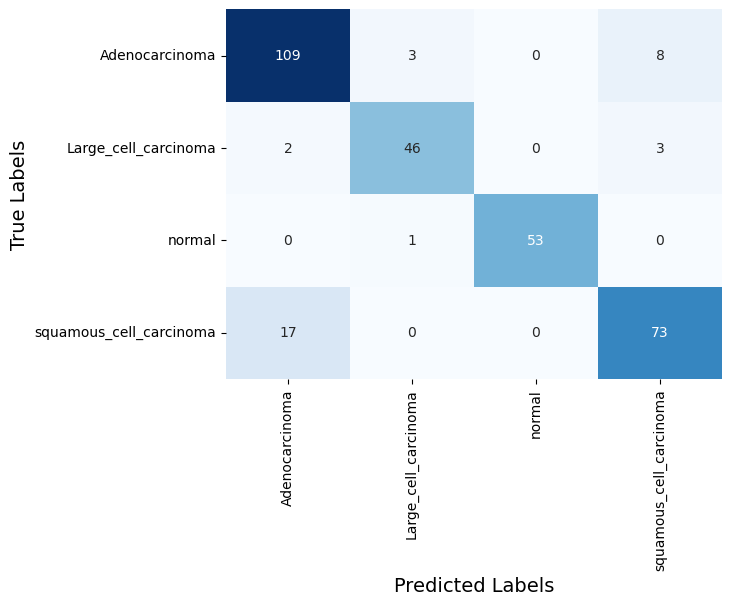

Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_29      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ input_layer_29[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (ReLU)              │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_activati… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      1,536 │ block1a_project_… │
│ (Conv2D)            │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (ReLU)              │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv_pad  │ (None, None,      │          0 │ block2a_expand_a… │
│ (ZeroPadding2D)     │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_dwconv      │ (None, None,      │        864 │ block2a_dwconv_p… │
│ (DepthwiseConv2D)   │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_bn          │ (None, None,      │        384 │ block2a_dwconv[0… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_activation  │ (None, None,      │          0 │ block2a_bn[0][0]

 Total params: 5,509,284 (21.02 MB)

 Trainable params: 2,099,332 (8.01 MB)

 Non-trainable params: 3,409,952 (13.01 MB)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 17s 570ms/step - accuracy: 0.5538 - loss: 1.5634 - val_accuracy: 0.5694 - val_loss: 0.8731 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 500ms/step - accuracy: 0.8325 - loss: 0.5007 - val_accuracy: 0.6944 - val_loss: 0.6865 - learning_rate: 0.0010
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 509ms/step - accuracy: 0.8753 - loss: 0.3352 - val_accuracy: 0.6667 - val_loss: 0.6674 - learning_rate: 0.0010
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 521ms/step - accuracy: 0.9229 - loss: 0.2548 - val_accuracy: 0.7083 - val_loss: 0.5609 - learning_rate: 0.0010
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 536ms/step - accuracy: 0.9374 - loss: 0.1574 - val_accuracy: 0.8194 - val_loss: 0.6265 - learning_rate: 0.0010
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 540ms/step - accuracy: 0.9563 - loss: 0.1256 - val_accuracy: 0.7361 - val_loss: 0.5803 - learning_rate: 0.0010
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 521ms/step - accuracy: 0.9701 - loss: 0.

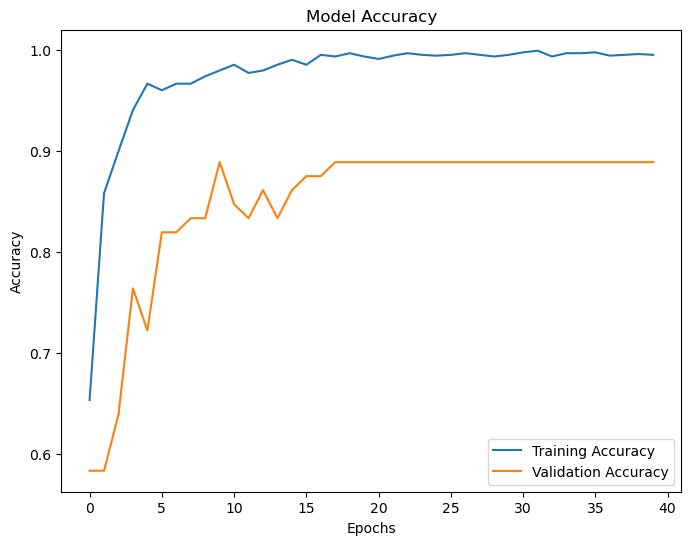

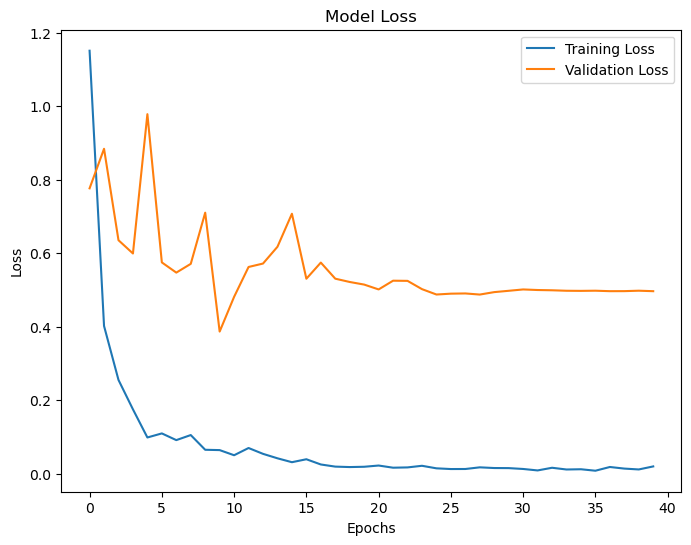

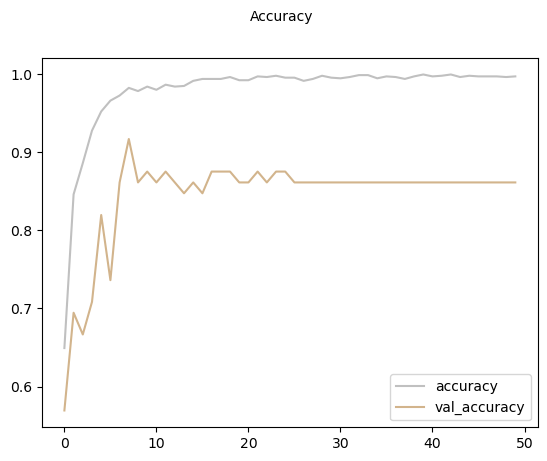

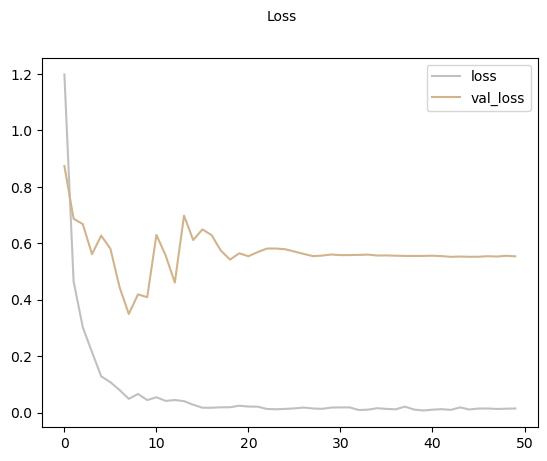

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 342ms/step
              precision    recall  f1-score   support

           0     0.8689    0.8833    0.8760       120
           1     0.9231    0.9412    0.9320        51
           2     1.0000    0.9815    0.9907        54
           3     0.8295    0.8111    0.8202        90

    accuracy                         0.8889       315
   macro avg     0.9054    0.9043    0.9047       315
weighted avg     0.8889    0.8889    0.8888       315

The Cohen's Kappa Score is: 0.8450478559682928
The execution time is 530.9670600891113 seconds


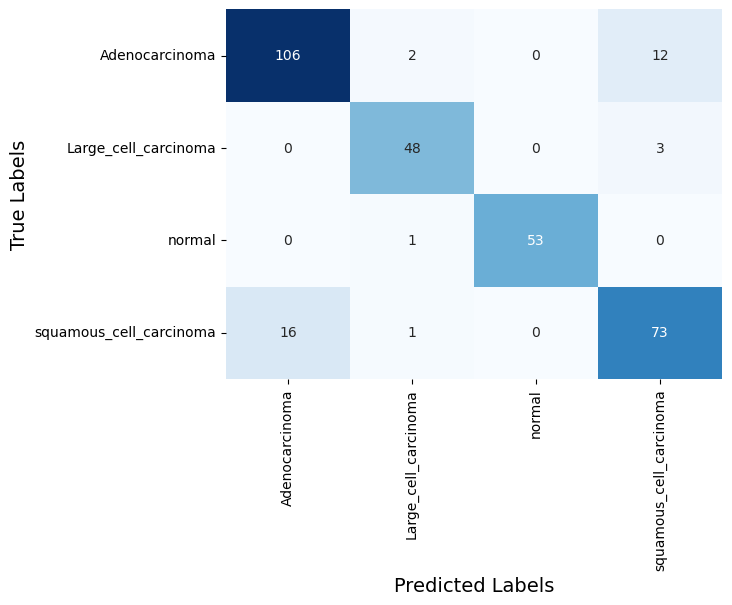

CPU times: total: 1h 1min 29s
Wall time: 1h 27min 34s


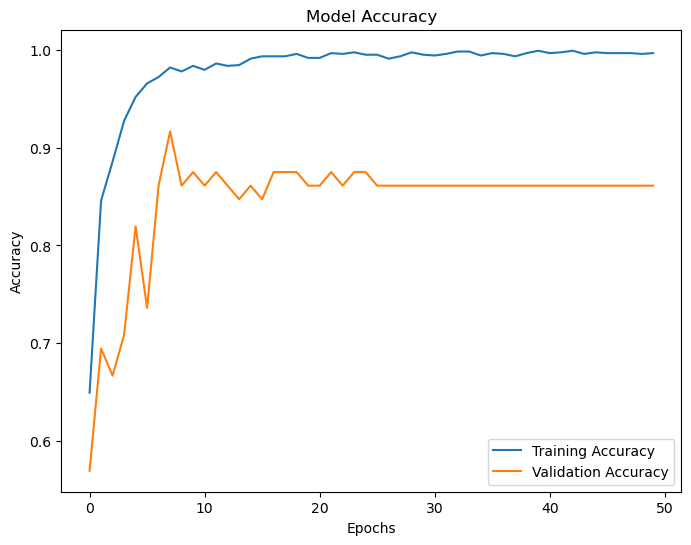

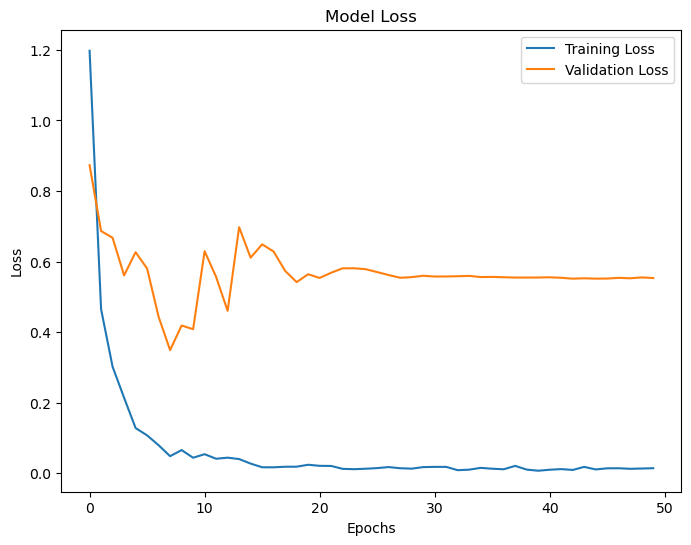

In [24]:
%%time

model_name = 'EfficientNetLiteB1'

x_train = tf.image.resize(x_train, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()

def build_model_EfficientNetLiteB1():
    base_model = EfficientNetLiteB1(weights='imagenet', include_top=True)#, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-5]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

for batch in batch_list:
    for epoch_num in epoch_list:
        start_time = time.time()
        
        model_EfficientNetLiteB1 = build_model_EfficientNetLiteB1()
        model_EfficientNetLiteB1.summary()
        
        lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)
        
        history_EfficientNetLiteB1 = model_EfficientNetLiteB1.fit(x_train, y_train, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])
        
        end_time = time.time()
        
        fig = plt.figure()
        plt.plot(history_EfficientNetLiteB1.history['accuracy'], color='silver', label='accuracy')
        plt.plot(history_EfficientNetLiteB1.history['val_accuracy'], color='tan', label='val_accuracy')
        fig.suptitle('Accuracy', fontsize=10)
        plt.legend(loc="lower right")
        plt.show()
        
        fig = plt.figure()
        plt.plot(history_EfficientNetLiteB1.history['loss'], color='silver', label='loss')
        plt.plot(history_EfficientNetLiteB1.history['val_loss'], color='tan', label='val_loss')
        fig.suptitle('Loss', fontsize=10)
        plt.legend(loc="upper right")
        plt.show()
        
        y_pred = model_EfficientNetLiteB1.predict(x_test)
        
        y_pred_labels = np.argmax(y_pred, axis=1)
        y_test_labels = np.argmax(y_test, axis=1)
        
        all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch, history_EfficientNetLiteB1, start_time, end_time)